# ⭐AIFFEL 대전 1기 Exploration 20.cGAN⭐
>  프로젝트 소개: cGAN을 이용해 새로운 이미지를 생성하자

***

# ✅프로젝트 순서
## 0. 개념 정리
## 1. 프로젝트 시작
## 2. 회고
- 2-1. 루브릭 평가
- 2-2. 회고

***

# 0. 내용 정리
## 20-2. 조건 없는 생성모델(Unconditional Generative Model), GAN
GAN을 이용해 MNIST, CIFAR-10 등의 데이터셋을 학습하고 생성해 보신 적 있으신가요?  
성공적으로 학습되었다면, 아래와 같이 학습에 사용한 실제 손글씨 이미지와 매우 유사한 손글씨 이미지를 생성했을 것입니다.  

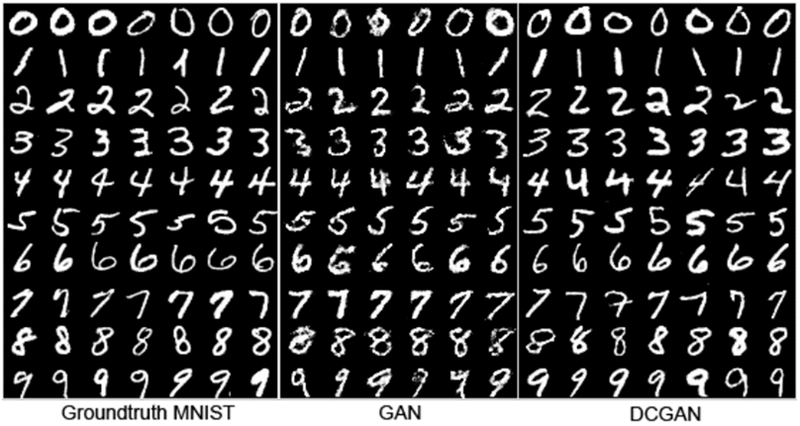  
> https://arxiv.org/pdf/1511.06434.pdf  

여기서 한 가지 생각해봅시다!  

예를 들어, 여러분이 "7"이라는 이미지를 만들고자 MNIST 데이터셋을 이용해 GAN을 열심히 학습시켰습니다.  
학습이 완료된 모델을 이용해 "7"이라 쓰여있는 이미지를 얻기 위해 어떤 방법을 이용해야 할까요?🤔  
여기서 할 수 있는 방법으로는 그저 다양한 노이즈를 계속 입력으로 넣어보고 "7"이라는 숫자 이미지가 생성되길 기다리는 것이죠.  
운이 좋다면 한 방(?)에 만들 수 있겠지만 운이 없다면 100개가 넘는 이미지를 생성해도 7이 나오지 않을 수 있습니다. (생각보다 가능성이 적지 않습니다😩)  
또한 혹시라도 "7" 이미지를 수만 개 만들어야 한다면, 새로운 노이즈 입력을 몇 번이나 넣어야 할지 상상만 해도 끔찍하네요…🤮  

이렇듯 잘 학습된 GAN을 이용해 실제 이미지를 생성할 때 조금 답답한 점이 하나 있다면, 바로 내가 원하는 종류의 이미지를 바로 생성해 내지 못한다는 것입니다.  
다시 말해서 일반적인 GAN과 같은 unconditioned generative model은 내가 생성하고자 하는 데이터에 대해 제어하기 힘들었습니다.  

우리가 원하는 이미지를 바로바로 생성해 내기 위해서는 어떤 방법을 이용해야 할까요? GAN이라는 생성모델에 내가 원하는 이미지를 만들기 위한 특정 조건을 줄 수는 없을까요?  
기약 없이 "7"이라 쓰인 이미지가 생성되길 기다릴 순 없으니까요.

## 20-3. 조건 있는 생성모델(Conditional Generative Model), cGAN
- Conditional Generative Adversarial Nets (cGAN)은 내가 원하는 종류의 이미지를 생성하고자 할 때 GAN이 가진 생성 과정의 불편함을 해소하여, 내가 원하는 종류의 이미지를 생성할 수 있도록 고안된 방법  
1) GAN의 목적 함수  
먼저 GAN에 대해 간단히 복습해봅시다. GAN 구조는 Generator 및 Discriminator라 불리는 두 신경망이 minimax game을 통해 서로 경쟁하며 발전합니다. 이를 아래와 같은 식으로 나타낼 수 있으며 Generator는 이 식을 최소화하려, Discriminator는 이 식을 최대화하려 학습합니다.   
$$\min_G \max_D V(D,G) = \mathbb{E}_{x\sim p_{data}~(x)}[log D(x)] + \mathbb{E}_{z\sim p_x(z)}[log(1-D(G(z)))]$$  

위 식에서 $z$는 임의 노이즈를, $D$와 $G$는 각각 Discriminator 및 Generator를 의미합니다.  

먼저 $D$의 입장에서 식을 바라봅시다.  
실제 이미지를 1, 가짜 이미지를 0으로 두었을 때, $D$는 이 식을 최대화해야 하며, 우변의 + 를 기준으로 양쪽의 항 $(logD(x))$및 $log(1-D(G(z)))$이 모두 최대가 되게 해야 합니다.  
이를 위해서 두 개의 log가 1이 되게 해야 합니다.  
$D(x)$는 1이 되도록, $D(G(z))$는 0이 되도록 해야 합니다.  
다시 말하면, 진짜 데이터($x$)를 진짜로, 가짜 데이터($G(z)$)를 가짜로 정확히 예측하도록 학습한다는 뜻입니다.  

이번엔 $G$의 입장에서 식을 바라봅시다. $D$와 반대로 $G$는 위 식을 최소화해야 하고 위 수식에서는 마지막 항 $log(1−D(G(z))$만을 최소화하면 됩니다 (우변의 첫 번째 항은 $G$와 관련이 없습니다).  
이를 최소화한다는 것은 log 내부가 0이 되도록 해야함을 뜻하며, $D(G(z))$가 1이 되도록 한다는 말과 같습니다.  
즉, G는 를 입력받아 생성한 데이터 $G(z)$를 D가 진짜 데이터라고 예측할 만큼 진짜 같은 가짜 데이터를 만들도록 학습한다는 뜻입니다.  

2) cGAN의 목적 함수  

GAN과 비교하며 알아볼 cGAN의 목적함수는 아래와 같습니다.
$$\min_G \max_D V(D,G) = \mathbb{E}_{x\sim p_{data}~(x)}[log D(x\lvert{y})] + \mathbb{E}_{z\sim p_x(z)}[log(1-D(G(z\lvert{y})))]$$  

위에서 GAN의 목적함수를 이해했고, GAN의 목적함수와 비교해 위 식에서 달라진 부분을 잘 찾아내셨다면 크게 어렵지 않습니다.  
위 식에서 바뀐 부분은 우변의 + 를 기준으로 양쪽 항에 $y$가 추가되었다는 것뿐입니다.  
$G$와 $D$의 입력에 특정 조건을 나타내는 정보인 $y$를 같이 입력한다는 것이죠.  
이외에는 GAN의 목적함수와 동일하므로 각각 $y$를 추가로 입력받아 $G$의 입장에서 식을 최소화하고, $D$의 입장에서 식을 최대화하도록 학습합니다.  

여기서 함께 입력하는 $y$는 어떠한 정보여도 상관없으며, MNIST 데이터셋을 학습시키는 경우 $y$는 0~9 까지의 label 정보가 됩니다.  
Generator가 어떠한 노이즈 $z$를 입력받았을 때, 특정 조건 $y$가 함께 입력되기 때문에, $y$를 통해 $z$를 어떠한 이미지로 만들어야 할지에 대한 방향을 제어할 수 있게 됩니다.  
조금 다르게 표현하면 $y$가 임의 노이즈 입력인 $z$의 가이드라고 할 수 있겠죠.  

3) 그림으로 이해하기  
이번에는 GAN과 cGAN의 Feed forward 과정을 그림으로 비교해서 봅시다.  
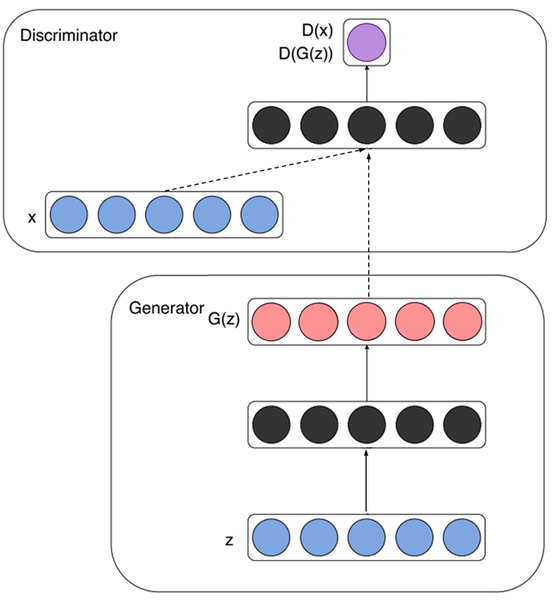  

GAN의 학습 과정은 위 그림과 같습니다.

- Generator  
노이즈 $z$(파란색)가 입력되고 특정 representation(검정색)으로 변환된 후 가짜 데이터 $G(z)$(빨간색)를 생성해 냅니다.  
- Discriminator  
실제 데이터 $x$와 Generator가 생성한 가짜 데이터 $G(z)$를 각각 입력받아 $D(x)$및 $D(G(z))$(보라색)를 계산하여 진짜와 가짜를 식별해 냅니다.  
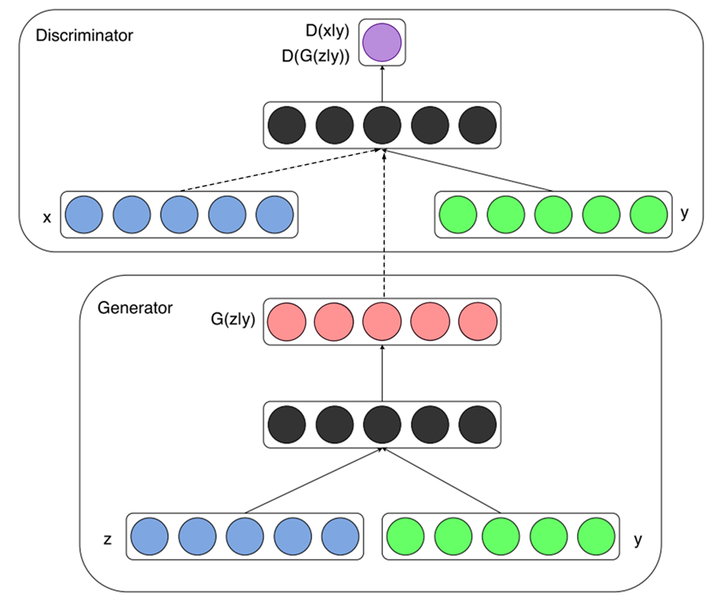  

이전 목적함수에서 확인했듯이, cGAN에서 바뀐 부분은 $y$라는 정보가 함께 입력된다는 것입니다.  

- **Generator** 노이즈 $z$(파란색)와 추가 정보 $y$(녹색)을 함께 입력받아 Generator 내부에서 결합되어 representation(검정색)으로 변환되며 가짜 데이터 $G(z∣y)$를 생성합니다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우$y$는 레이블 정보이며, 일반적으로 one-hot 벡터를 입력으로 넣습니다.  

- **Discriminator** 실제 데이터 $x$와 Generator가 생성한 가짜 데이터 $G(z∣y)$를 각각 입력받으며, 마찬가지로 $y$정보가 각각 함께 입력되어 진짜와 가짜를 식별합니다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우 실제 데이터 $x$와 $y$는 알맞은 한 쌍("7"이라 쓰인 이미지의 경우 레이블도 7)을 이뤄야 하며, 마찬가지로 Generator에 입력된 $y$와 Discriminator에 입력되는 $y$는 동일한 레이블을 나타내야 합니다.  

***

## 20-4. 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기
이제부터는 앞에서 계속 비교해온 GAN과 cGAN을 각각 간단하게 구현하고 실험해보겠습니다.  
간단한 실험을 위해 MNIST 데이터셋을 이용합니다. 실습 코드는 아래를 참고하여 작성했습니다.  
- 참고: [TF2-GAN](https://github.com/thisisiron/TF2-GAN)  

In [ ]:
import tensorflow_datasets as tfds

mnist, info =  tfds.load(
    "mnist", split="train", with_info=True
)

fig = tfds.show_examples(mnist, info)

여러 개의 숫자 이미지와 그에 알맞은 레이블이 출력되었을 것입니다. 이어서 아래 코드를 실행해 학습 전에 필요한 몇 가지 처리를 수행하는 함수를 정의합니다. 이미지 픽셀값을 -1~1 사이의 범위로 변경했고, 레이블 정보를 원-핫 인코딩(one-hot encoding)했습니다.  
GAN과 cGAN 각각을 실험해 보기 위해 label 정보 사용 유무에 따라 `gan_preprocessing()`과 `cgan_preprocessing()` 두 가지 함수를 구성해 놓았습니다.  

In [ ]:
import tensorflow as tf

BATCH_SIZE = 128

def gan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

def cgan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    
    label = tf.one_hot(data["label"], 10)
    return image, label

gan_datasets = mnist.map(gan_preprocessing).shuffle(1000).batch(BATCH_SIZE)
cgan_datasets = mnist.map(cgan_preprocessing).shuffle(100).batch(BATCH_SIZE)
print("✅")

원하는 대로 정확히 처리되었는지 한 개 데이터셋만 선택해 확인해봅시다. 이미지에 쓰인 숫자와 레이블이 일치해야 하고, 이미지 값의 범위가 -1~1 사이에 있어야 합니다.

In [ ]:
import matplotlib.pyplot as plt

for i,j in cgan_datasets : break

# 이미지 i와 라벨 j가 일치하는지 확인해 봅니다.     
print("Label :", j[0])
print("Image Min/Max :", i.numpy().min(), i.numpy().max())
plt.imshow(i.numpy()[0,...,0], plt.cm.gray)

원-핫 인코딩으로 표현된 Label과 출력된 이미지가 일치하는지 확인하고싶지만, 보는 법을 모르시겠다구요? 0과 1로 이루어진 원-핫 벡터에는 각자 고유의 인덱스가 있습니다. MNIST의 경우, 숫자 0은 `[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]`, 숫자 6은 `[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]`의 값을 가집니다. 이제 위 코드의 output을 확인해 이미지 i와 라벨 j가 일치하는지 확인해 봅니다

## GAN Generator 구성하기

이번 구현은 Tensorflow2의 Subclassing 방법을 이용하겠습니다. Subclassing 방법은 tensorflow.keras.Model 을 상속받아 클래스를 만들며, 일반적으로 `__init__()` 메서드 안에서 레이어 구성을 정의하고, 구성된 레이어를 `call()` 메서드에서 사용해 forward propagation을 진행합니다. 이러한 Subclassing 방법은 Pytorch의 모델 구성 방법과도 매우 유사하므로 이에 익숙해진다면 Pytorch의 모델 구성 방법도 빠르게 습득할 수 있습니다.  
먼저 GAN의 Generator를 아래와 같이 구현합니다.

In [ ]:
from tensorflow.keras import layers, Input, Model

class GeneratorGAN(Model):
    def __init__(self):
        super(GeneratorGAN, self).__init__()

        self.dense_1 = layers.Dense(128, activation='relu')
        self.dense_2 = layers.Dense(256, activation='relu')
        self.dense_3 = layers.Dense(512, activation='relu')
        self.dense_4 = layers.Dense(28*28*1, activation='tanh')

        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise):
        out = self.dense_1(noise)
        out = self.dense_2(out)
        out = self.dense_3(out)
        out = self.dense_4(out)
        return self.reshape(out)

print("✅")

`__init__()` 메서드 안에서 사용할 모든 레이어를 정의했습니다. 4개의 fully-connected 레이어 중 한 개를 제외하고 모두 ReLU 활성화를 사용하는 것으로 확인됩니다.
`call()` 메서드에서는 노이즈를 입력받아 `__init__()`에서 정의된 레이어들을 순서대로 통과합니다.
Generator는 숫자가 쓰인 이미지를 출력해야 하므로 마지막 출력은 layers.Reshape()을 이용해 (28,28,1) 크기로 변환됩니다. 

## cGAN Generator 구성하기

이번에는 cGAN의 Generator를 살펴봅시다.


In [ ]:
class GeneratorCGAN(Model):
    def __init__(self):
        super(GeneratorCGAN, self).__init__()
        
        self.dense_z = layers.Dense(256, activation='relu')
        self.dense_y = layers.Dense(256, activation='relu')
        self.combined_dense = layers.Dense(512, activation='relu')
        self.final_dense = layers.Dense(28 * 28 * 1, activation='tanh')
        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise, label):
        noise = self.dense_z(noise)
        label = self.dense_y(label)
        out = self.combined_dense(tf.concat([noise, label], axis=-1))
        out = self.final_dense(out)
        return self.reshape(out)
    
print("✅")

GAN의 Generator보다 구현이 복잡한듯 하지만 ,이전에 cGAN을 이해한 대로 두 구조의 차이점은 레이블 정보가 추가된다는 것 뿐입니다. 이번에는 여러분이 위 코드를 자세히 보고, 어떠한 연산이 이루어지는지 생각해봅시다.  
cGAN의 입력은 2개(노이즈 및 레이블 정보)라는 점을 기억해주세요. (이전 GAN코드와 비교하여 잘 생각해 봅시다)

## 20-5. 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기
### GAN Discriminator 구성하기

이전에 임의 노이즈 및 레이블 정보로부터 숫자 이미지를 생성하는 Generator를 구현했습니다. 이번에는 실제 이미지와 Generator가 생성한 이미지에 대해 진짜와 가짜를 식별하는 Discriminator를 구현해 보겠습니다.  

먼저 GAN의 Discriminator를 아래와 같이 구현합니다.

In [ ]:
class DiscriminatorGAN(Model):
    def __init__(self):
        super(DiscriminatorGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.blocks = []
        for f in [512, 256, 128, 1]:
            self.blocks.append(
                layers.Dense(f, activation=None if f==1 else "relu")
            )
        
    def call(self, x):
        x = self.flatten(x)
        for block in self.blocks:
            x = block(x)
        return x
    
print("✅")

여기에서는 `__init__()`에 `blocks`라는 리스트를 하나 만들어 놓고, for loop를 이용하여 필요한 레이어들을 차곡차곡 쌓아놓았습니다. 이러한 방식을 이용하면 각각의 fully-connected 레이어를 매번 정의하지 않아도 되므로 많은 레이어가 필요할 때 편리합니다. Discriminator의 입력은 Generator가 생성한 (28,28,1) 크기의 이미지이며, 이를 fully-connected 레이어로 학습하기 위해 `call()`에서는 가장 먼저 `layers.Flatten()`이 적용됩니다. 이어서 레이어들이 쌓여있는 `blocks`에 대해 for loop를 이용하여 레이어들을 순서대로 하나씩 꺼내 입력 데이터를 통과시킵니다. 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다. 

### cGAN Discriminator 구성하기

다음으로 구현할 cGAN의 Discriminator는 `Maxout`이라는 특별한 레이어가 사용됩니다. `Maxout`은 간단히 설명하면 두 레이어 사이를 연결할 때, 여러 개의 fully-connected 레이어를 통과시켜 그 중 가장 큰 값을 가져오도록 합니다. 만약 2개의 fully-connected 레이어를 사용할 때 `Maxout`을 식으로 표현하면 아래와 같습니다.   
$$max(w_1^Tx+b_1,\ w_2^Tx+b_2)$$  

Maxout에 대한 자세한 정보는 아래 출처에서 확인할 수 있습니다.  
- [[라온피플] Stochastice Pooling & Maxout](https://m.blog.naver.com/PostView.nhn?blogId=laonple&logNo=221259325819&proxyReferer=&proxyReferer=https:%2F%2Fwww.google.com%2F)  
- [[paper] Maxout Networks](https://arxiv.org/pdf/1302.4389.pdf)  

아래 코드와 같이 `Maxout`을 구성할 수 있습니다.
`tensorflow.keras.layers.Layer`를 상속받아 레이어를 정의했습니다.
이전에 모델을 정의한 것과 비슷하게 `__init__()`, `call()` 메서드를 구성합니다.  

In [ ]:
class Maxout(layers.Layer):
    def __init__(self, units, pieces):
        super(Maxout, self).__init__()
        self.dense = layers.Dense(units*pieces, activation="relu")
        self.dropout = layers.Dropout(.5)    
        self.reshape = layers.Reshape((-1, pieces, units))
    
    def call(self, x):
        x = self.dense(x)
        x = self.dropout(x)
        x = self.reshape(x)
        return tf.math.reduce_max(x, axis=1)

print("✅")

`Maxout` 레이어를 구성할 때 `units`과 `pieces`의 설정이 필요하며, `units` 차원 수를 가진 fully-connected 레이어를 `pieces`개 만큼 만들고 그 중 최대 값을 출력합니다. 예를 들어, 사용할 `Maxout` 레이어가 `units=100`, `pieces=10`으로 설정 된다면 입력으로 부터 100차원의 representation을 10개 만들고, 10개 중에서 최대값을 가져와 최종 1개의 100차원 representation이 출력됩니다. 식으로 나타낸다면 아래와 같습니다. (위 예시에서는 각각의 wx+b가 모두 100차원 입니다)  

$$max(w_1^Tx+b_1,\ w_2^Tx+b_2, \ …, \ w_9^Tx+b_9,\ w_{10}^Tx+b_{10})$$  



위에서 정의한 `Maxout` 레이어를 3번만 사용하면 아래와 같이 쉽게 cGAN의 Discriminator를 구성할 수 있습니다.

In [ ]:
class DiscriminatorCGAN(Model):
    def __init__(self):
        super(DiscriminatorCGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.image_block = Maxout(240, 5)
        self.label_block = Maxout(50, 5)
        self.combine_block = Maxout(240, 4)
        
        self.dense = layers.Dense(1, activation=None)
    
    def call(self, image, label):
        image = self.flatten(image)
        image = self.image_block(image)
        label = self.label_block(label)
        x = layers.Concatenate()([image, label])
        x = self.combine_block(x)
        return self.dense(x)
    
print("✅")

GAN의 Discriminator와 마찬가지로 Generator가 생성한 (28,28,1) 크기의 이미지가 입력되므로, `layers.Flatten()`이 적용됩니다. 그리고 이미지 입력 및 레이블 입력 각각은 `Maxout` 레이어를 한번씩 통과한 후 서로 결합되어 `Maxout` 레이어를 한번 더 통과합니다. 마지막 fully-connected 레이어를 통과하면 진짜 및 가짜 이미지를 나타내는 1개의 값이 출력됩니다.

## 20-6. 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기

이전에 정의한 Generator 및 Discriminator를 이용해 MINST를 학습하고 각 모델로 직접 숫자 손글씨를 생성해봅시다.
우선 GAN, cGAN 각각의 모델 학습에 공통적으로 필요한 loss function과 optimizer를 정의합니다.
진짜 및 가짜를 구별하기 위해 `Binary Cross Entropy`를 사용하고, `Adam optimizer`를 이용해 학습하겠습니다.

In [ ]:
from tensorflow.keras import optimizers, losses

bce = losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

gene_opt = optimizers.Adam(1e-4)
disc_opt = optimizers.Adam(1e-4)    

print("✅")

### GAN으로 MNIST 학습하기

이전 단계에서 구성한 GeneratorGAN 및 DiscriminatorGAN 모델 클래스를 이용합니다.
여기서는 입력으로 사용되는 노이즈를 100차원으로 설정했으며, 하나의 배치 크기 데이터로 모델을 업데이트하는 함수를 아래와 같이 작성했습니다.

In [ ]:
gan_generator = GeneratorGAN()
gan_discriminator = DiscriminatorGAN()

@tf.function()
def gan_step(real_images):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        # Generator를 이용해 가짜 이미지 생성
        fake_images = gan_generator(noise)
        # Discriminator를 이용해 진짜 및 가짜이미지를 각각 판별
        real_out = gan_discriminator(real_images)
        fake_out = gan_discriminator(fake_images)
        # 각 손실(loss)을 계산
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    # gradient 계산
    gene_grad = tape.gradient(gene_loss, gan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, gan_discriminator.trainable_variables)
    # 모델 학습
    gene_opt.apply_gradients(zip(gene_grad, gan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, gan_discriminator.trainable_variables))
    return gene_loss, disc_loss

print("✅")

위 함수를 이용해 우선 10 epoch만큼 학습을 진행해 보겠습니다. 100번의 반복마다 각 손실(loss)을 출력하도록 했습니다.

In [ ]:
EPOCHS = 10
for epoch in range(1, EPOCHS+1):
    for i, images in enumerate(gan_datasets):
        gene_loss, disc_loss = gan_step(images)

        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i+1} ITER] G:{gene_loss}, D:{disc_loss}")

짧은 시간 학습된 모델을 테스트해 봅시다. 100차원 노이즈 입력을 10개 사용하여 10개의 숫자 손글씨 데이터를 생성해 시각화합니다.
경고메시지가 출력된다면 그냥 무시하셔도 됩니다.

In [ ]:
import numpy as np

noise = tf.random.normal([10, 100])

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

결과를 보니 아마도 10 epoch의 학습만으로는 좋은 결과를 기대할 수 없나 봅니다.  
위 구현을 그대로 500 epoch 학습한 가중치를 아래에 첨부했으니 한번 사용해 봅시다.  

첨부된 파일(GAN_500.zip)을 다운로드하여 아래와 같이 작업환경을 구성해 주세요.

$ mkdir -p ~/aiffel/conditional_generation/gan  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/GAN_500.zip  

$ mv GAN_500.zip ~/aiffel/conditional_generation/gan  

$ cd ~/aiffel/conditional_generation/gan && unzip GAN_500.zip  

In [ ]:
import os
weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/gan/GAN_500'

noise = tf.random.normal([10, 100]) 

gan_generator = GeneratorGAN()
gan_generator.load_weights(weight_path)

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

위에 보이는 10개의 결과 이미지는 서로 다른 숫자들이 시각화되었을 것입니다 (아닐 수도 있습니다).  
이러한 방법으로는 내가 원하는 특정 숫자 하나를 출력하기 위해 수많은 입력을 넣어야 할 수 있습니다. 내가 원하는 숫자를 바로 얻어내기 위해 아래에서 cGAN을 학습 시켜 봅시다.

### cGAN으로 MNIST 학습하기

이전 단계에서 구성한 GeneratorCGAN 및 DiscriminatorCGAN 모델 클래스를 이용합니다.  
위에서 실행했던 GAN 학습처럼 약간의 학습으로는 제대로 된 생성 결과를 얻을 수 없을 테니 이번에는 연습 삼아 1 epoch만 학습 시켜 보겠습니다.

In [ ]:
cgan_generator = GeneratorCGAN()
cgan_discriminator = DiscriminatorCGAN()

@tf.function()
def cgan_step(real_images, labels):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        fake_images = cgan_generator(noise, labels)
        
        real_out = cgan_discriminator(real_images, labels)
        fake_out = cgan_discriminator(fake_images, labels)
        
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    
    gene_grad = tape.gradient(gene_loss, cgan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, cgan_discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_grad, cgan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, cgan_discriminator.trainable_variables))
    return gene_loss, disc_loss


EPOCHS = 1
for epoch in range(1, EPOCHS+1):
    
    for i, (images, labels) in enumerate(cgan_datasets):
        gene_loss, disc_loss = cgan_step(images, labels)
    
        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i} ITER] G:{gene_loss}, D:{disc_loss}")

학습 과정에서 Generator 및 Discriminator에 레이블 정보만 추가로 입력했다는 점을 제외하면 위에서 학습한 GAN과 큰 차이는 없습니다.  
위 코드로 짧게나마 학습시켜봤는데, 충분한 학습이 되기엔 더 많은 시간을 투자해야 합니다.  
뒤에서 학습해야 할 것들이 많이 남아있으니, 시간을 아끼기 위해 위 코드로 500 epoch 학습한 가중치를 아래에 첨부했습니다.  

첨부된 파일(CGAN_500.zip)을 다운로드하여 아래와 같이 작업환경을 구성해 주세요.

$ mkdir -p ~/aiffel/conditional_generation/cgan  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/CGAN_500.zip  

$ mv CGAN_500.zip ~/aiffel/conditional_generation/cgan  

$ cd ~/aiffel/conditional_generation/cgan && unzip CGAN_500.zip

아래 코드의 가장 윗줄에 있는 `number`라는 변수에 숫자를 할당하지 않았습니다.  
`number`에 0~9 사이의 숫자 중 생성하길 원하는 숫자를 입력해 주시고 아래 코드를 실행시켜봅시다.  
경고메시지가 출력된다면 그냥 무시하셔도 됩니다.

In [ ]:
number = 8  # TODO : 생성할 숫자를 입력해 주세요!!

weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/cgan/CGAN_500'

noise = tf.random.normal([10, 100])

label = tf.one_hot(number, 10)
label = tf.expand_dims(label, axis=0)
label = tf.repeat(label, 10, axis=0)

generator = GeneratorCGAN()
generator.load_weights(weight_path)

output = generator(noise, label)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

출력된 10개 시각화 결과는 어떤가요? 아마도 number에 입력한 숫자에 해당하는 손글씨가 시각화되었을 것입니다.
cGAN을 사용해 조건을 주고 학습하면 이렇게 특정한 숫자를 만들어내기가 훨씬 쉬워졌습니다.😆

## 20-7. GAN의 입력에 이미지를 넣는다면? Pix2Pix

지금까지 cGAN에 대해 알아보고 실험해보면서, 작은 조건만으로 우리가 원하는 클래스의 이미지를 생성할 수 있음을 확인했습니다. 만약 입력자체가 조건이 된다면 어떨까요? cGAN과 같이 클래스 레이블 등의 조건을 함께 입력하는 것이 아니라, 조금 더 자세하게 내가 원하는 이미지를 얻기 위해 이미지를 조건으로 줄 수 없을까요? 이번에 소개드릴 **Pix2Pix**는 기존 노이즈 입력을 이미지로 변환하는 일반적인 GAN이 아니라, **이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델**입니다.  

Pix2Pix를 제안한 논문의 제목은 [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/pdf/1611.07004.pdf) 로 하고자 하는 바가 제목에 그대로 담겨 있습니다.  
Conditional Adversarial Networks로 **Image-to-Image Translation**을 수행한다는 뜻이죠.. Conditional Adversarial Networks는 이전까지 알아봤던 cGAN과 같은 구조를 말하는 것인데, Image-to-Image Translation이란 단어는 무엇을 뜻하는 걸까요? 아래 Pix2Pix 논문에서 수행한 결과를 먼저 살펴봅시다.  

이후 표기되는 이미지에 대한 출처가 명시되지 않은 경우, Pix2Pix 논문에서 가져왔음을 미리 알려드립니다.  

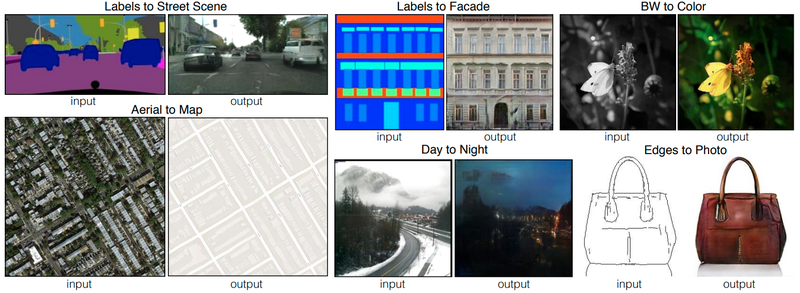

Image-to-Image Translation은 말 그대로 이미지 간 변환을 말합니다.😅  
위 결과의 첫 번째 [Labels to Street Scene] 이미지는 픽셀별로 레이블 정보만 존재하는 segmentation map을 입력으로 실제 거리 사진을 생성해 내었고, 이 외에 흑백 사진을 컬러로 변환하거나, 낮에 찍은 사진을 밤에 찍은 사진으로 변환하거나, 가방 스케치를 이용해 채색된 가방을 만들기도 합니다.  

한 이미지의 픽셀에서 다른 이미지의 픽셀로(pixel to pixel) 변환한다는 뜻에서 Pix2Pix라는 이름으로 불립니다. 이 구조는 최근 활발하게 연구 및 응용되는 GAN 기반의 Image-to-Image Translation 작업에서 가장 기초가 되는 연구입니다.  

노이즈와 레이블 정보를 함께 입력했던 cGAN은 fully-connected 레이어를 연속적으로 쌓아 만들었지만, 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용합니다. GAN 구조를 기반으로 하기 때문에 크게 Generator와 Discriminator 두 가지 구성 요소로 이루어집니다. 아래에서 자세히 알아보겠습니다.

### Pix2Pix (Generator)

Generator는 어떠한 이미지를 입력받아 변환된 이미지를 출력하기 위해 사용됩니다. 여기서 입력 이미지와 변환된 이미지의 크기는 동일해야 하며, 이러한 문제에서 흔히 사용되는 구조는 아래 그림과 같은 Encoder-Decoder 구조입니다.  
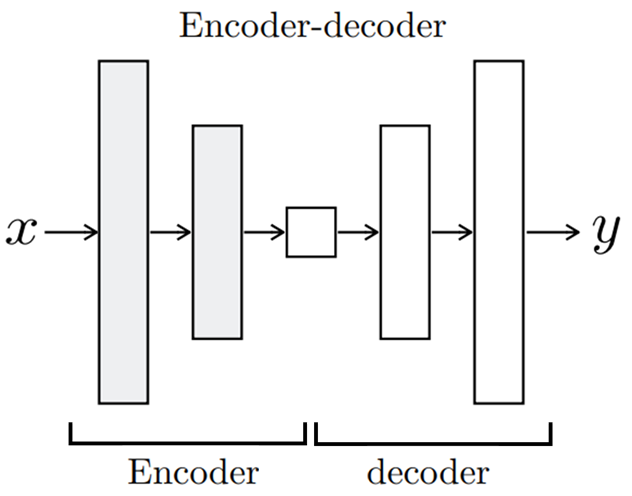  

Encoder에서 입력 이미지($x$)를 받으면 단계적으로 이미지를 down-sampling하면서 입력 이미지의 중요한 representation을 학습합니다. Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지($y$)를 생성해냅니다. 이러한 과정은 모두 convolution 레이어로 진행되며, 레이어 내의 수많은 파라미터를 학습하여 잘 변환된 이미지를 얻도록 합니다. 여기서 한 가지 짚고 넘어갈 부분은, Encoder의 최종 출력은 위 그림 중간에 위치한 가장 작은 사각형이며, `bottleneck` 이라고도 불리는 이 부분은 입력 이미지($x$)의 가장 중요한 특징만을 담고 있습니다.  

과연 이 중요하지만 작은 특징이 변환된 이미지($y$)를 생성하는데 충분한 정보를 제공할까요? 이와 같은 점을 보완하기 위해 논문에서는 Generator 구조를 하나 더 제안합니다.  
아래 그림과 같은 **U-Net **구조입니다.  

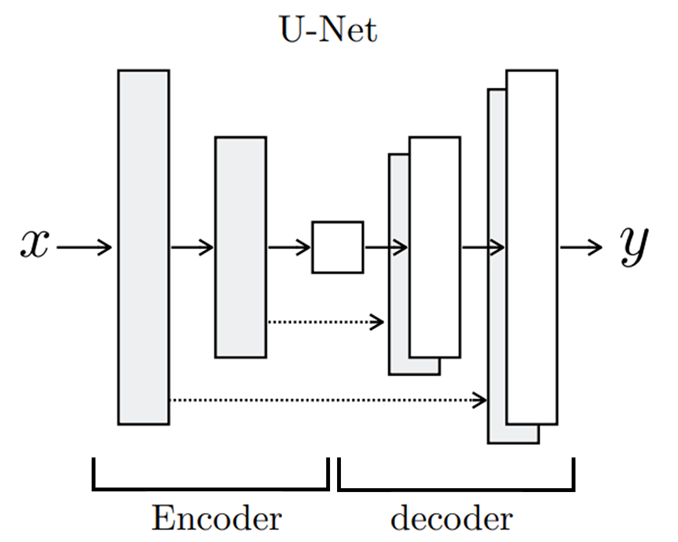  

위에서 살펴본 단순한 Encoder-Decoder로 구성된 Generator와 다른 점은, 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있다는 것입니다. Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로부터 더 많은 추가 정보를 이용하는 방법이며, 이러한 U-Net 구조의 Generator를 사용해 아래와 같이 단순한 Encoder-Decoder 구조의 Generator를 사용한 결과에 비해 비교적 선명한 결과를 얻을 수 있었습니다.  

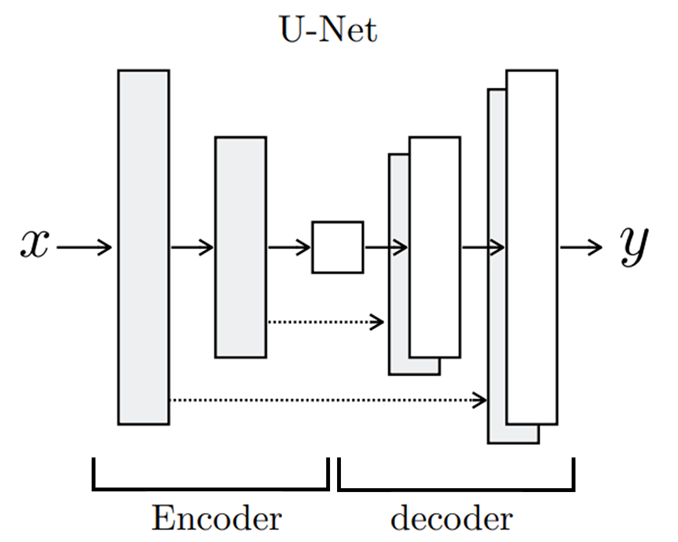  

여기서 U-Net은 이전에 segmentation 작업을 위해 제안된 구조입니다. U-Net에 대한 자세한 사항은 이번 노드의 학습 범위를 벗어나므로 아래에 잘 정리된 자료를 첨부합니다.   

- [U-Net 논문 리뷰](https://medium.com/@msmapark2/u-net-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0-u-net-convolutional-networks-for-biomedical-image-segmentation-456d6901b28a)

### Pix2Pix (Loss Function)

예상컨데 위 Generator 구조를 보면서 한 번쯤 생각해 보셨을 것 같은 사항으로는 "Generator만으로도 이미지 변환이 가능하지 않을까?" 입니다.  

당연하게도 변환하고자 하는 이미지를 Encoder에 입력하여 Decoder의 출력으로 변환된 이미지를 얻을 수 있습니다. 출력된 이미지와 실제 이미지의 차이로 L2(MSE), L1(MAE) 같은 손실을 계산한 후 이를 역전파하여 네트워크를 학습시키면 되겠죠. 이미지 변환이 가능은 하지만 문제는 변환된 이미지의 품질입니다. 아래 사진의 L1이라 써있는 결과가 Generator 만을 사용해 변환된 이미지와 실제 이미지 사이의 L1 손실을 이용해 만들어낸 결과입니다.  

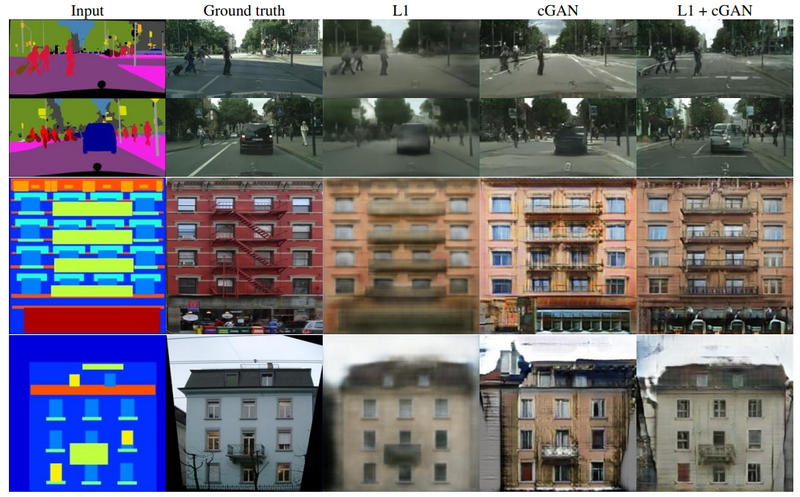  

L1 이라 쓰여있는 Generator만으로 생성된 결과는 매우 흐릿합니다. 이미지를 변환하는데 L1(MAE)이나 L2(MSE) 손실만을 이용해서 학습하는 경우 이렇게 결과가 흐릿해지는 경향이 있습니다. Generator가 단순히 이미지의 평균적인 손실만을 줄이고자 파라미터를 학습하기 때문에 이러한 현상이 불가피합니다.  

반면 위 그림의 cGAN이라 쓰여진 GAN 기반의 학습 방법은 비교적 훨씬 더 세밀한 정보를 잘 표현하고 있습니다. Discriminator를 잘 속이려면 Generator가 (Ground truth라고 쓰여진 이미지같이) 진짜 같은 이미지를 만들어야 하기 때문이죠. 논문에서는 L1손실과 GAN 손실을 같이 사용하면 더욱더 좋은 결과를 얻을 수 있다고 합니다 (위 그림의 L1+cGAN). 

### Pix2Pix (Discriminator)

위 결과에서 보듯 실제 같은 이미지를 얻기 위해서는 GAN의 학습 방법을 이용해야 하며, 위에서 설명한 Generator를 발전시킬 서포터이자 경쟁자, Discriminator가 필요하겠죠. 혹시 이전에 다뤘던 DCGAN의 Discriminator 기억하시나요? 아래 그림은 DCGAN의 Discriminator를 나타냅니다.  

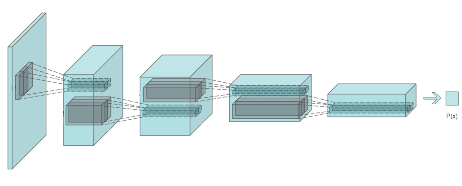  
> [출처 : https://sh-tsang.medium.com/review-dcgan-deep-convolutional-generative-adversarial-network-gan-ec390cded63c]  

DCGAN의 Discriminator는 생성된 가짜이미지 혹은 진짜이미지를 하나씩 입력받아 convolution 레이어를 이용해 점점 크기를 줄여나가면서, 최종적으로 하나의 이미지에 대해 하나의 확률값을 출력했습니다. Pix2Pix는 이 과정에서 의문을 갖습니다.  

> 하나의 전체 이미지에 대해 하나의 확률값만을 도출하는 것이 진짜 혹은 가짜를 판별하는 데 좋은 것일까?  

Pix2Pix는 이러한 의문점을 가지고 아래 그림과 같은 조금 다른 방식의 Discriminator를 사용합니다.  
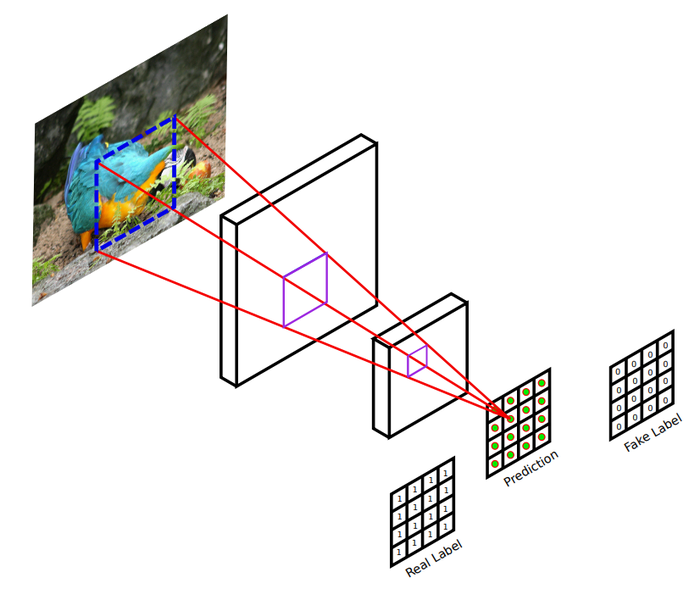  

> [출처 : https://arxiv.org/pdf/1803.07422.pdf]  

위 그림은 Pix2Pix에서 사용되는 Discriminator를 간략하게 나타냅니다. 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률값을 나타내는 최종 결과를 생성하는데, 그 결과는 하나의 값이 아닌 여러 개의 값을 갖습니다 (위 그림의 Prediction은 16개의 값을 가지고 있습니다). 위 그림에서 입력이미지의 파란색 점선은 여러 개의 출력 중 하나의 출력을 계산하기 위한 입력이미지의 receptive field 영역을 나타내고 있으며, 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률값을 도출한다는 것입니다.

이런 방식으로 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률값을 계산할 수 있으며 이 값을 평균하여 최종 Discriminator의 출력을 생성합니다. 이러한 방법은 이미지의 일부 영역(patch)을 이용한다고 하여 **PatchGAN**이라고 불립니다. 일반적으로 이미지에서 **거리가 먼 두 픽셀은 서로 연관성이 거의 없기 때문에** 특정 크기를 가진 **일부 영역에 대해서 세부적으로 진짜/가짜를 판별**하는 것이 Generator로 하여금 더 진짜 같은 이미지를 만들도록 하는 방법입니다.

아래 그림은 (위 그림의 파란색 점선 같은) 판별 영역을 다양한 크기로 실험하여 그 결과를 보여줍니다.  

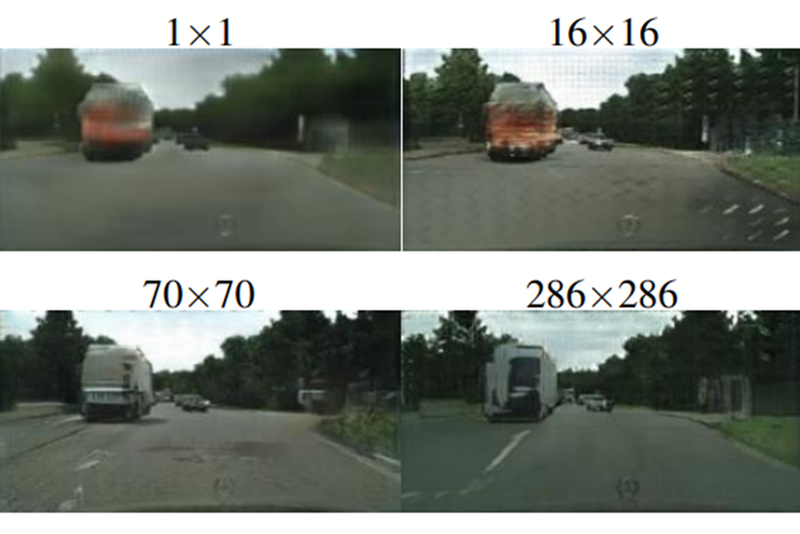  

마지막에 보이는 286x286이라 적힌 이미지는 DCGAN의 Discriminator와 같이 전체 이미지에 대해 하나의 확률값을 출력하여 진짜/가짜를 판별하도록 학습한 결과입니다 (입력 이미지 크기가 286x286 입니다). 70x70 이미지는 Discriminator입력 이미지에서 70x70 크기를 갖는 일부 영역에 대해서 하나의 확률값을 출력한 것이며, 16x16, 1x1로 갈수록 더 작은 영역을 보고 각각의 확률값을 계산하므로 Discriminator의 출력값의 개수가 더 많습니다. 위 4개의 이미지를 살펴보면, 너무 작은 patch를 사용한 결과(1x1, 16x16)는 품질이 좋지 않으며, 70x70 patch를 이용한 결과가 전체 이미지를 사용한 결과(286x286)보다 조금 더 사실적인 이미지를 생성하므로 PatchGAN의 사용이 성공적이라고 볼 수 있을 것 같습니다.  

지금까지 Pix2Pix의 Generator와 Discriminator, Loss function을 구성하는 기본 아이디어들에 대해서 간략하게 알아봤습니다. 다음 단계부터는 Pix2Pix를 구현하면서 더 자세히 이해해봅시다.

## 20-8. 난 스케치를 할 테니 너는 채색을 하거라 (1) 데이터 준비하기

이번에는 앞서 알아본 pix2pix 모델에 대해서 직접 구현하고 실험해봅시다. 사용해볼 데이터셋은 `Sketch2Pokemon`이라는 데이터셋입니다.  

- [Sketch2Pokemon info](https://www.kaggle.com/norod78/sketch2pokemon)  

위 출처에는 학습용 데이터 셋에 830개의 이미지가 있으며, 각 (256x256) 크기의 이미지 쌍이 나란히 붙어 (256x512) 크기의 이미지로 구성되어 있다고 합니다. 아래 링크에서 다운로드해서 직접 확인해봅시다. (위 출처에서 학습용 데이터셋만 따로 가져왔습니다)  

$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/sketch2pokemon.zip  

$ mv sketch2pokemon.zip ~/aiffel/conditional_generation  

$ cd ~/aiffel/conditional_generation && unzip sketch2pokemon.zip

In [ ]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/pokemon_pix2pix_dataset/train/'
print("number of train examples :", len(os.listdir(data_path)))

출처의 내용과 같이 830개 이미지가 있음을 확인할 수 있습니다.

이번에는 아래 코드를 이용해 각각의 이미지들이 어떻게 생겼는지 확인해 봅시다. 학습용 데이터셋에서 임의로 6장을 선택하여 시각화합니다.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

하나의 이미지에 포켓몬 스케치와 실제 포켓몬 이미지가 함께 포함되어 있음을 확인할 수 있습니다. 위 코드를 여러 번 반복 실행해 보면 일부는 제대로 스케치 되지 않은 이미지도 확인할 수 있습니다. 출처를 확인해보니 직접 그려서 만든 데이터셋이 아닌 스케치 생성 모델을 이용해서 만들었다고 하네요 😅

이미지를 하나 열어 아래와 같이 크기를 확인해 보겠습니다.

In [ ]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)으로 확인되었습니다. 모델 학습에 사용할 데이터를 (256, 256, 3) 크기의 2개 이미지로 분할하여 사용하면 될 것 같네요.

아래 코드로 이미지를 나누어 봅시다.

In [ ]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

위와 같이 두 개 이미지로 나누었습니다. 첫 번째 스케치를 다음 단계에서 구성할 Pix2Pix 모델에 입력하여 두 번째 그림과 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표입니다.  

앞서 살펴봤듯이 학습에 사용할 수 있는 데이터의 수는 약 800개뿐입니다. 학습에 사용하는 데이터의 다양성을 높이기 위해 아래 코드와 같이 여러 augmentation 방법을 적용해 보겠습니다.

In [ ]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

`apply_augmentation` 함수는 스케치 및 채색된 2개 이미지를 입력으로 받아 여러 가지 연산을 두 이미지에 동일하게 적용합니다.  
입력된 이미지에 어떠한 과정이 적용되는지 위 코드를 보면서 아래 퀴즈를 풀어봅시다.  

위와 같이 구성한 함수를 데이터에 적용해 시각화 해봅시다.

In [ ]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

매우 다양한 이미지가 생성됩니다. 여기서 사용한 augmentation 방법 외에 더 많은 방법을 활용한다면 더욱더 다양한 데이터셋을 만들어 좋은 일반화 결과를 기대해 볼 수 있습니다.😆  

마지막으로 위 과정들을 학습 데이터에 적용하며, 잘 적용되었는지 하나의 이미지만 시각화하여 확인해 보겠습니다.

In [ ]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## 20-9. 난 스케치를 할 테니 너는 채색을 하거라 (2) Generator 구성하기

이제부터 본격적으로 Pix2Pix 구조를 구현합니다. 앞서 cGAN 구현과 같이 Tensorflow의 Subclassing 방법을 이용해 모델을 만들겠습니다.  

### Generator의 구성요소 알아보기
먼저, pix2pix 논문에서 Generator를 구성하는데 필요한 정보를 아래에 가져왔습니다. 한번 읽어보시고 아래 질문에 답해봅시다.  

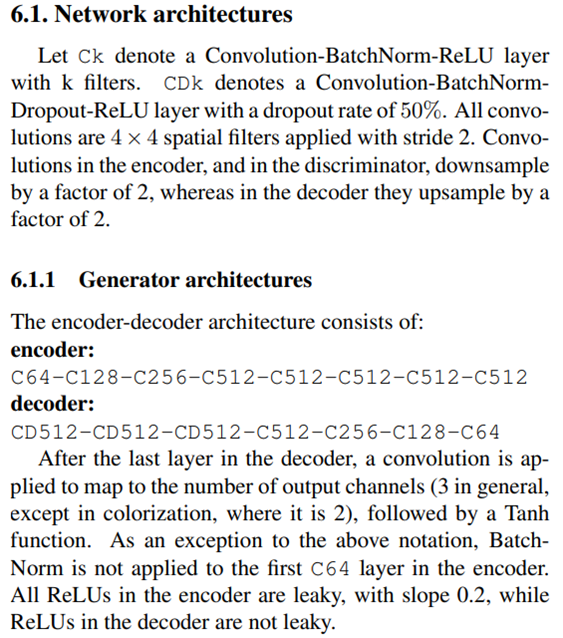  

Q6. 논문에서 표기한 encoder의 "C64"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?  
- 64개의 4x4 필터에 stride 2를 적용한 Convolution → 0.2 slope의 LeakyReLU  
(위 논문의 아래 단락에 BatchNorm을 사용하지 않는다고 쓰여 있습니다)  

Q7. 논문에서 표기한 decoder의 "CD512"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타내나요?  
- 512개의 4x4 필터에 stride 2를 적용한 (Transposed) Convolution → BatchNorm → 50% Dropout → ReLU  

아마도 위 두 개의 질문에 잘 답하셨다면, Generator를 구성하는데 필요한 레이어들은 대략적으로 숙지하셨으리라 생각됩니다.  
이번에는 아래와 같이 보기 쉽게 표현한 그림을 통해 Generator의 전체 구조를 머리속에 조금 더 자세히 그려봅시다.  

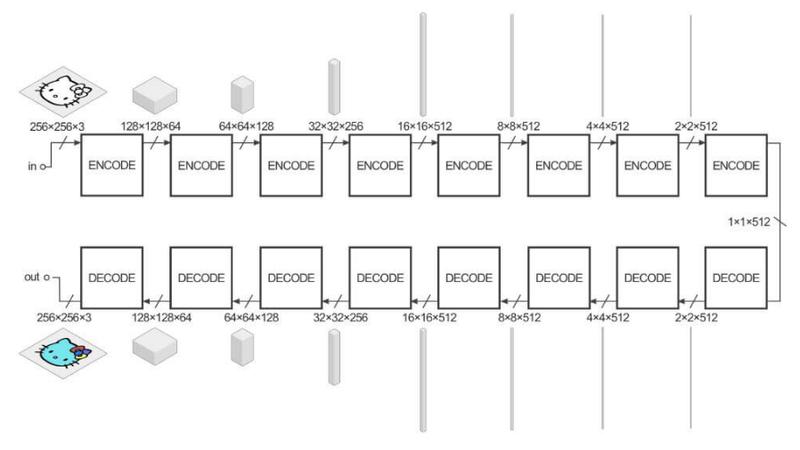  

위 그림에서 `ENCODE` 또는 `DECODE`라고 쓰인 각각의 블록을 기준으로 양쪽에 쓰인 입출력 크기에 집중해주세요.  
"in"이라고 쓰여진 입력 부분부터 윗줄의 화살표를 쭉 따라가면 계산된 결과의 (width, height) 크기가 점점 절반씩 줄어들며 최종적으로 (1,1)이 되고, 채널의 수는 512까지 늘어나는 것을 확인할 수 있습니다.  
처음 입력부터 시작해서 (1,1,512) 크기를 출력하는 곳까지가 Encoder 부분입니다.  

이어서 아랫줄 화살표를 따라가면 (width, height) 크기가 점점 두 배로 늘어나 다시 (256, 256) 크기가 되고, 채널의 수는 점점 줄어들어 처음 입력과 같이 3채널이 됩니다. (1,1,512)를 입력으로 최종 출력까지의 연산들이 Decoder 부분입니다.  



### Generator 구현하기

위 정보들을 토대로 여러분의 머릿속에 희미하게 그려진 Generator의 Encoder 부분을 구현하겠습니다.  
먼저 위 논문에서 "C64", "C128" 등으로 쓰여진 것과 같이 "Convolution → BatchNorm → LeakyReLU"의 3개 레이어로 구성된 기본적인 블록을 아래와 같이 하나의 레이어로 만들었습니다.

In [ ]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

`__init__()` 메서드에서 `n_filters`, `use_bn`를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정 할 수 있습니다.  
이외 Convolution 레이어에서 필터의 크기(=4) 및 stride(=2)와 LeakyReLU 활성화의 slope coefficient(=0.2)는 모든 곳에서 고정되어 사용하므로 각각의 값을 지정했습니다.  
Encoder에 사용할 기본 블록을 구성했으니 이 블록을 여러 번 가져다 사용하면 아래와 같이 쉽게 Encoder를 구성할 수 있습니다.  

In [ ]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

각 블록을 거치면서 사용할 필터의 개수를 `filters`라는 리스트에 지정해 두었으며, `blocks`이라는 리스트에는 사용할 블록들을 정의해 넣어두고, `call()` 메서드에서 차례대로 블록들을 통과합니다. 앞서 퀴즈로 알아본 것처럼 Encoder 첫 번째 블록에서는 BatchNorm을 사용하지 않습니다.  
`get_summary`는 레이어가 제대로 구성되었는지 확인하기 위한 용도로 따로 만들어 놓았습니다. 위에서 구성한 Encoder에 (256,256,3) 크기의 데이터를 입력했을 때, 어떤 크기의 데이터가 출력되는지 살펴봅시다. 만들어 놓은 `get_summary` 메서드를 바로 불러오시면 됩니다.  

In [ ]:
Encoder().get_summary()

블록을 통과할수록 (width, height) 크기는 반씩 줄어들고, 사용된 필터의 수는 최대 512개로 늘어나 최종 (1,1,512)로 알맞은 크기가 출력됨을 확인 할 수 있습니다.  

이번엔 Decoder를 구현합니다. Encoder와 마찬가지로 사용할 기본 블록을 정의하고, 이 블록을 여러 번 반복하여 아래와 같이 Decoder를 만들겠습니다.

In [ ]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,256)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

처음 세 개의 블록에서만 `Dropout`을 사용했으며, 마지막 convolution에는 3개의 필터를 사용해 출력하는 것을 확인할 수 있습니다.  
마찬가지로 (1,1,512) 크기의 데이터가 입력되었을 때, 어떤 크기가 출력되는지 확인해봅시다.

In [ ]:
Decoder().get_summary()

(width, height) 크기가 점점 늘어나고 사용 필터의 수는 점점 줄어들어 최종 (256,256,3) 크기로 알맞게 출력되었습니다.  

위에서 구성한 Encoder와 Decoder를 연결시키면 Encoder에서 (256,256,3) 입력이 (1,1,512)로 변환되고, Decoder를 통과해 다시 원래 입력 크기와 같은 (256,256,3)의 결과를 얻을 수 있겠군요. 스케치를 입력으로 이런 연산 과정을 통해 채색된 이미지 출력을 얻을 수 있습니다.
아래 코드와 같이 `tf.keras.Model`을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성해봅시다.  

In [ ]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary()

Generator를 잘 작동시키기 위해서는 약 4000만 개의 파라미터를 잘 학습시켜야 하네요😅

## 20-10. 난 스케치를 할 테니 너는 채색을 하거라 (3) Generator 재구성하기
지금까지 Encoder와 Decoder를 연결시켜 Generator를 만들어 봤습니다.  
하지만 앞서 설명드린 것처럼 Pix2Pix의 Generator 구조는 아래 그림처럼 두 가지를 제안했습니다.  
아래 그림으로 다시 한번 봅시다.  

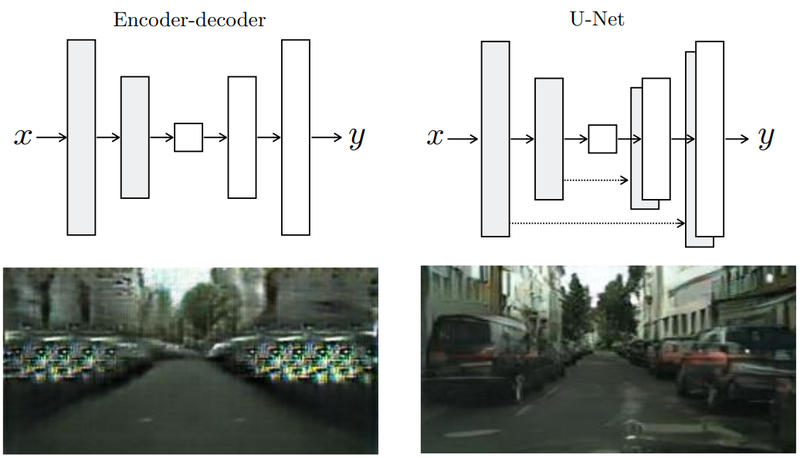  

위 그림에서 각 구조 아래에 표시된 이미지는 해당 구조를 Generator로 사용했을 때의 결과입니다.  

단순한 Encoder-Decoder 구조에 비해 Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가 훨씬 더 실제 이미지에 가까운 품질을 보입니다.  

이전 단계에서 구현했던 Generator는 위 그림의 Encoder-decoder 구조입니다.  
Encoder에서 출력된 결과를 Decoder의 입력으로 연결했고, 이 외에 추가적으로 Encoder와 Decoder를 연결시키는 부분은 없었습니다. 더 좋은 결과를 기대하기 위해 이전에 구현했던 것들을 조금 수정하여 위 그림의 U-Net 구조를 만들고 실험해봅시다.  
(아래 단락부터는 두 가지 구조를 각각 "Encoder-Decoder Generator" 및 "U-Net Generator"라는 용어로 구분하여 사용하겠습니다)  

먼저 Encoder 및 Decoder에 사용되는 기본적인 블록은 이전에 아래 코드와 같이 구현했었습니다.  

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

여기서 특별히 수정해야 할 부분은 없습니다. 그대로 가져다가 사용하겠습니다.  

정의된 블록들을 이용해 한 번에 **U-Net Generator**를 정의해 보겠습니다. 아래 모델의 `__init__()` 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록들을 정의해 놓고, `call()`에서 forward propagation 하도록 합니다. 이전 구현에는 없었던 skip connection이 `call()` 내부에서 어떻게 구현되었는지 잘 확인해봅시다.

In [ ]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

먼저, `__init__()` 에서 정의된 `encode_blocks` 및 `decode_blocks`가 `call()` 내부에서 차례대로 사용되어 Encoder 및 Decoder 내부 연산을 수행합니다.  
이때, Encoder와 Decoder 사이의 skip connection을 위해 `features` 라는 리스트를 만들고 Encoder 내에서 사용된 각 블록들의 출력을 차례대로 담았습니다.  
이후 Encoder의 최종 출력이 Decoder의 입력으로 들어가면서 다시 한번 각각의 Decoder 블록들을 통과하는데, `features` 리스트에 있는 각각의 출력들이 Decoder 블록 연산 후 함께 연결되어 다음 블록의 입력으로 사용됩니다.  

아래 질문에 답하면서 조금 더 자세히 이해해봅시다.  

Q8. 위 코드의 call() 내에서 ' features = features[:-1]' 는 왜 필요할까요?  
- Skip connection을 위해 만들어진 features 리스트에는 Encoder 내 각 블록의 출력이 들어있는데, Encoder의 마지막 출력(feature리스트 의 마지막 항목)은 Decoder로 직접 입력되므로 skip connection의 대상이 아닙니다.  

Q9. 위 코드의 call() 내의 Decoder 연산 부분에서 features[::-1] 는 왜 필요할까요?  
- Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고, Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등 대칭을 이룹니다(맨 위 U-Net 구조 사진 참고). features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결합니다.  

Q10. 아래와 같은 데이터 A, B가 있을 때,  
데이터 A 크기 : (32,128,128,200) #(batch, width, height, channel)  
데이터 B 크기 : (32,128,128,400) #(batch, width, height, channel)  
여기서 사용되는 skip connection은 layers.Concatenate() 결과의 크기는 무엇일까요?  

- (128,128,600)  
layers.Concatenate() 내에 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결됩니다.  

이제야 Generator 구현이 끝났습니다.  

마지막으로 완성된 U-Net 구조 Generator 내부의 각 출력이 적절한지 아래 코드로 확인해봅시다.

In [ ]:
UNetGenerator().get_summary()

이전 Encoder-Decoder Generator 구조에서 학습해야 할 파라미터는 약 4000만 개 였는데, Skip connection을 추가한 U-Net Generator의 파라미터는 약 5500만 개로 꽤나 많이 늘어났습니다.

Q11. U-Net Generator의 파라미터가 늘어난 곳은 Encoder와 Decoder 중 어디일까요?  
또한, 두 종류의 Generator 구조에서 동일한 수의 convolution 레이어를 사용했는데, 구체적으로 어느 부분에서 파라미터가 늘어났을까요?  
- 정리하면, U-Net Generator에서 사용한 skip-connection으로 인해 Decoder의 각 블록에서 입력받는 채널 수가 늘어났고, 이에 따라 블록 내 convolution 레이어에서 사용하는 필터 크기가 커지면서 학습해야 할 파라미터가 늘어났습니다.

## 20-11. 난 스케치를 할 테니 너는 채색을 하거라 (4) Discriminator 구성하기
Generator만으로 좋은 결과를 도출하기에는 부족합니다. 조금 더 사실적인 이미지를 생성하기 위한 Pix2Pix를 완성시키기 위해서는 Discriminator가 필요합니다.  
이번 단계에서 Discriminator를 만들어 Pix2Pix 구조를 완성시켜 봅시다. 

### Discriminator의 구성요소 알아보기  

Generator를 만들기 전에 봤듯이 먼저 Pix2Pix 논문에서 Discriminator를 구성하는데 필요한 정보를 아래에 가져왔습니다.

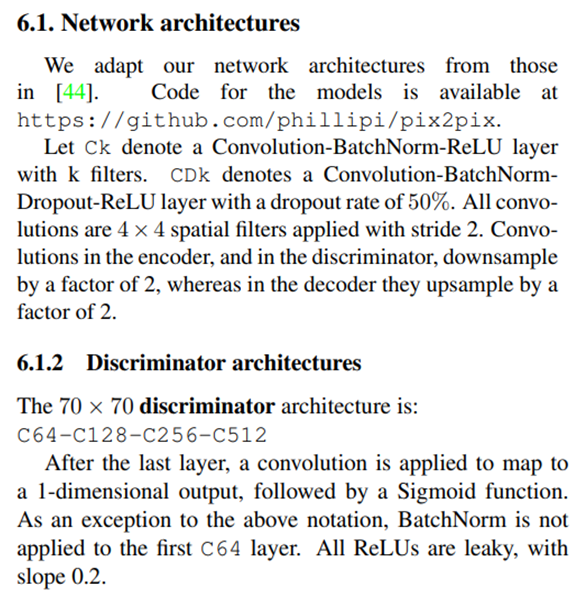

Generator의 구성 요소와 똑같이 "C64" 등으로 표기되어있습니다. 진짜 및 가짜 이미지를 판별하기 위해 최종 출력에 sigmoid를 사용하는 것을 제외하면 특별한 변경 사항은 없는 것 같습니다.  

이어서 아래의 보기 쉽게 표현한 그림을 통해 Discriminator의 구조를 머리속에 조금 더 자세히 그려봅시다.  

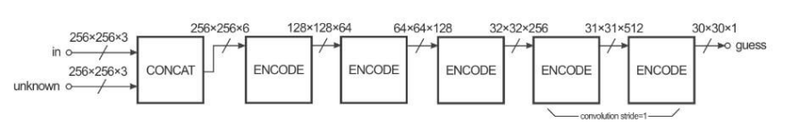  

Discriminator는 2개 입력(위 그림의 "in", "unknown")을 받아 연결(CONCAT)한 후, `ENCODE` 라고 쓰인 5개의 블록을 통과합니다. 이 중 마지막 블록을 제외한 4개 블록은 위 논문에서 표기된 "C64-C128-C256-C512"에 해당하며, 마지막은 1(채널)차원 출력을 위한 블록이 추가되었습니다.  

최종적으로 출력되는 크기는 (30,30,1) 이며, 위 그림의 출력 이전의 2개의 `ENCODE` 블록을 보면 각각의 출력 크기가 32, 31, 30으로 1씩 감소하는 것을 알 수 있습니다. Generator에서도 사용했던 2 stride convolution에 패딩을 이용하면 (width, height) 크기가 절반씩 감소할 것입니다. 1 stride convolution에 패딩을 하지 않는다면 (width, height) 크기는 (필터 크기가 4이므로) 3씩 감소할 텐데, 그림과 같이 1씩 감소하도록 하려면 무언가 다른 방법을 써야 할 것 같네요.🤔 이 부분이 지금 이해되지 않는다면 아래 코드에서 다시 다룰 테니 우선 넘어갑시다.  

추가적으로 위 그림에서 최종 출력 크기가 (30,30)이 되어야 하는 이유는 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용했기 때문입니다. 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정입니다. 이 부분에 대한 설명은 아래 참고 자료로 대신하겠습니다. (아랫글 마지막 부분에 언급합니다)  
- [Understanding PatchGAN](https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207)  

이 부분만 제외하면 전반적으로는 Generator보다 간단한 것 같습니다. 구현해봅시다.  

### Discriminator 구현하기


마찬가지로 Discriminator에 사용할 기본적인 블록부터 만들겠습니다.

In [ ]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

`__init__()` 에서 필요한 만큼 많은 설정을 가능하게끔 했습니다. 필터의 수(`n_filters`), 필터가 순회하는 간격(`stride`), 출력 feature map의 크기를 조절할 수 있도록 하는 패딩 설정(`custom_pad`), BatchNorm의 사용 여부(`use_bn`), 활성화 함수 사용 여부(`act`)가 설정 가능합니다.  

아래 질문에 답하면서 위 코드가 어떻게 동작하는지 생각해봅시다.  

Q12. 위에서 만든 DiscBlock의 설정을 다음과 같이 하여 DiscBlock(n_filters=64, stride=1, custom_pad=True, use_bn=True, act=True) 으로 생성된 블록에 (width, height, channel) = (128, 128, 32) 크기가 입력된다면, 블록 내부에서 순서대로 어떠한 레이어를 통과하는지, 그리고 각 레이어를 통과했을 때 출력 크기는 어떻게 되는지 적어주세요.  

1. (128,128,32) 크기의 입력이 layers.ZeroPadding2D()를 통과하면, width 및 height의 양쪽 면에 각각 1씩 패딩되어 총 2만큼 크기가 늘어납니다. 출력 : (130,130,32)  
2. 패딩하지 않고 필터 크기 4 및 간격(stride) 1의 convolution 레이어를 통과하면 width 및 height 가 3씩 줄어듭니다. 이는 OutSize=(InSize+2∗PadSize−FilterSize)/Stride+1 의 식으로 계산할 수 있습니다. 채널 수는 사용한 필터 개수와 같습니다. 출력 : (127,127,64)  
3. 이 외 다른 레이어(BatchNorm, LeakyReLU)는 출력의 크기에 영향을 주지 않습니다.  

간단하게 코드를 작성하여 각 출력의 크기가 맞는지 확인해 봅시다.

In [ ]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

이러한 코드와 비슷한 설정으로 (width, height) 크기를 1씩 감소시킬 수 있습니다. 마지막 2개 블록은 출력의 크기가 1씩 감소하므로 이런 방식을 적용하면 되겠습니다.  

Pix2Pix의 Discriminator가 70x70 PatchGAN을 사용하기 때문에 최종 출력을 (30,30) 크기로 맞추느라 위와 같이 조금 복잡한 과정을 설명했습니다.  
사용할 기본적인 블록을 만들었으니 이를 이용해 바로 Discriminator를 만들어봅시다. 

In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

`__init__()` 내부에서 사용할 블록들을 정의했는데, 이전의 구현들처럼 (위 코드의 주석 처리된 부분과 같이) for loop로 간편하게 블록을 만들 수도 있지만, 쉽게 코드를 읽게끔 총 6개 블록을 각각 따로 만들었습니다.  
첫 번째 블록은 단순한 연결(`concat`)을 수행하며, Discriminator의 최종 출력은 `sigmoid` 활성화를 사용했습니다.  

각 블록의 출력 크기가 알맞게 되었는지 아래 코드로 확인해봅시다.  

In [ ]:
Discriminator().get_summary()

두 개의 (256,256,3) 크기 입력으로 최종 (30,30,1) 출력을 만들었고, 아래의 Discriminator를 나타낸 그림과 각 출력 크기가 일치합니다.  
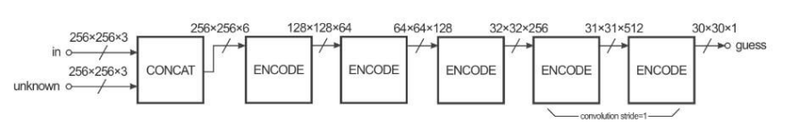  
시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화해보겠습니다.

In [ ]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

이전 PatchGAN에 대해 설명했던 것처럼, 위 (30,30) 크기를 갖는 결과 이미지의 각 픽셀값은 원래 입력의 (70,70) 패치에 대한 분류 결과입니다. 전체 입력의 크기가 (256,256) 이므로, 각각의 (70,70) 패치는 원래 입력상에서 많이 겹쳐있겠죠. 각각의 픽셀값은 `sigmoid` 함수의 결괏값이므로 0~1 사이의 값을 가지며, 진짜 및 가짜 데이터를 판별해내는 데 사용합니다.  

드디어 Pix2Pix를 구성하는 Generator와 Discriminator의 구현이 끝났습니다.  
다음 단계에서 본격적인 모델 학습을 진행해 봅시다!  

## 20-12. 난 스케치를 할 테니 너는 채색을 하거라 (5) 학습 및 테스트하기
이번 단계에서는 구현된 Generator와 Discriminator를 학습시켜보고, 스케치를 입력으로 채색된 이미지를 생성해 봅시다. 먼저 학습에 필요한 손실함수부터 정의하겠습니다.  
논문의 여러 실험 결과 중 손실함수 선택에 따른 결과의 차이는 아래와 같습니다.  

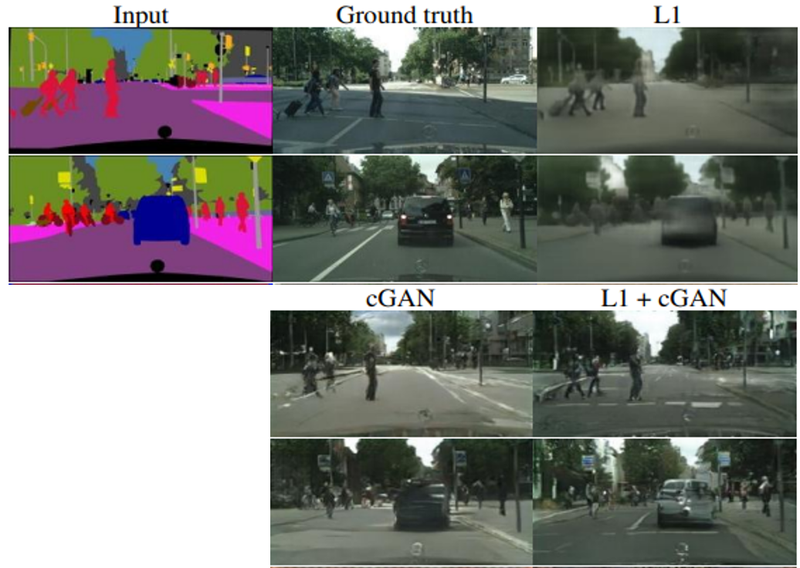  

레이블 정보만 있는 입력에 대해 여러 손실함수를 사용해 실제 이미지를 만들어 낸 결과는, 일반적인 GAN의 손실함수에 L1을 추가로 이용했을 때 가장 실제에 가까운 이미지를 생성해 냈습니다. 이번 실험에서도 두 가지 손실 함수를 모두 사용해 봅시다.  

In [ ]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

Generator 및 Discriminator의 손실 계산을 각각 정의했습니다.  

- Generator의 손실함수 (위 코드의 `get_gene_loss`)는 총 3개의 입력이 있습니다. 이 중 `fake_disc`는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값이며, 실제 이미지를 뜻하는 "1"과 비교하기 위해 `tf.ones_like()`를 사용합니다. 또한 L1 손실을 계산하기 위해 생성한 가짜 이미지(`fake_output`)와 실제 이미지(`real_output`) 사이의 MAE(Mean Absolute Error)를 계산합니다.  

- Discriminator의 손실함수 (위 코드의 `get_disc_loss`)는 2개의 입력이 있으며, 이들은 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값입니다. Discriminator는 실제 이미지를 잘 구분해 내야 하므로 `real_disc`는 "1"로 채워진 벡터와 비교하고, `fake_disc`는 "0"으로 채워진 벡터와 비교합니다.  

사용할 optimizer는 논문과 동일하게 아래와 같이 설정합니다.  

In [ ]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현했습니다.

In [ ]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

전반적인 학습 과정은 앞서 진행했었던 cGAN 학습과 크게 다르지 않습니다.  
다만 위 코드의 `gene_total_loss` 계산 라인에서 최종 Generator 손실을 계산할 때, L1 손실에 100을 곱한 부분을 확인하셨나요? (## 이 표시가 있는 부분을 확인해 주세요.) 논문에서는 Generator의 손실을 아래와 같이 정의했습니다.  
$$G^* = \arg \min_G \max_D \mathcal{L}{cGAN}(G,D) + \lambda \mathcal{L}{L1}(G)$$  


위 식에서 λ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100을 사용했습니다.  
앞서 정의한 함수를 이용해서 학습을 진행합니다. 우선 10 epoch 학습해 봅시다.  

In [ ]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

아래 코드로 짧게나마 학습해 본 모델에 채색을 시켜봅시다. 아마 마음에 안 들 겁니다.. 😥

In [ ]:
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

데이터셋을 제공한 출처를 보면, Pix2Pix로 128 epoch 학습 후 테스트 결과가 아래와 같다고 합니다.  
이전 10 epoch 학습의 결과보다는 훨씬 낫지만, 조금 오래 학습했어도 채색해야 할 전체적인 색감 정도만 학습되며 아직까지 세부적으로는 제대로 채색되지 않다는 것을 확인할 수 있습니다.  

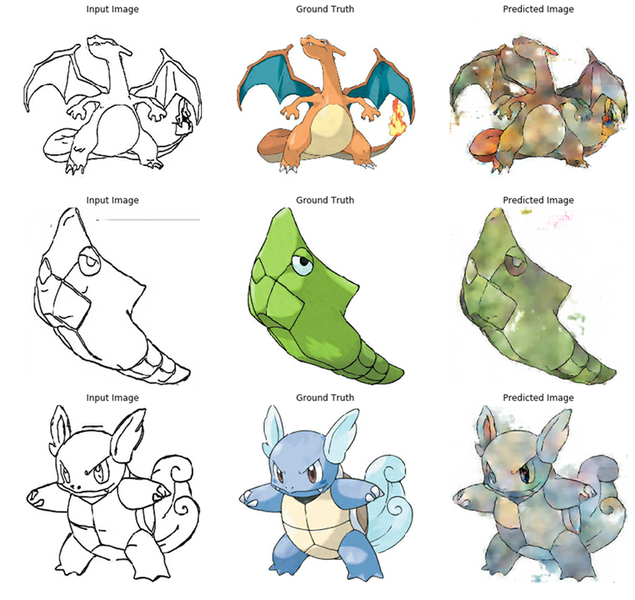

지금까지 꽤 많은 시간을 투자해서 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현까지 이해하느라 고생하셨습니다. 앞서 다뤘던 코드의 이해에 큰 어려움이 없었다면, 연습을 통해 이와 비슷한 구조의 모델들 또한 쉽게 구현할 수 있을 것입니다. (U-Net Generator를 구현했으니 원래 segmentation에 사용되었던 U-Net도 쉽게 구현할 수 있습니다!).  

이번 학습을 통해서 여러분이 Pix2Pix 구조뿐만 아니라 CNN 기반의 어떠한 구조라도 자신을 갖고 구현을 시작할 수 있길 바랍니다.  
마지막으로 다음 단계로 넘어가서 Pix2Pix를 이용한 프로젝트를 수행해봅시다.  

***

# 1. 프로젝트: Segmentation map으로 도로 이미지 만들기
이전 Pix2Pix 논문에서 제시한 결과 중에 아래와 같은 실험 결과가 있었습니다. 도로의 레이블 정보를 활용해 이미지를 생성해낸 결과입니다.  

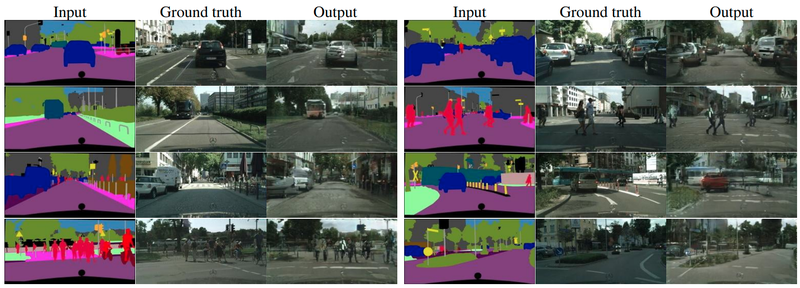  

이번 프로젝트는 위와 같은 데이터셋을 이용해 Pix2Pix를 학습시켜보는 것입니다. 데이터셋은 아래에서 다운로드할 수 있습니다.  
1000개의 학습용 이미지 및 5개의 평가 이미지를 포함합니다.  

[cityscapes.zip ](https://aiffelstaticprd.blob.core.windows.net/media/documents/cityscapes.zip)  

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.  
아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.  

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해봅시다.  
(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)  

- [Tensorflow Pix2Pix Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

### 프로젝트 수행

프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.  
***
1. 데이터에 한 가지 이상의 **augmentation 방법**을 적용하여 학습해주세요.  
    (어떠한 방법을 사용했는지 적어주세요.)
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 **U-Net Generator**를 사용해주세요.  
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운받았던 "val" 폴더 내 이미지를 사용해주세요.  
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 **스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화**해 주세요.  
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 **중간 손실 값에 대한 로그**를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

In [1]:
import tensorflow as tf

import os
import time

from matplotlib import pyplot as plt
from IPython import display

In [2]:
# 데이터 불러오기

data_path = os.getcwd() + '/cityscapes'
train_path = data_path + '/train/'
val_path = data_path + '/val/'

print(train_path)
print(val_path)

/home/aiffel-dj40/1.AIFFEL_Study/Exploration/E20_cGAN/cityscapes/train/
/home/aiffel-dj40/1.AIFFEL_Study/Exploration/E20_cGAN/cityscapes/val/


In [3]:
# 데이터 개수 확인

print('train 이미지 개수: ', len(os.listdir(train_path)))
print('val 이미지 개수: ', len(os.listdir(val_path)))

train 이미지 개수:  1000
val 이미지 개수:  5


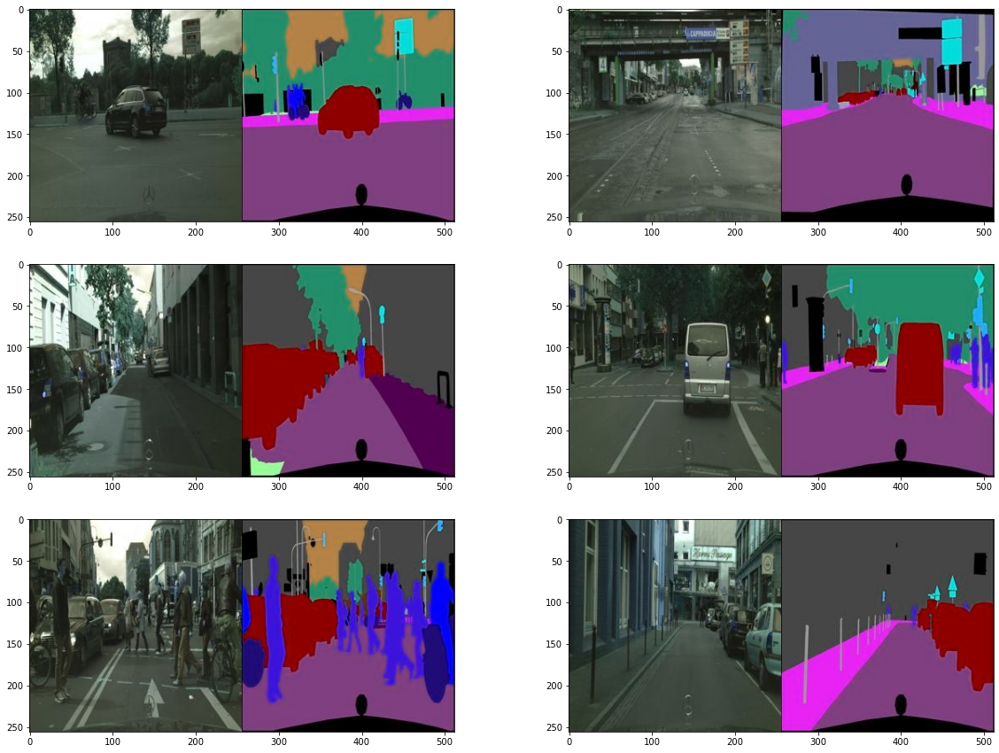

In [4]:
# 데이터 시각화

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [5]:
# 데이터 shape 확인

f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print('이미지 shape는: ', img.shape)

이미지 shape는:  (256, 512, 3)


### 모델에 사용할 데이터를 (256,256,3) 크기로 2개 분리

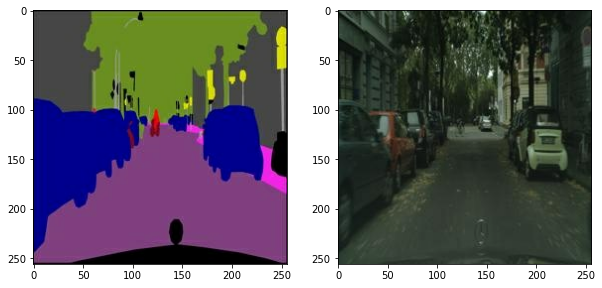

In [6]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = train_path + os.listdir(train_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

### augmentation 적용 (random rotation)

In [7]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


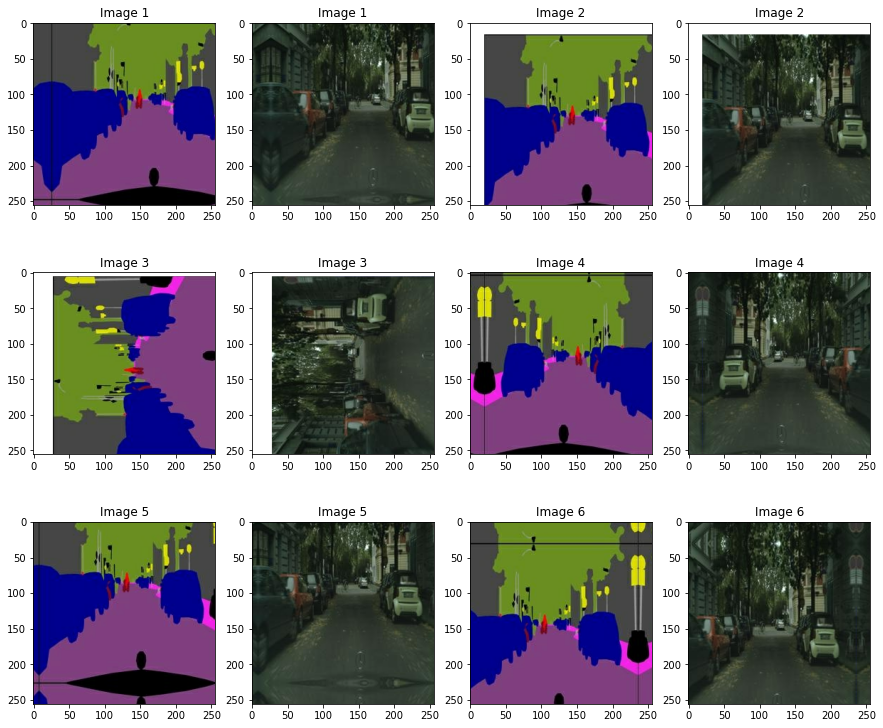

In [8]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

### 전처리 함수

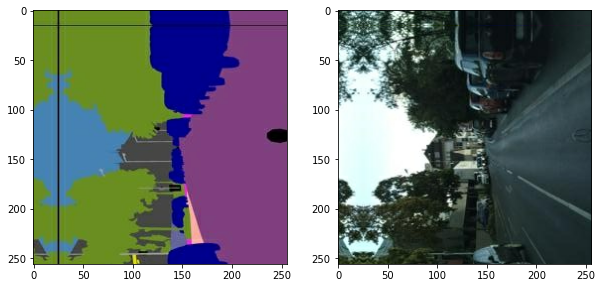

In [9]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

### U-Net Generator

In [10]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


In [11]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [12]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

### Discriminator 구현하기

In [13]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [14]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_15 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


In [15]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [16]:
Discriminator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_3[0][0]                    
                                                                 input_4[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

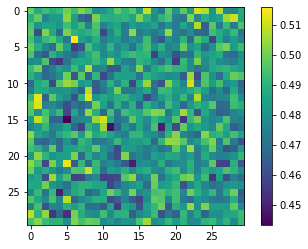

In [17]:
# 시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화

x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

### 학습 및 테스트

In [18]:
# 손실함수

from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [19]:
# Optimizer 정의

from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [20]:
# 하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현

@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


In [21]:
# 학습

EPOCHS = 500

generator = UNetGenerator()
discriminator = Discriminator()

g_loss_list = []
l1_loss_list = []
d_loss_list = []

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            g_loss_list.append(g_loss.numpy())
            l1_loss_list.append(l1_loss.numpy())
            d_loss_list.append(d_loss.numpy())
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.8744                     
L1_loss:0.3150                     
Discriminator_loss:1.3503

EPOCH[1] - STEP[20]                     
Generator_loss:0.8601                     
L1_loss:0.2239                     
Discriminator_loss:1.5621

EPOCH[1] - STEP[30]                     
Generator_loss:0.8513                     
L1_loss:0.1869                     
Discriminator_loss:1.3413

EPOCH[1] - STEP[40]                     
Generator_loss:0.7643                     
L1_loss:0.1863                     
Discriminator_loss:1.3031

EPOCH[1] - STEP[50]                     
Generator_loss:1.1520                     
L1_loss:0.1550                     
Discriminator_loss:1.3309

EPOCH[1] - STEP[60]                     
Generator_loss:0.7451                     
L1_loss:0.2156                     
Discriminator_loss:1.2316

EPOCH[1] - STEP[70]                     
Generator_loss:1.1795                     
L1_loss:0.1639                    

EPOCH[3] - STEP[70]                     
Generator_loss:0.7770                     
L1_loss:0.1954                     
Discriminator_loss:0.9720

EPOCH[3] - STEP[80]                     
Generator_loss:1.2284                     
L1_loss:0.1942                     
Discriminator_loss:0.6924

EPOCH[3] - STEP[90]                     
Generator_loss:1.8298                     
L1_loss:0.1614                     
Discriminator_loss:0.9418

EPOCH[3] - STEP[100]                     
Generator_loss:1.1804                     
L1_loss:0.1814                     
Discriminator_loss:0.6049

EPOCH[3] - STEP[110]                     
Generator_loss:2.2694                     
L1_loss:0.1998                     
Discriminator_loss:0.3537

EPOCH[3] - STEP[120]                     
Generator_loss:1.8634                     
L1_loss:0.1962                     
Discriminator_loss:0.4056

EPOCH[3] - STEP[130]                     
Generator_loss:2.0999                     
L1_loss:0.1899                

EPOCH[5] - STEP[130]                     
Generator_loss:1.3935                     
L1_loss:0.2209                     
Discriminator_loss:0.4722

EPOCH[5] - STEP[140]                     
Generator_loss:0.8761                     
L1_loss:0.2028                     
Discriminator_loss:0.8899

EPOCH[5] - STEP[150]                     
Generator_loss:3.2213                     
L1_loss:0.2280                     
Discriminator_loss:0.3450

EPOCH[5] - STEP[160]                     
Generator_loss:1.6028                     
L1_loss:0.2001                     
Discriminator_loss:0.3586

EPOCH[5] - STEP[170]                     
Generator_loss:0.5562                     
L1_loss:0.1790                     
Discriminator_loss:1.4282

EPOCH[5] - STEP[180]                     
Generator_loss:1.8426                     
L1_loss:0.1942                     
Discriminator_loss:0.4897

EPOCH[5] - STEP[190]                     
Generator_loss:2.5325                     
L1_loss:0.1607             

EPOCH[7] - STEP[190]                     
Generator_loss:1.4791                     
L1_loss:0.1711                     
Discriminator_loss:1.3603

EPOCH[7] - STEP[200]                     
Generator_loss:1.6701                     
L1_loss:0.1774                     
Discriminator_loss:1.6724

EPOCH[7] - STEP[210]                     
Generator_loss:0.7082                     
L1_loss:0.1803                     
Discriminator_loss:1.8023

EPOCH[7] - STEP[220]                     
Generator_loss:1.3596                     
L1_loss:0.1777                     
Discriminator_loss:0.8432

EPOCH[7] - STEP[230]                     
Generator_loss:1.5503                     
L1_loss:0.1624                     
Discriminator_loss:0.6642

EPOCH[7] - STEP[240]                     
Generator_loss:0.7007                     
L1_loss:0.1749                     
Discriminator_loss:1.5896

EPOCH[7] - STEP[250]                     
Generator_loss:1.3162                     
L1_loss:0.1755             

EPOCH[9] - STEP[250]                     
Generator_loss:0.8252                     
L1_loss:0.1683                     
Discriminator_loss:0.7113

EPOCH[10] - STEP[10]                     
Generator_loss:0.8128                     
L1_loss:0.2196                     
Discriminator_loss:0.6932

EPOCH[10] - STEP[20]                     
Generator_loss:1.0469                     
L1_loss:0.1892                     
Discriminator_loss:1.4258

EPOCH[10] - STEP[30]                     
Generator_loss:1.6259                     
L1_loss:0.1591                     
Discriminator_loss:0.7567

EPOCH[10] - STEP[40]                     
Generator_loss:1.7448                     
L1_loss:0.1576                     
Discriminator_loss:0.5792

EPOCH[10] - STEP[50]                     
Generator_loss:2.7167                     
L1_loss:0.1896                     
Discriminator_loss:0.4229

EPOCH[10] - STEP[60]                     
Generator_loss:2.9385                     
L1_loss:0.2035             

EPOCH[12] - STEP[60]                     
Generator_loss:2.2604                     
L1_loss:0.1694                     
Discriminator_loss:0.3763

EPOCH[12] - STEP[70]                     
Generator_loss:0.9346                     
L1_loss:0.1770                     
Discriminator_loss:0.6497

EPOCH[12] - STEP[80]                     
Generator_loss:1.1970                     
L1_loss:0.1742                     
Discriminator_loss:0.6161

EPOCH[12] - STEP[90]                     
Generator_loss:2.2216                     
L1_loss:0.1772                     
Discriminator_loss:0.4866

EPOCH[12] - STEP[100]                     
Generator_loss:2.1071                     
L1_loss:0.1728                     
Discriminator_loss:1.2006

EPOCH[12] - STEP[110]                     
Generator_loss:1.9841                     
L1_loss:0.2104                     
Discriminator_loss:0.6497

EPOCH[12] - STEP[120]                     
Generator_loss:0.3933                     
L1_loss:0.1981          

EPOCH[14] - STEP[120]                     
Generator_loss:1.1543                     
L1_loss:0.1784                     
Discriminator_loss:1.3579

EPOCH[14] - STEP[130]                     
Generator_loss:1.3216                     
L1_loss:0.1701                     
Discriminator_loss:0.9653

EPOCH[14] - STEP[140]                     
Generator_loss:0.4677                     
L1_loss:0.1772                     
Discriminator_loss:1.2104

EPOCH[14] - STEP[150]                     
Generator_loss:2.5839                     
L1_loss:0.1800                     
Discriminator_loss:0.9366

EPOCH[14] - STEP[160]                     
Generator_loss:0.5586                     
L1_loss:0.1698                     
Discriminator_loss:1.2644

EPOCH[14] - STEP[170]                     
Generator_loss:2.4712                     
L1_loss:0.2122                     
Discriminator_loss:0.1198

EPOCH[14] - STEP[180]                     
Generator_loss:1.0489                     
L1_loss:0.1696      

EPOCH[16] - STEP[180]                     
Generator_loss:1.5785                     
L1_loss:0.1810                     
Discriminator_loss:0.7662

EPOCH[16] - STEP[190]                     
Generator_loss:0.9638                     
L1_loss:0.1820                     
Discriminator_loss:0.5644

EPOCH[16] - STEP[200]                     
Generator_loss:1.2763                     
L1_loss:0.1535                     
Discriminator_loss:0.9097

EPOCH[16] - STEP[210]                     
Generator_loss:2.4632                     
L1_loss:0.1704                     
Discriminator_loss:1.7515

EPOCH[16] - STEP[220]                     
Generator_loss:0.8547                     
L1_loss:0.2082                     
Discriminator_loss:0.6498

EPOCH[16] - STEP[230]                     
Generator_loss:1.7573                     
L1_loss:0.1785                     
Discriminator_loss:0.7812

EPOCH[16] - STEP[240]                     
Generator_loss:2.1305                     
L1_loss:0.1798      

EPOCH[18] - STEP[240]                     
Generator_loss:1.4503                     
L1_loss:0.1808                     
Discriminator_loss:1.4347

EPOCH[18] - STEP[250]                     
Generator_loss:0.7879                     
L1_loss:0.1776                     
Discriminator_loss:1.0392

EPOCH[19] - STEP[10]                     
Generator_loss:0.1756                     
L1_loss:0.1594                     
Discriminator_loss:2.4244

EPOCH[19] - STEP[20]                     
Generator_loss:1.6997                     
L1_loss:0.1622                     
Discriminator_loss:1.3194

EPOCH[19] - STEP[30]                     
Generator_loss:1.3090                     
L1_loss:0.1951                     
Discriminator_loss:0.5129

EPOCH[19] - STEP[40]                     
Generator_loss:1.8741                     
L1_loss:0.1593                     
Discriminator_loss:1.1127

EPOCH[19] - STEP[50]                     
Generator_loss:1.7697                     
L1_loss:0.1782           

EPOCH[21] - STEP[50]                     
Generator_loss:1.5099                     
L1_loss:0.1990                     
Discriminator_loss:0.3136

EPOCH[21] - STEP[60]                     
Generator_loss:1.0580                     
L1_loss:0.1834                     
Discriminator_loss:0.9819

EPOCH[21] - STEP[70]                     
Generator_loss:1.5226                     
L1_loss:0.1811                     
Discriminator_loss:0.3276

EPOCH[21] - STEP[80]                     
Generator_loss:2.2101                     
L1_loss:0.1768                     
Discriminator_loss:1.6853

EPOCH[21] - STEP[90]                     
Generator_loss:2.0423                     
L1_loss:0.1996                     
Discriminator_loss:0.6067

EPOCH[21] - STEP[100]                     
Generator_loss:1.5633                     
L1_loss:0.2252                     
Discriminator_loss:0.2855

EPOCH[21] - STEP[110]                     
Generator_loss:1.6281                     
L1_loss:0.1691           

EPOCH[23] - STEP[110]                     
Generator_loss:0.5530                     
L1_loss:0.1981                     
Discriminator_loss:1.1444

EPOCH[23] - STEP[120]                     
Generator_loss:1.8282                     
L1_loss:0.1887                     
Discriminator_loss:0.8727

EPOCH[23] - STEP[130]                     
Generator_loss:2.5226                     
L1_loss:0.2051                     
Discriminator_loss:0.1404

EPOCH[23] - STEP[140]                     
Generator_loss:1.2689                     
L1_loss:0.1583                     
Discriminator_loss:0.5331

EPOCH[23] - STEP[150]                     
Generator_loss:0.2322                     
L1_loss:0.1787                     
Discriminator_loss:1.7855

EPOCH[23] - STEP[160]                     
Generator_loss:1.4967                     
L1_loss:0.1721                     
Discriminator_loss:0.5417

EPOCH[23] - STEP[170]                     
Generator_loss:0.8268                     
L1_loss:0.1866      

EPOCH[25] - STEP[170]                     
Generator_loss:1.3139                     
L1_loss:0.1581                     
Discriminator_loss:1.3146

EPOCH[25] - STEP[180]                     
Generator_loss:2.1349                     
L1_loss:0.1832                     
Discriminator_loss:0.4612

EPOCH[25] - STEP[190]                     
Generator_loss:1.3562                     
L1_loss:0.2006                     
Discriminator_loss:0.4513

EPOCH[25] - STEP[200]                     
Generator_loss:0.6240                     
L1_loss:0.1892                     
Discriminator_loss:0.9506

EPOCH[25] - STEP[210]                     
Generator_loss:1.1780                     
L1_loss:0.1809                     
Discriminator_loss:0.9990

EPOCH[25] - STEP[220]                     
Generator_loss:1.3048                     
L1_loss:0.1577                     
Discriminator_loss:0.7472

EPOCH[25] - STEP[230]                     
Generator_loss:2.8547                     
L1_loss:0.1937      

EPOCH[27] - STEP[230]                     
Generator_loss:2.0481                     
L1_loss:0.1847                     
Discriminator_loss:0.5406

EPOCH[27] - STEP[240]                     
Generator_loss:0.8369                     
L1_loss:0.1524                     
Discriminator_loss:1.2337

EPOCH[27] - STEP[250]                     
Generator_loss:1.3426                     
L1_loss:0.1713                     
Discriminator_loss:0.7424

EPOCH[28] - STEP[10]                     
Generator_loss:1.0001                     
L1_loss:0.1912                     
Discriminator_loss:1.0369

EPOCH[28] - STEP[20]                     
Generator_loss:0.8662                     
L1_loss:0.1794                     
Discriminator_loss:1.2697

EPOCH[28] - STEP[30]                     
Generator_loss:1.4281                     
L1_loss:0.1782                     
Discriminator_loss:0.9256

EPOCH[28] - STEP[40]                     
Generator_loss:1.5042                     
L1_loss:0.1812          

EPOCH[30] - STEP[40]                     
Generator_loss:1.1119                     
L1_loss:0.1634                     
Discriminator_loss:1.4406

EPOCH[30] - STEP[50]                     
Generator_loss:1.5630                     
L1_loss:0.1849                     
Discriminator_loss:0.6540

EPOCH[30] - STEP[60]                     
Generator_loss:2.7868                     
L1_loss:0.1854                     
Discriminator_loss:0.7229

EPOCH[30] - STEP[70]                     
Generator_loss:1.0125                     
L1_loss:0.1415                     
Discriminator_loss:1.4005

EPOCH[30] - STEP[80]                     
Generator_loss:0.7364                     
L1_loss:0.2039                     
Discriminator_loss:0.7572

EPOCH[30] - STEP[90]                     
Generator_loss:2.5678                     
L1_loss:0.1655                     
Discriminator_loss:1.1595

EPOCH[30] - STEP[100]                     
Generator_loss:1.3638                     
L1_loss:0.1956            

EPOCH[32] - STEP[100]                     
Generator_loss:1.2224                     
L1_loss:0.2175                     
Discriminator_loss:0.4332

EPOCH[32] - STEP[110]                     
Generator_loss:1.4737                     
L1_loss:0.1894                     
Discriminator_loss:0.7549

EPOCH[32] - STEP[120]                     
Generator_loss:0.6311                     
L1_loss:0.1692                     
Discriminator_loss:1.0210

EPOCH[32] - STEP[130]                     
Generator_loss:1.6910                     
L1_loss:0.2133                     
Discriminator_loss:0.2844

EPOCH[32] - STEP[140]                     
Generator_loss:0.9669                     
L1_loss:0.1710                     
Discriminator_loss:1.3030

EPOCH[32] - STEP[150]                     
Generator_loss:1.5835                     
L1_loss:0.2345                     
Discriminator_loss:0.3133

EPOCH[32] - STEP[160]                     
Generator_loss:1.1738                     
L1_loss:0.2011      

EPOCH[34] - STEP[160]                     
Generator_loss:1.5813                     
L1_loss:0.1675                     
Discriminator_loss:0.9813

EPOCH[34] - STEP[170]                     
Generator_loss:1.2729                     
L1_loss:0.2185                     
Discriminator_loss:0.5385

EPOCH[34] - STEP[180]                     
Generator_loss:2.0968                     
L1_loss:0.2157                     
Discriminator_loss:0.3091

EPOCH[34] - STEP[190]                     
Generator_loss:1.3208                     
L1_loss:0.1616                     
Discriminator_loss:0.6628

EPOCH[34] - STEP[200]                     
Generator_loss:0.8945                     
L1_loss:0.1568                     
Discriminator_loss:1.2624

EPOCH[34] - STEP[210]                     
Generator_loss:0.5323                     
L1_loss:0.1861                     
Discriminator_loss:1.4680

EPOCH[34] - STEP[220]                     
Generator_loss:1.8023                     
L1_loss:0.2149      

EPOCH[36] - STEP[220]                     
Generator_loss:1.6551                     
L1_loss:0.1487                     
Discriminator_loss:2.2015

EPOCH[36] - STEP[230]                     
Generator_loss:0.6509                     
L1_loss:0.2128                     
Discriminator_loss:0.9540

EPOCH[36] - STEP[240]                     
Generator_loss:1.2216                     
L1_loss:0.1971                     
Discriminator_loss:0.4377

EPOCH[36] - STEP[250]                     
Generator_loss:1.4567                     
L1_loss:0.1554                     
Discriminator_loss:1.2233

EPOCH[37] - STEP[10]                     
Generator_loss:0.9473                     
L1_loss:0.1660                     
Discriminator_loss:0.6616

EPOCH[37] - STEP[20]                     
Generator_loss:1.0005                     
L1_loss:0.1652                     
Discriminator_loss:0.8260

EPOCH[37] - STEP[30]                     
Generator_loss:1.9395                     
L1_loss:0.1625         

EPOCH[39] - STEP[30]                     
Generator_loss:1.4262                     
L1_loss:0.1589                     
Discriminator_loss:1.7042

EPOCH[39] - STEP[40]                     
Generator_loss:1.0720                     
L1_loss:0.1495                     
Discriminator_loss:1.1646

EPOCH[39] - STEP[50]                     
Generator_loss:1.5354                     
L1_loss:0.2028                     
Discriminator_loss:0.3252

EPOCH[39] - STEP[60]                     
Generator_loss:0.7468                     
L1_loss:0.1782                     
Discriminator_loss:1.1973

EPOCH[39] - STEP[70]                     
Generator_loss:0.6229                     
L1_loss:0.1819                     
Discriminator_loss:0.9276

EPOCH[39] - STEP[80]                     
Generator_loss:1.2451                     
L1_loss:0.1776                     
Discriminator_loss:0.7471

EPOCH[39] - STEP[90]                     
Generator_loss:0.9997                     
L1_loss:0.1588             

EPOCH[41] - STEP[90]                     
Generator_loss:1.1378                     
L1_loss:0.1735                     
Discriminator_loss:0.8121

EPOCH[41] - STEP[100]                     
Generator_loss:1.1035                     
L1_loss:0.1562                     
Discriminator_loss:0.8202

EPOCH[41] - STEP[110]                     
Generator_loss:1.5863                     
L1_loss:0.2302                     
Discriminator_loss:0.2569

EPOCH[41] - STEP[120]                     
Generator_loss:2.2137                     
L1_loss:0.1711                     
Discriminator_loss:0.5456

EPOCH[41] - STEP[130]                     
Generator_loss:1.4175                     
L1_loss:0.1631                     
Discriminator_loss:1.3024

EPOCH[41] - STEP[140]                     
Generator_loss:2.2563                     
L1_loss:0.1744                     
Discriminator_loss:0.4724

EPOCH[41] - STEP[150]                     
Generator_loss:1.3257                     
L1_loss:0.2147       

EPOCH[43] - STEP[150]                     
Generator_loss:0.9892                     
L1_loss:0.1775                     
Discriminator_loss:0.6399

EPOCH[43] - STEP[160]                     
Generator_loss:1.5842                     
L1_loss:0.1663                     
Discriminator_loss:1.0298

EPOCH[43] - STEP[170]                     
Generator_loss:1.4989                     
L1_loss:0.1961                     
Discriminator_loss:1.5017

EPOCH[43] - STEP[180]                     
Generator_loss:1.8413                     
L1_loss:0.1608                     
Discriminator_loss:0.3434

EPOCH[43] - STEP[190]                     
Generator_loss:1.3900                     
L1_loss:0.1819                     
Discriminator_loss:0.4402

EPOCH[43] - STEP[200]                     
Generator_loss:1.5381                     
L1_loss:0.1563                     
Discriminator_loss:1.3285

EPOCH[43] - STEP[210]                     
Generator_loss:1.4784                     
L1_loss:0.1728      

EPOCH[45] - STEP[210]                     
Generator_loss:1.5563                     
L1_loss:0.1821                     
Discriminator_loss:1.4700

EPOCH[45] - STEP[220]                     
Generator_loss:1.1619                     
L1_loss:0.1740                     
Discriminator_loss:2.0326

EPOCH[45] - STEP[230]                     
Generator_loss:0.7566                     
L1_loss:0.1563                     
Discriminator_loss:1.4695

EPOCH[45] - STEP[240]                     
Generator_loss:0.8124                     
L1_loss:0.1591                     
Discriminator_loss:1.0736

EPOCH[45] - STEP[250]                     
Generator_loss:0.7649                     
L1_loss:0.1975                     
Discriminator_loss:0.7185

EPOCH[46] - STEP[10]                     
Generator_loss:0.9850                     
L1_loss:0.1889                     
Discriminator_loss:0.5536

EPOCH[46] - STEP[20]                     
Generator_loss:1.2464                     
L1_loss:0.1554        

EPOCH[48] - STEP[20]                     
Generator_loss:0.8388                     
L1_loss:0.1964                     
Discriminator_loss:0.9812

EPOCH[48] - STEP[30]                     
Generator_loss:1.2649                     
L1_loss:0.1833                     
Discriminator_loss:0.4247

EPOCH[48] - STEP[40]                     
Generator_loss:0.7037                     
L1_loss:0.1971                     
Discriminator_loss:0.8814

EPOCH[48] - STEP[50]                     
Generator_loss:2.3199                     
L1_loss:0.1705                     
Discriminator_loss:0.5127

EPOCH[48] - STEP[60]                     
Generator_loss:0.4897                     
L1_loss:0.1901                     
Discriminator_loss:1.3524

EPOCH[48] - STEP[70]                     
Generator_loss:0.9582                     
L1_loss:0.1373                     
Discriminator_loss:0.9505

EPOCH[48] - STEP[80]                     
Generator_loss:1.0213                     
L1_loss:0.2162             

EPOCH[50] - STEP[80]                     
Generator_loss:0.5104                     
L1_loss:0.1890                     
Discriminator_loss:1.3601

EPOCH[50] - STEP[90]                     
Generator_loss:1.0507                     
L1_loss:0.1879                     
Discriminator_loss:0.5261

EPOCH[50] - STEP[100]                     
Generator_loss:0.8636                     
L1_loss:0.1613                     
Discriminator_loss:1.5982

EPOCH[50] - STEP[110]                     
Generator_loss:1.5669                     
L1_loss:0.1875                     
Discriminator_loss:0.8581

EPOCH[50] - STEP[120]                     
Generator_loss:0.4605                     
L1_loss:0.1805                     
Discriminator_loss:1.2410

EPOCH[50] - STEP[130]                     
Generator_loss:3.0083                     
L1_loss:0.2012                     
Discriminator_loss:0.7762

EPOCH[50] - STEP[140]                     
Generator_loss:1.5629                     
L1_loss:0.1583        

EPOCH[52] - STEP[140]                     
Generator_loss:1.2395                     
L1_loss:0.1538                     
Discriminator_loss:0.7974

EPOCH[52] - STEP[150]                     
Generator_loss:1.4657                     
L1_loss:0.2284                     
Discriminator_loss:0.3274

EPOCH[52] - STEP[160]                     
Generator_loss:0.9018                     
L1_loss:0.1634                     
Discriminator_loss:1.0325

EPOCH[52] - STEP[170]                     
Generator_loss:2.3036                     
L1_loss:0.2071                     
Discriminator_loss:0.6662

EPOCH[52] - STEP[180]                     
Generator_loss:1.5864                     
L1_loss:0.2479                     
Discriminator_loss:0.3472

EPOCH[52] - STEP[190]                     
Generator_loss:2.4075                     
L1_loss:0.1679                     
Discriminator_loss:0.7217

EPOCH[52] - STEP[200]                     
Generator_loss:1.8033                     
L1_loss:0.1672      

EPOCH[54] - STEP[200]                     
Generator_loss:1.7815                     
L1_loss:0.1505                     
Discriminator_loss:0.7753

EPOCH[54] - STEP[210]                     
Generator_loss:1.2718                     
L1_loss:0.1954                     
Discriminator_loss:0.4523

EPOCH[54] - STEP[220]                     
Generator_loss:0.9313                     
L1_loss:0.1818                     
Discriminator_loss:1.5244

EPOCH[54] - STEP[230]                     
Generator_loss:1.1446                     
L1_loss:0.1541                     
Discriminator_loss:0.7656

EPOCH[54] - STEP[240]                     
Generator_loss:2.1403                     
L1_loss:0.1959                     
Discriminator_loss:0.7300

EPOCH[54] - STEP[250]                     
Generator_loss:1.7117                     
L1_loss:0.1534                     
Discriminator_loss:0.6711

EPOCH[55] - STEP[10]                     
Generator_loss:1.7808                     
L1_loss:0.1917       

EPOCH[57] - STEP[10]                     
Generator_loss:1.4326                     
L1_loss:0.1706                     
Discriminator_loss:0.6648

EPOCH[57] - STEP[20]                     
Generator_loss:1.3218                     
L1_loss:0.1784                     
Discriminator_loss:0.7928

EPOCH[57] - STEP[30]                     
Generator_loss:0.9030                     
L1_loss:0.1951                     
Discriminator_loss:0.7405

EPOCH[57] - STEP[40]                     
Generator_loss:1.8360                     
L1_loss:0.1464                     
Discriminator_loss:1.1003

EPOCH[57] - STEP[50]                     
Generator_loss:2.1613                     
L1_loss:0.1855                     
Discriminator_loss:1.2035

EPOCH[57] - STEP[60]                     
Generator_loss:1.3217                     
L1_loss:0.1764                     
Discriminator_loss:0.8301

EPOCH[57] - STEP[70]                     
Generator_loss:0.7198                     
L1_loss:0.1846             

EPOCH[59] - STEP[70]                     
Generator_loss:1.6035                     
L1_loss:0.1489                     
Discriminator_loss:0.9624

EPOCH[59] - STEP[80]                     
Generator_loss:1.3938                     
L1_loss:0.1598                     
Discriminator_loss:1.7601

EPOCH[59] - STEP[90]                     
Generator_loss:1.3132                     
L1_loss:0.2264                     
Discriminator_loss:0.3653

EPOCH[59] - STEP[100]                     
Generator_loss:0.8833                     
L1_loss:0.1625                     
Discriminator_loss:0.9252

EPOCH[59] - STEP[110]                     
Generator_loss:1.5243                     
L1_loss:0.1840                     
Discriminator_loss:0.4011

EPOCH[59] - STEP[120]                     
Generator_loss:0.9121                     
L1_loss:0.1563                     
Discriminator_loss:0.8889

EPOCH[59] - STEP[130]                     
Generator_loss:1.9042                     
L1_loss:0.1581         

EPOCH[61] - STEP[130]                     
Generator_loss:2.2850                     
L1_loss:0.1927                     
Discriminator_loss:0.1374

EPOCH[61] - STEP[140]                     
Generator_loss:0.5668                     
L1_loss:0.1878                     
Discriminator_loss:1.0088

EPOCH[61] - STEP[150]                     
Generator_loss:1.4182                     
L1_loss:0.1850                     
Discriminator_loss:0.4050

EPOCH[61] - STEP[160]                     
Generator_loss:1.2862                     
L1_loss:0.1970                     
Discriminator_loss:0.6610

EPOCH[61] - STEP[170]                     
Generator_loss:0.7370                     
L1_loss:0.1803                     
Discriminator_loss:0.8864

EPOCH[61] - STEP[180]                     
Generator_loss:1.3065                     
L1_loss:0.1613                     
Discriminator_loss:1.2096

EPOCH[61] - STEP[190]                     
Generator_loss:3.3554                     
L1_loss:0.1797      

EPOCH[63] - STEP[190]                     
Generator_loss:1.8818                     
L1_loss:0.1603                     
Discriminator_loss:0.4017

EPOCH[63] - STEP[200]                     
Generator_loss:0.6635                     
L1_loss:0.1622                     
Discriminator_loss:0.8967

EPOCH[63] - STEP[210]                     
Generator_loss:0.8477                     
L1_loss:0.1872                     
Discriminator_loss:0.6560

EPOCH[63] - STEP[220]                     
Generator_loss:1.5777                     
L1_loss:0.1535                     
Discriminator_loss:0.7049

EPOCH[63] - STEP[230]                     
Generator_loss:1.6690                     
L1_loss:0.1677                     
Discriminator_loss:1.1385

EPOCH[63] - STEP[240]                     
Generator_loss:2.5553                     
L1_loss:0.1883                     
Discriminator_loss:0.2092

EPOCH[63] - STEP[250]                     
Generator_loss:1.2433                     
L1_loss:0.1846      

EPOCH[65] - STEP[250]                     
Generator_loss:1.5274                     
L1_loss:0.1879                     
Discriminator_loss:0.3968

EPOCH[66] - STEP[10]                     
Generator_loss:1.3390                     
L1_loss:0.1492                     
Discriminator_loss:0.6257

EPOCH[66] - STEP[20]                     
Generator_loss:0.8691                     
L1_loss:0.1609                     
Discriminator_loss:1.2779

EPOCH[66] - STEP[30]                     
Generator_loss:1.8845                     
L1_loss:0.1527                     
Discriminator_loss:1.0489

EPOCH[66] - STEP[40]                     
Generator_loss:1.4308                     
L1_loss:0.1717                     
Discriminator_loss:0.6473

EPOCH[66] - STEP[50]                     
Generator_loss:1.4193                     
L1_loss:0.1610                     
Discriminator_loss:0.6797

EPOCH[66] - STEP[60]                     
Generator_loss:1.6962                     
L1_loss:0.1557            

EPOCH[68] - STEP[60]                     
Generator_loss:1.2138                     
L1_loss:0.1955                     
Discriminator_loss:0.4260

EPOCH[68] - STEP[70]                     
Generator_loss:0.9287                     
L1_loss:0.1748                     
Discriminator_loss:0.6836

EPOCH[68] - STEP[80]                     
Generator_loss:1.2429                     
L1_loss:0.1623                     
Discriminator_loss:1.1050

EPOCH[68] - STEP[90]                     
Generator_loss:1.1405                     
L1_loss:0.1677                     
Discriminator_loss:1.5060

EPOCH[68] - STEP[100]                     
Generator_loss:1.3930                     
L1_loss:0.1817                     
Discriminator_loss:0.3987

EPOCH[68] - STEP[110]                     
Generator_loss:0.6370                     
L1_loss:0.1916                     
Discriminator_loss:1.1098

EPOCH[68] - STEP[120]                     
Generator_loss:0.5557                     
L1_loss:0.1778          

EPOCH[70] - STEP[120]                     
Generator_loss:2.2317                     
L1_loss:0.1696                     
Discriminator_loss:0.8108

EPOCH[70] - STEP[130]                     
Generator_loss:1.1441                     
L1_loss:0.1701                     
Discriminator_loss:0.5692

EPOCH[70] - STEP[140]                     
Generator_loss:1.0057                     
L1_loss:0.1808                     
Discriminator_loss:0.5400

EPOCH[70] - STEP[150]                     
Generator_loss:0.7944                     
L1_loss:0.1861                     
Discriminator_loss:0.8391

EPOCH[70] - STEP[160]                     
Generator_loss:1.1281                     
L1_loss:0.2326                     
Discriminator_loss:0.8961

EPOCH[70] - STEP[170]                     
Generator_loss:2.1115                     
L1_loss:0.1738                     
Discriminator_loss:2.0605

EPOCH[70] - STEP[180]                     
Generator_loss:1.9837                     
L1_loss:0.1484      

EPOCH[72] - STEP[180]                     
Generator_loss:0.9734                     
L1_loss:0.1620                     
Discriminator_loss:0.8902

EPOCH[72] - STEP[190]                     
Generator_loss:0.9618                     
L1_loss:0.1506                     
Discriminator_loss:1.1824

EPOCH[72] - STEP[200]                     
Generator_loss:1.7347                     
L1_loss:0.1721                     
Discriminator_loss:0.6978

EPOCH[72] - STEP[210]                     
Generator_loss:1.9397                     
L1_loss:0.1458                     
Discriminator_loss:1.3724

EPOCH[72] - STEP[220]                     
Generator_loss:1.7598                     
L1_loss:0.1665                     
Discriminator_loss:0.5251

EPOCH[72] - STEP[230]                     
Generator_loss:2.9813                     
L1_loss:0.1887                     
Discriminator_loss:0.7604

EPOCH[72] - STEP[240]                     
Generator_loss:0.9756                     
L1_loss:0.1433      

EPOCH[74] - STEP[240]                     
Generator_loss:0.9552                     
L1_loss:0.1617                     
Discriminator_loss:1.3736

EPOCH[74] - STEP[250]                     
Generator_loss:1.7454                     
L1_loss:0.1613                     
Discriminator_loss:0.6849

EPOCH[75] - STEP[10]                     
Generator_loss:1.2548                     
L1_loss:0.2014                     
Discriminator_loss:0.9626

EPOCH[75] - STEP[20]                     
Generator_loss:1.7637                     
L1_loss:0.1867                     
Discriminator_loss:0.3910

EPOCH[75] - STEP[30]                     
Generator_loss:1.7409                     
L1_loss:0.1987                     
Discriminator_loss:0.2672

EPOCH[75] - STEP[40]                     
Generator_loss:2.1272                     
L1_loss:0.1807                     
Discriminator_loss:0.5191

EPOCH[75] - STEP[50]                     
Generator_loss:0.6021                     
L1_loss:0.1801           

EPOCH[77] - STEP[50]                     
Generator_loss:2.2970                     
L1_loss:0.1462                     
Discriminator_loss:1.5683

EPOCH[77] - STEP[60]                     
Generator_loss:1.6647                     
L1_loss:0.1653                     
Discriminator_loss:0.5207

EPOCH[77] - STEP[70]                     
Generator_loss:0.4655                     
L1_loss:0.1981                     
Discriminator_loss:1.5130

EPOCH[77] - STEP[80]                     
Generator_loss:1.2730                     
L1_loss:0.1667                     
Discriminator_loss:0.5016

EPOCH[77] - STEP[90]                     
Generator_loss:0.5149                     
L1_loss:0.1545                     
Discriminator_loss:1.1490

EPOCH[77] - STEP[100]                     
Generator_loss:2.3422                     
L1_loss:0.1931                     
Discriminator_loss:0.1296

EPOCH[77] - STEP[110]                     
Generator_loss:0.6404                     
L1_loss:0.1399           

EPOCH[79] - STEP[110]                     
Generator_loss:0.8497                     
L1_loss:0.1716                     
Discriminator_loss:1.0188

EPOCH[79] - STEP[120]                     
Generator_loss:1.7303                     
L1_loss:0.1992                     
Discriminator_loss:0.4497

EPOCH[79] - STEP[130]                     
Generator_loss:1.3197                     
L1_loss:0.1740                     
Discriminator_loss:1.4388

EPOCH[79] - STEP[140]                     
Generator_loss:1.8518                     
L1_loss:0.1550                     
Discriminator_loss:0.9247

EPOCH[79] - STEP[150]                     
Generator_loss:1.4203                     
L1_loss:0.1837                     
Discriminator_loss:0.3391

EPOCH[79] - STEP[160]                     
Generator_loss:1.2225                     
L1_loss:0.1642                     
Discriminator_loss:1.0555

EPOCH[79] - STEP[170]                     
Generator_loss:0.9108                     
L1_loss:0.1885      

EPOCH[81] - STEP[170]                     
Generator_loss:1.8047                     
L1_loss:0.1960                     
Discriminator_loss:0.5205

EPOCH[81] - STEP[180]                     
Generator_loss:2.1279                     
L1_loss:0.1823                     
Discriminator_loss:0.2271

EPOCH[81] - STEP[190]                     
Generator_loss:0.3851                     
L1_loss:0.1542                     
Discriminator_loss:1.6417

EPOCH[81] - STEP[200]                     
Generator_loss:0.8454                     
L1_loss:0.2202                     
Discriminator_loss:0.6661

EPOCH[81] - STEP[210]                     
Generator_loss:1.1123                     
L1_loss:0.1774                     
Discriminator_loss:1.1246

EPOCH[81] - STEP[220]                     
Generator_loss:0.8909                     
L1_loss:0.1572                     
Discriminator_loss:1.4563

EPOCH[81] - STEP[230]                     
Generator_loss:1.4645                     
L1_loss:0.1808      

EPOCH[83] - STEP[230]                     
Generator_loss:1.3754                     
L1_loss:0.1709                     
Discriminator_loss:0.9077

EPOCH[83] - STEP[240]                     
Generator_loss:1.9139                     
L1_loss:0.1683                     
Discriminator_loss:0.7048

EPOCH[83] - STEP[250]                     
Generator_loss:1.1803                     
L1_loss:0.1441                     
Discriminator_loss:1.6490

EPOCH[84] - STEP[10]                     
Generator_loss:1.8574                     
L1_loss:0.1535                     
Discriminator_loss:0.4872

EPOCH[84] - STEP[20]                     
Generator_loss:1.5885                     
L1_loss:0.1916                     
Discriminator_loss:0.5140

EPOCH[84] - STEP[30]                     
Generator_loss:2.7806                     
L1_loss:0.1634                     
Discriminator_loss:1.8450

EPOCH[84] - STEP[40]                     
Generator_loss:1.2744                     
L1_loss:0.1706          

EPOCH[86] - STEP[40]                     
Generator_loss:0.6735                     
L1_loss:0.1659                     
Discriminator_loss:1.1489

EPOCH[86] - STEP[50]                     
Generator_loss:1.5970                     
L1_loss:0.1656                     
Discriminator_loss:1.1624

EPOCH[86] - STEP[60]                     
Generator_loss:1.4662                     
L1_loss:0.1984                     
Discriminator_loss:0.3351

EPOCH[86] - STEP[70]                     
Generator_loss:0.6167                     
L1_loss:0.1589                     
Discriminator_loss:1.0001

EPOCH[86] - STEP[80]                     
Generator_loss:2.0566                     
L1_loss:0.1743                     
Discriminator_loss:2.1276

EPOCH[86] - STEP[90]                     
Generator_loss:1.7768                     
L1_loss:0.1962                     
Discriminator_loss:0.6613

EPOCH[86] - STEP[100]                     
Generator_loss:1.4401                     
L1_loss:0.1844            

EPOCH[88] - STEP[100]                     
Generator_loss:3.1408                     
L1_loss:0.1596                     
Discriminator_loss:1.2133

EPOCH[88] - STEP[110]                     
Generator_loss:1.9597                     
L1_loss:0.1895                     
Discriminator_loss:0.6352

EPOCH[88] - STEP[120]                     
Generator_loss:1.1923                     
L1_loss:0.1711                     
Discriminator_loss:1.1429

EPOCH[88] - STEP[130]                     
Generator_loss:1.4946                     
L1_loss:0.1774                     
Discriminator_loss:0.4216

EPOCH[88] - STEP[140]                     
Generator_loss:0.8342                     
L1_loss:0.1637                     
Discriminator_loss:0.8439

EPOCH[88] - STEP[150]                     
Generator_loss:1.5206                     
L1_loss:0.1597                     
Discriminator_loss:0.4330

EPOCH[88] - STEP[160]                     
Generator_loss:2.6820                     
L1_loss:0.1957      

EPOCH[90] - STEP[160]                     
Generator_loss:0.7480                     
L1_loss:0.1495                     
Discriminator_loss:1.4867

EPOCH[90] - STEP[170]                     
Generator_loss:1.2808                     
L1_loss:0.1576                     
Discriminator_loss:1.1985

EPOCH[90] - STEP[180]                     
Generator_loss:0.7963                     
L1_loss:0.1561                     
Discriminator_loss:0.9341

EPOCH[90] - STEP[190]                     
Generator_loss:0.9285                     
L1_loss:0.1675                     
Discriminator_loss:2.3433

EPOCH[90] - STEP[200]                     
Generator_loss:1.7735                     
L1_loss:0.1583                     
Discriminator_loss:1.0592

EPOCH[90] - STEP[210]                     
Generator_loss:1.0460                     
L1_loss:0.1907                     
Discriminator_loss:0.5388

EPOCH[90] - STEP[220]                     
Generator_loss:2.0704                     
L1_loss:0.1890      

EPOCH[92] - STEP[220]                     
Generator_loss:2.3217                     
L1_loss:0.1825                     
Discriminator_loss:1.5399

EPOCH[92] - STEP[230]                     
Generator_loss:1.3547                     
L1_loss:0.1449                     
Discriminator_loss:1.7470

EPOCH[92] - STEP[240]                     
Generator_loss:1.1722                     
L1_loss:0.1721                     
Discriminator_loss:0.4822

EPOCH[92] - STEP[250]                     
Generator_loss:1.8336                     
L1_loss:0.1857                     
Discriminator_loss:0.5219

EPOCH[93] - STEP[10]                     
Generator_loss:1.8133                     
L1_loss:0.1712                     
Discriminator_loss:0.8733

EPOCH[93] - STEP[20]                     
Generator_loss:1.7146                     
L1_loss:0.1942                     
Discriminator_loss:0.3171

EPOCH[93] - STEP[30]                     
Generator_loss:0.4107                     
L1_loss:0.1818         

EPOCH[95] - STEP[30]                     
Generator_loss:1.3891                     
L1_loss:0.1725                     
Discriminator_loss:0.7859

EPOCH[95] - STEP[40]                     
Generator_loss:0.6830                     
L1_loss:0.1697                     
Discriminator_loss:0.9321

EPOCH[95] - STEP[50]                     
Generator_loss:0.9442                     
L1_loss:0.2028                     
Discriminator_loss:0.7030

EPOCH[95] - STEP[60]                     
Generator_loss:1.1833                     
L1_loss:0.1897                     
Discriminator_loss:0.4789

EPOCH[95] - STEP[70]                     
Generator_loss:1.0275                     
L1_loss:0.1558                     
Discriminator_loss:2.4609

EPOCH[95] - STEP[80]                     
Generator_loss:0.4892                     
L1_loss:0.1340                     
Discriminator_loss:2.1127

EPOCH[95] - STEP[90]                     
Generator_loss:1.6392                     
L1_loss:0.1454             

EPOCH[97] - STEP[90]                     
Generator_loss:0.5623                     
L1_loss:0.1488                     
Discriminator_loss:1.4983

EPOCH[97] - STEP[100]                     
Generator_loss:1.5590                     
L1_loss:0.1370                     
Discriminator_loss:1.6034

EPOCH[97] - STEP[110]                     
Generator_loss:1.8677                     
L1_loss:0.1508                     
Discriminator_loss:0.6467

EPOCH[97] - STEP[120]                     
Generator_loss:1.4546                     
L1_loss:0.1948                     
Discriminator_loss:0.3558

EPOCH[97] - STEP[130]                     
Generator_loss:1.4475                     
L1_loss:0.1644                     
Discriminator_loss:0.5559

EPOCH[97] - STEP[140]                     
Generator_loss:1.9936                     
L1_loss:0.1685                     
Discriminator_loss:0.9074

EPOCH[97] - STEP[150]                     
Generator_loss:1.2167                     
L1_loss:0.2012       

EPOCH[99] - STEP[150]                     
Generator_loss:1.5177                     
L1_loss:0.2421                     
Discriminator_loss:0.3314

EPOCH[99] - STEP[160]                     
Generator_loss:1.8700                     
L1_loss:0.1731                     
Discriminator_loss:0.5435

EPOCH[99] - STEP[170]                     
Generator_loss:2.0844                     
L1_loss:0.1413                     
Discriminator_loss:1.3413

EPOCH[99] - STEP[180]                     
Generator_loss:1.2541                     
L1_loss:0.1716                     
Discriminator_loss:0.5435

EPOCH[99] - STEP[190]                     
Generator_loss:0.4282                     
L1_loss:0.1723                     
Discriminator_loss:1.2840

EPOCH[99] - STEP[200]                     
Generator_loss:1.5838                     
L1_loss:0.1529                     
Discriminator_loss:0.9329

EPOCH[99] - STEP[210]                     
Generator_loss:0.4413                     
L1_loss:0.2130      

EPOCH[101] - STEP[200]                     
Generator_loss:1.5198                     
L1_loss:0.1577                     
Discriminator_loss:0.7282

EPOCH[101] - STEP[210]                     
Generator_loss:0.6994                     
L1_loss:0.1649                     
Discriminator_loss:1.3641

EPOCH[101] - STEP[220]                     
Generator_loss:1.5828                     
L1_loss:0.1815                     
Discriminator_loss:0.4083

EPOCH[101] - STEP[230]                     
Generator_loss:1.3879                     
L1_loss:0.1852                     
Discriminator_loss:0.8191

EPOCH[101] - STEP[240]                     
Generator_loss:1.9137                     
L1_loss:0.1717                     
Discriminator_loss:0.3802

EPOCH[101] - STEP[250]                     
Generator_loss:2.0662                     
L1_loss:0.1394                     
Discriminator_loss:0.6140

EPOCH[102] - STEP[10]                     
Generator_loss:0.8913                     
L1_loss:0.1783

EPOCH[103] - STEP[250]                     
Generator_loss:1.9400                     
L1_loss:0.1822                     
Discriminator_loss:0.3042

EPOCH[104] - STEP[10]                     
Generator_loss:0.1983                     
L1_loss:0.1386                     
Discriminator_loss:2.4051

EPOCH[104] - STEP[20]                     
Generator_loss:1.9171                     
L1_loss:0.1637                     
Discriminator_loss:0.4623

EPOCH[104] - STEP[30]                     
Generator_loss:1.5174                     
L1_loss:0.1608                     
Discriminator_loss:0.8562

EPOCH[104] - STEP[40]                     
Generator_loss:1.3491                     
L1_loss:0.1548                     
Discriminator_loss:0.8404

EPOCH[104] - STEP[50]                     
Generator_loss:1.1102                     
L1_loss:0.1756                     
Discriminator_loss:1.1884

EPOCH[104] - STEP[60]                     
Generator_loss:0.7460                     
L1_loss:0.1675     

EPOCH[106] - STEP[50]                     
Generator_loss:1.3835                     
L1_loss:0.1696                     
Discriminator_loss:0.7911

EPOCH[106] - STEP[60]                     
Generator_loss:1.0815                     
L1_loss:0.1710                     
Discriminator_loss:0.5656

EPOCH[106] - STEP[70]                     
Generator_loss:1.9218                     
L1_loss:0.1728                     
Discriminator_loss:0.2447

EPOCH[106] - STEP[80]                     
Generator_loss:1.6799                     
L1_loss:0.1496                     
Discriminator_loss:2.8513

EPOCH[106] - STEP[90]                     
Generator_loss:1.3489                     
L1_loss:0.1584                     
Discriminator_loss:0.8578

EPOCH[106] - STEP[100]                     
Generator_loss:0.8086                     
L1_loss:0.2097                     
Discriminator_loss:0.7382

EPOCH[106] - STEP[110]                     
Generator_loss:1.0287                     
L1_loss:0.1657    

EPOCH[108] - STEP[100]                     
Generator_loss:1.5224                     
L1_loss:0.1600                     
Discriminator_loss:1.8015

EPOCH[108] - STEP[110]                     
Generator_loss:2.2899                     
L1_loss:0.1804                     
Discriminator_loss:0.5631

EPOCH[108] - STEP[120]                     
Generator_loss:1.2253                     
L1_loss:0.1632                     
Discriminator_loss:0.5014

EPOCH[108] - STEP[130]                     
Generator_loss:1.0703                     
L1_loss:0.1616                     
Discriminator_loss:1.5615

EPOCH[108] - STEP[140]                     
Generator_loss:2.2899                     
L1_loss:0.1655                     
Discriminator_loss:1.8226

EPOCH[108] - STEP[150]                     
Generator_loss:1.7475                     
L1_loss:0.1455                     
Discriminator_loss:0.9165

EPOCH[108] - STEP[160]                     
Generator_loss:1.7693                     
L1_loss:0.206

EPOCH[110] - STEP[150]                     
Generator_loss:1.9078                     
L1_loss:0.1374                     
Discriminator_loss:1.6048

EPOCH[110] - STEP[160]                     
Generator_loss:0.7629                     
L1_loss:0.1839                     
Discriminator_loss:0.8945

EPOCH[110] - STEP[170]                     
Generator_loss:0.3798                     
L1_loss:0.1933                     
Discriminator_loss:1.4341

EPOCH[110] - STEP[180]                     
Generator_loss:1.6230                     
L1_loss:0.1958                     
Discriminator_loss:0.4161

EPOCH[110] - STEP[190]                     
Generator_loss:1.5923                     
L1_loss:0.1692                     
Discriminator_loss:2.0303

EPOCH[110] - STEP[200]                     
Generator_loss:1.2188                     
L1_loss:0.1383                     
Discriminator_loss:0.7006

EPOCH[110] - STEP[210]                     
Generator_loss:2.0850                     
L1_loss:0.160

EPOCH[112] - STEP[200]                     
Generator_loss:0.5924                     
L1_loss:0.1531                     
Discriminator_loss:1.1825

EPOCH[112] - STEP[210]                     
Generator_loss:1.2265                     
L1_loss:0.1456                     
Discriminator_loss:1.7170

EPOCH[112] - STEP[220]                     
Generator_loss:1.4979                     
L1_loss:0.1451                     
Discriminator_loss:1.2121

EPOCH[112] - STEP[230]                     
Generator_loss:1.8134                     
L1_loss:0.1490                     
Discriminator_loss:1.5032

EPOCH[112] - STEP[240]                     
Generator_loss:1.2505                     
L1_loss:0.1783                     
Discriminator_loss:0.5068

EPOCH[112] - STEP[250]                     
Generator_loss:2.1060                     
L1_loss:0.1631                     
Discriminator_loss:2.3877

EPOCH[113] - STEP[10]                     
Generator_loss:1.8995                     
L1_loss:0.1507

EPOCH[114] - STEP[250]                     
Generator_loss:1.8218                     
L1_loss:0.1815                     
Discriminator_loss:0.3983

EPOCH[115] - STEP[10]                     
Generator_loss:1.4087                     
L1_loss:0.1809                     
Discriminator_loss:0.5560

EPOCH[115] - STEP[20]                     
Generator_loss:0.7008                     
L1_loss:0.1787                     
Discriminator_loss:0.8009

EPOCH[115] - STEP[30]                     
Generator_loss:1.5095                     
L1_loss:0.1490                     
Discriminator_loss:0.6400

EPOCH[115] - STEP[40]                     
Generator_loss:1.4547                     
L1_loss:0.1632                     
Discriminator_loss:0.4376

EPOCH[115] - STEP[50]                     
Generator_loss:2.3553                     
L1_loss:0.1712                     
Discriminator_loss:1.4360

EPOCH[115] - STEP[60]                     
Generator_loss:1.8031                     
L1_loss:0.2061     

EPOCH[117] - STEP[50]                     
Generator_loss:1.3585                     
L1_loss:0.1503                     
Discriminator_loss:1.9273

EPOCH[117] - STEP[60]                     
Generator_loss:2.2099                     
L1_loss:0.1616                     
Discriminator_loss:0.6618

EPOCH[117] - STEP[70]                     
Generator_loss:0.6422                     
L1_loss:0.2145                     
Discriminator_loss:0.8461

EPOCH[117] - STEP[80]                     
Generator_loss:0.8646                     
L1_loss:0.1417                     
Discriminator_loss:1.2192

EPOCH[117] - STEP[90]                     
Generator_loss:2.4723                     
L1_loss:0.1698                     
Discriminator_loss:2.4256

EPOCH[117] - STEP[100]                     
Generator_loss:1.4382                     
L1_loss:0.1744                     
Discriminator_loss:0.5530

EPOCH[117] - STEP[110]                     
Generator_loss:1.0451                     
L1_loss:0.1794    

EPOCH[119] - STEP[100]                     
Generator_loss:0.7914                     
L1_loss:0.1626                     
Discriminator_loss:1.1292

EPOCH[119] - STEP[110]                     
Generator_loss:1.2699                     
L1_loss:0.1523                     
Discriminator_loss:1.2037

EPOCH[119] - STEP[120]                     
Generator_loss:0.5082                     
L1_loss:0.1643                     
Discriminator_loss:1.4820

EPOCH[119] - STEP[130]                     
Generator_loss:2.0776                     
L1_loss:0.1954                     
Discriminator_loss:0.3317

EPOCH[119] - STEP[140]                     
Generator_loss:0.4780                     
L1_loss:0.1741                     
Discriminator_loss:1.4725

EPOCH[119] - STEP[150]                     
Generator_loss:1.9152                     
L1_loss:0.1763                     
Discriminator_loss:0.2535

EPOCH[119] - STEP[160]                     
Generator_loss:2.0956                     
L1_loss:0.174

EPOCH[121] - STEP[150]                     
Generator_loss:0.6547                     
L1_loss:0.1726                     
Discriminator_loss:0.8656

EPOCH[121] - STEP[160]                     
Generator_loss:1.7817                     
L1_loss:0.1584                     
Discriminator_loss:0.9217

EPOCH[121] - STEP[170]                     
Generator_loss:0.4668                     
L1_loss:0.1509                     
Discriminator_loss:1.4263

EPOCH[121] - STEP[180]                     
Generator_loss:0.9925                     
L1_loss:0.1751                     
Discriminator_loss:0.5553

EPOCH[121] - STEP[190]                     
Generator_loss:1.3642                     
L1_loss:0.1427                     
Discriminator_loss:2.1784

EPOCH[121] - STEP[200]                     
Generator_loss:1.2655                     
L1_loss:0.1465                     
Discriminator_loss:1.6305

EPOCH[121] - STEP[210]                     
Generator_loss:1.4128                     
L1_loss:0.176

EPOCH[123] - STEP[200]                     
Generator_loss:0.7497                     
L1_loss:0.1868                     
Discriminator_loss:1.0881

EPOCH[123] - STEP[210]                     
Generator_loss:1.4249                     
L1_loss:0.1353                     
Discriminator_loss:2.1785

EPOCH[123] - STEP[220]                     
Generator_loss:1.0486                     
L1_loss:0.1861                     
Discriminator_loss:0.6987

EPOCH[123] - STEP[230]                     
Generator_loss:1.5594                     
L1_loss:0.1425                     
Discriminator_loss:1.3277

EPOCH[123] - STEP[240]                     
Generator_loss:2.0453                     
L1_loss:0.1836                     
Discriminator_loss:0.4506

EPOCH[123] - STEP[250]                     
Generator_loss:1.2714                     
L1_loss:0.1553                     
Discriminator_loss:0.5405

EPOCH[124] - STEP[10]                     
Generator_loss:2.7361                     
L1_loss:0.1599

EPOCH[125] - STEP[250]                     
Generator_loss:0.6746                     
L1_loss:0.1682                     
Discriminator_loss:0.9092

EPOCH[126] - STEP[10]                     
Generator_loss:2.2160                     
L1_loss:0.1766                     
Discriminator_loss:1.8346

EPOCH[126] - STEP[20]                     
Generator_loss:1.0263                     
L1_loss:0.1985                     
Discriminator_loss:0.5914

EPOCH[126] - STEP[30]                     
Generator_loss:0.7559                     
L1_loss:0.1805                     
Discriminator_loss:0.8913

EPOCH[126] - STEP[40]                     
Generator_loss:0.6317                     
L1_loss:0.1670                     
Discriminator_loss:0.9363

EPOCH[126] - STEP[50]                     
Generator_loss:0.5520                     
L1_loss:0.1261                     
Discriminator_loss:1.2391

EPOCH[126] - STEP[60]                     
Generator_loss:2.5417                     
L1_loss:0.1491     

EPOCH[128] - STEP[50]                     
Generator_loss:0.9811                     
L1_loss:0.1564                     
Discriminator_loss:1.3129

EPOCH[128] - STEP[60]                     
Generator_loss:1.1424                     
L1_loss:0.1621                     
Discriminator_loss:0.4703

EPOCH[128] - STEP[70]                     
Generator_loss:0.7396                     
L1_loss:0.1769                     
Discriminator_loss:1.3989

EPOCH[128] - STEP[80]                     
Generator_loss:1.8188                     
L1_loss:0.1931                     
Discriminator_loss:0.5208

EPOCH[128] - STEP[90]                     
Generator_loss:1.0784                     
L1_loss:0.1804                     
Discriminator_loss:0.5694

EPOCH[128] - STEP[100]                     
Generator_loss:2.4957                     
L1_loss:0.1707                     
Discriminator_loss:0.8798

EPOCH[128] - STEP[110]                     
Generator_loss:1.2197                     
L1_loss:0.1505    

EPOCH[130] - STEP[100]                     
Generator_loss:1.6948                     
L1_loss:0.2004                     
Discriminator_loss:0.8787

EPOCH[130] - STEP[110]                     
Generator_loss:2.0360                     
L1_loss:0.2036                     
Discriminator_loss:0.2485

EPOCH[130] - STEP[120]                     
Generator_loss:0.8917                     
L1_loss:0.1580                     
Discriminator_loss:1.2829

EPOCH[130] - STEP[130]                     
Generator_loss:1.1966                     
L1_loss:0.1891                     
Discriminator_loss:0.4951

EPOCH[130] - STEP[140]                     
Generator_loss:1.0693                     
L1_loss:0.1651                     
Discriminator_loss:0.6004

EPOCH[130] - STEP[150]                     
Generator_loss:1.2623                     
L1_loss:0.1495                     
Discriminator_loss:0.6064

EPOCH[130] - STEP[160]                     
Generator_loss:1.1137                     
L1_loss:0.153

EPOCH[132] - STEP[150]                     
Generator_loss:1.6289                     
L1_loss:0.1733                     
Discriminator_loss:1.6908

EPOCH[132] - STEP[160]                     
Generator_loss:0.7451                     
L1_loss:0.1558                     
Discriminator_loss:0.8003

EPOCH[132] - STEP[170]                     
Generator_loss:1.1524                     
L1_loss:0.1459                     
Discriminator_loss:1.3493

EPOCH[132] - STEP[180]                     
Generator_loss:1.5421                     
L1_loss:0.1900                     
Discriminator_loss:0.3301

EPOCH[132] - STEP[190]                     
Generator_loss:1.5552                     
L1_loss:0.1637                     
Discriminator_loss:0.7011

EPOCH[132] - STEP[200]                     
Generator_loss:0.8235                     
L1_loss:0.1912                     
Discriminator_loss:1.2450

EPOCH[132] - STEP[210]                     
Generator_loss:0.4558                     
L1_loss:0.148

EPOCH[134] - STEP[200]                     
Generator_loss:1.9628                     
L1_loss:0.1518                     
Discriminator_loss:1.8880

EPOCH[134] - STEP[210]                     
Generator_loss:1.5461                     
L1_loss:0.1880                     
Discriminator_loss:0.3827

EPOCH[134] - STEP[220]                     
Generator_loss:1.5627                     
L1_loss:0.1922                     
Discriminator_loss:0.8794

EPOCH[134] - STEP[230]                     
Generator_loss:1.5814                     
L1_loss:0.1708                     
Discriminator_loss:1.5244

EPOCH[134] - STEP[240]                     
Generator_loss:0.7960                     
L1_loss:0.1625                     
Discriminator_loss:0.8723

EPOCH[134] - STEP[250]                     
Generator_loss:1.7139                     
L1_loss:0.1668                     
Discriminator_loss:0.8104

EPOCH[135] - STEP[10]                     
Generator_loss:0.9786                     
L1_loss:0.2027

EPOCH[136] - STEP[250]                     
Generator_loss:0.6307                     
L1_loss:0.1969                     
Discriminator_loss:1.1361

EPOCH[137] - STEP[10]                     
Generator_loss:1.2988                     
L1_loss:0.1751                     
Discriminator_loss:0.5444

EPOCH[137] - STEP[20]                     
Generator_loss:0.9234                     
L1_loss:0.1850                     
Discriminator_loss:0.7396

EPOCH[137] - STEP[30]                     
Generator_loss:1.8631                     
L1_loss:0.1770                     
Discriminator_loss:1.0408

EPOCH[137] - STEP[40]                     
Generator_loss:1.4740                     
L1_loss:0.1570                     
Discriminator_loss:0.8561

EPOCH[137] - STEP[50]                     
Generator_loss:2.4003                     
L1_loss:0.1862                     
Discriminator_loss:0.1707

EPOCH[137] - STEP[60]                     
Generator_loss:0.2310                     
L1_loss:0.1867     

EPOCH[139] - STEP[50]                     
Generator_loss:1.6758                     
L1_loss:0.1518                     
Discriminator_loss:0.9324

EPOCH[139] - STEP[60]                     
Generator_loss:1.0145                     
L1_loss:0.1506                     
Discriminator_loss:1.3450

EPOCH[139] - STEP[70]                     
Generator_loss:1.5763                     
L1_loss:0.1708                     
Discriminator_loss:0.5224

EPOCH[139] - STEP[80]                     
Generator_loss:1.1357                     
L1_loss:0.1643                     
Discriminator_loss:0.6666

EPOCH[139] - STEP[90]                     
Generator_loss:1.0069                     
L1_loss:0.1749                     
Discriminator_loss:0.7378

EPOCH[139] - STEP[100]                     
Generator_loss:1.5177                     
L1_loss:0.2051                     
Discriminator_loss:0.2997

EPOCH[139] - STEP[110]                     
Generator_loss:1.0432                     
L1_loss:0.1514    

EPOCH[141] - STEP[100]                     
Generator_loss:1.3195                     
L1_loss:0.1335                     
Discriminator_loss:1.3279

EPOCH[141] - STEP[110]                     
Generator_loss:1.1038                     
L1_loss:0.1704                     
Discriminator_loss:1.8716

EPOCH[141] - STEP[120]                     
Generator_loss:0.9159                     
L1_loss:0.1582                     
Discriminator_loss:1.5399

EPOCH[141] - STEP[130]                     
Generator_loss:0.6725                     
L1_loss:0.1543                     
Discriminator_loss:1.0775

EPOCH[141] - STEP[140]                     
Generator_loss:1.0118                     
L1_loss:0.1419                     
Discriminator_loss:0.9414

EPOCH[141] - STEP[150]                     
Generator_loss:0.7636                     
L1_loss:0.1523                     
Discriminator_loss:2.0210

EPOCH[141] - STEP[160]                     
Generator_loss:1.0072                     
L1_loss:0.168

EPOCH[143] - STEP[150]                     
Generator_loss:1.5339                     
L1_loss:0.1683                     
Discriminator_loss:0.5852

EPOCH[143] - STEP[160]                     
Generator_loss:0.7601                     
L1_loss:0.1692                     
Discriminator_loss:1.3349

EPOCH[143] - STEP[170]                     
Generator_loss:1.2690                     
L1_loss:0.1564                     
Discriminator_loss:1.0261

EPOCH[143] - STEP[180]                     
Generator_loss:1.4748                     
L1_loss:0.1430                     
Discriminator_loss:1.3478

EPOCH[143] - STEP[190]                     
Generator_loss:0.5928                     
L1_loss:0.1763                     
Discriminator_loss:1.1094

EPOCH[143] - STEP[200]                     
Generator_loss:1.2137                     
L1_loss:0.1692                     
Discriminator_loss:0.7091

EPOCH[143] - STEP[210]                     
Generator_loss:1.8550                     
L1_loss:0.162

EPOCH[145] - STEP[200]                     
Generator_loss:0.6551                     
L1_loss:0.1839                     
Discriminator_loss:0.8861

EPOCH[145] - STEP[210]                     
Generator_loss:1.4908                     
L1_loss:0.1942                     
Discriminator_loss:0.3710

EPOCH[145] - STEP[220]                     
Generator_loss:1.1949                     
L1_loss:0.1746                     
Discriminator_loss:0.5857

EPOCH[145] - STEP[230]                     
Generator_loss:0.5770                     
L1_loss:0.1612                     
Discriminator_loss:1.1971

EPOCH[145] - STEP[240]                     
Generator_loss:1.6787                     
L1_loss:0.1528                     
Discriminator_loss:1.4134

EPOCH[145] - STEP[250]                     
Generator_loss:0.7934                     
L1_loss:0.1712                     
Discriminator_loss:0.9905

EPOCH[146] - STEP[10]                     
Generator_loss:1.6015                     
L1_loss:0.1513

EPOCH[147] - STEP[250]                     
Generator_loss:1.1956                     
L1_loss:0.1674                     
Discriminator_loss:0.5098

EPOCH[148] - STEP[10]                     
Generator_loss:1.6174                     
L1_loss:0.1712                     
Discriminator_loss:0.6712

EPOCH[148] - STEP[20]                     
Generator_loss:0.7764                     
L1_loss:0.1510                     
Discriminator_loss:0.7979

EPOCH[148] - STEP[30]                     
Generator_loss:1.0073                     
L1_loss:0.1439                     
Discriminator_loss:0.7626

EPOCH[148] - STEP[40]                     
Generator_loss:1.3712                     
L1_loss:0.1554                     
Discriminator_loss:1.3634

EPOCH[148] - STEP[50]                     
Generator_loss:1.5327                     
L1_loss:0.1837                     
Discriminator_loss:0.3172

EPOCH[148] - STEP[60]                     
Generator_loss:1.3615                     
L1_loss:0.1527     

EPOCH[150] - STEP[50]                     
Generator_loss:1.0393                     
L1_loss:0.1658                     
Discriminator_loss:0.8075

EPOCH[150] - STEP[60]                     
Generator_loss:0.9663                     
L1_loss:0.1609                     
Discriminator_loss:1.3580

EPOCH[150] - STEP[70]                     
Generator_loss:1.5625                     
L1_loss:0.2033                     
Discriminator_loss:0.3044

EPOCH[150] - STEP[80]                     
Generator_loss:2.1585                     
L1_loss:0.1528                     
Discriminator_loss:1.6767

EPOCH[150] - STEP[90]                     
Generator_loss:1.3706                     
L1_loss:0.1535                     
Discriminator_loss:0.5410

EPOCH[150] - STEP[100]                     
Generator_loss:1.5588                     
L1_loss:0.2200                     
Discriminator_loss:0.3463

EPOCH[150] - STEP[110]                     
Generator_loss:1.2702                     
L1_loss:0.1886    

EPOCH[152] - STEP[100]                     
Generator_loss:1.7041                     
L1_loss:0.1680                     
Discriminator_loss:0.7894

EPOCH[152] - STEP[110]                     
Generator_loss:1.6210                     
L1_loss:0.1725                     
Discriminator_loss:1.5374

EPOCH[152] - STEP[120]                     
Generator_loss:0.7448                     
L1_loss:0.1451                     
Discriminator_loss:1.1559

EPOCH[152] - STEP[130]                     
Generator_loss:1.6623                     
L1_loss:0.1375                     
Discriminator_loss:1.6336

EPOCH[152] - STEP[140]                     
Generator_loss:0.5227                     
L1_loss:0.1601                     
Discriminator_loss:1.3018

EPOCH[152] - STEP[150]                     
Generator_loss:0.6122                     
L1_loss:0.1637                     
Discriminator_loss:1.5934

EPOCH[152] - STEP[160]                     
Generator_loss:1.4534                     
L1_loss:0.158

EPOCH[154] - STEP[150]                     
Generator_loss:1.4264                     
L1_loss:0.1682                     
Discriminator_loss:0.4591

EPOCH[154] - STEP[160]                     
Generator_loss:0.6400                     
L1_loss:0.1620                     
Discriminator_loss:1.1219

EPOCH[154] - STEP[170]                     
Generator_loss:1.4545                     
L1_loss:0.1523                     
Discriminator_loss:1.3874

EPOCH[154] - STEP[180]                     
Generator_loss:0.8262                     
L1_loss:0.1783                     
Discriminator_loss:1.2032

EPOCH[154] - STEP[190]                     
Generator_loss:0.8309                     
L1_loss:0.1998                     
Discriminator_loss:0.7156

EPOCH[154] - STEP[200]                     
Generator_loss:0.8373                     
L1_loss:0.2255                     
Discriminator_loss:0.6730

EPOCH[154] - STEP[210]                     
Generator_loss:1.0320                     
L1_loss:0.167

EPOCH[156] - STEP[200]                     
Generator_loss:1.5138                     
L1_loss:0.1548                     
Discriminator_loss:1.6988

EPOCH[156] - STEP[210]                     
Generator_loss:1.9444                     
L1_loss:0.1378                     
Discriminator_loss:1.3904

EPOCH[156] - STEP[220]                     
Generator_loss:1.9557                     
L1_loss:0.1624                     
Discriminator_loss:0.4655

EPOCH[156] - STEP[230]                     
Generator_loss:0.9272                     
L1_loss:0.1689                     
Discriminator_loss:1.3841

EPOCH[156] - STEP[240]                     
Generator_loss:1.8247                     
L1_loss:0.1456                     
Discriminator_loss:1.0921

EPOCH[156] - STEP[250]                     
Generator_loss:1.4066                     
L1_loss:0.1844                     
Discriminator_loss:0.4470

EPOCH[157] - STEP[10]                     
Generator_loss:0.9070                     
L1_loss:0.1363

EPOCH[158] - STEP[250]                     
Generator_loss:1.1675                     
L1_loss:0.1735                     
Discriminator_loss:0.6765

EPOCH[159] - STEP[10]                     
Generator_loss:1.2939                     
L1_loss:0.1549                     
Discriminator_loss:0.5528

EPOCH[159] - STEP[20]                     
Generator_loss:1.1796                     
L1_loss:0.1926                     
Discriminator_loss:0.4714

EPOCH[159] - STEP[30]                     
Generator_loss:0.7515                     
L1_loss:0.1874                     
Discriminator_loss:0.8561

EPOCH[159] - STEP[40]                     
Generator_loss:0.8914                     
L1_loss:0.1808                     
Discriminator_loss:0.9089

EPOCH[159] - STEP[50]                     
Generator_loss:1.6223                     
L1_loss:0.2033                     
Discriminator_loss:0.3648

EPOCH[159] - STEP[60]                     
Generator_loss:1.4261                     
L1_loss:0.1491     

EPOCH[161] - STEP[50]                     
Generator_loss:0.9079                     
L1_loss:0.2139                     
Discriminator_loss:0.6084

EPOCH[161] - STEP[60]                     
Generator_loss:1.1736                     
L1_loss:0.1765                     
Discriminator_loss:0.8392

EPOCH[161] - STEP[70]                     
Generator_loss:1.4028                     
L1_loss:0.1739                     
Discriminator_loss:0.6064

EPOCH[161] - STEP[80]                     
Generator_loss:1.1235                     
L1_loss:0.1579                     
Discriminator_loss:0.7869

EPOCH[161] - STEP[90]                     
Generator_loss:0.8925                     
L1_loss:0.1880                     
Discriminator_loss:0.8961

EPOCH[161] - STEP[100]                     
Generator_loss:1.0488                     
L1_loss:0.1976                     
Discriminator_loss:0.6620

EPOCH[161] - STEP[110]                     
Generator_loss:1.5337                     
L1_loss:0.1593    

EPOCH[163] - STEP[100]                     
Generator_loss:1.3512                     
L1_loss:0.1886                     
Discriminator_loss:0.3615

EPOCH[163] - STEP[110]                     
Generator_loss:1.4315                     
L1_loss:0.1963                     
Discriminator_loss:0.4999

EPOCH[163] - STEP[120]                     
Generator_loss:2.8249                     
L1_loss:0.1868                     
Discriminator_loss:1.8042

EPOCH[163] - STEP[130]                     
Generator_loss:1.4084                     
L1_loss:0.1808                     
Discriminator_loss:0.4306

EPOCH[163] - STEP[140]                     
Generator_loss:2.5564                     
L1_loss:0.1697                     
Discriminator_loss:0.3719

EPOCH[163] - STEP[150]                     
Generator_loss:1.0078                     
L1_loss:0.1582                     
Discriminator_loss:1.2800

EPOCH[163] - STEP[160]                     
Generator_loss:1.3699                     
L1_loss:0.167

EPOCH[165] - STEP[150]                     
Generator_loss:0.9401                     
L1_loss:0.1656                     
Discriminator_loss:0.7106

EPOCH[165] - STEP[160]                     
Generator_loss:2.2536                     
L1_loss:0.1629                     
Discriminator_loss:0.3890

EPOCH[165] - STEP[170]                     
Generator_loss:3.0978                     
L1_loss:0.1233                     
Discriminator_loss:2.9361

EPOCH[165] - STEP[180]                     
Generator_loss:1.3018                     
L1_loss:0.1998                     
Discriminator_loss:0.3800

EPOCH[165] - STEP[190]                     
Generator_loss:1.6201                     
L1_loss:0.1731                     
Discriminator_loss:1.7617

EPOCH[165] - STEP[200]                     
Generator_loss:2.0048                     
L1_loss:0.1660                     
Discriminator_loss:0.8393

EPOCH[165] - STEP[210]                     
Generator_loss:1.6649                     
L1_loss:0.177

EPOCH[167] - STEP[200]                     
Generator_loss:1.2479                     
L1_loss:0.1696                     
Discriminator_loss:0.7344

EPOCH[167] - STEP[210]                     
Generator_loss:0.7708                     
L1_loss:0.1803                     
Discriminator_loss:0.8000

EPOCH[167] - STEP[220]                     
Generator_loss:0.9881                     
L1_loss:0.1585                     
Discriminator_loss:0.6691

EPOCH[167] - STEP[230]                     
Generator_loss:1.1596                     
L1_loss:0.1398                     
Discriminator_loss:1.0738

EPOCH[167] - STEP[240]                     
Generator_loss:1.1612                     
L1_loss:0.1423                     
Discriminator_loss:1.0214

EPOCH[167] - STEP[250]                     
Generator_loss:0.4487                     
L1_loss:0.1930                     
Discriminator_loss:1.2586

EPOCH[168] - STEP[10]                     
Generator_loss:1.3802                     
L1_loss:0.1930

EPOCH[169] - STEP[250]                     
Generator_loss:0.2777                     
L1_loss:0.1463                     
Discriminator_loss:1.9446

EPOCH[170] - STEP[10]                     
Generator_loss:1.2656                     
L1_loss:0.1697                     
Discriminator_loss:0.7234

EPOCH[170] - STEP[20]                     
Generator_loss:1.1825                     
L1_loss:0.1761                     
Discriminator_loss:1.1667

EPOCH[170] - STEP[30]                     
Generator_loss:0.6991                     
L1_loss:0.1689                     
Discriminator_loss:1.1559

EPOCH[170] - STEP[40]                     
Generator_loss:1.6199                     
L1_loss:0.1594                     
Discriminator_loss:2.0592

EPOCH[170] - STEP[50]                     
Generator_loss:1.4774                     
L1_loss:0.1561                     
Discriminator_loss:0.9110

EPOCH[170] - STEP[60]                     
Generator_loss:1.9788                     
L1_loss:0.1562     

EPOCH[172] - STEP[50]                     
Generator_loss:0.4041                     
L1_loss:0.1672                     
Discriminator_loss:1.3157

EPOCH[172] - STEP[60]                     
Generator_loss:1.0472                     
L1_loss:0.1356                     
Discriminator_loss:1.7321

EPOCH[172] - STEP[70]                     
Generator_loss:1.6304                     
L1_loss:0.2104                     
Discriminator_loss:0.2772

EPOCH[172] - STEP[80]                     
Generator_loss:1.1406                     
L1_loss:0.1989                     
Discriminator_loss:0.4774

EPOCH[172] - STEP[90]                     
Generator_loss:1.5896                     
L1_loss:0.1468                     
Discriminator_loss:0.5314

EPOCH[172] - STEP[100]                     
Generator_loss:0.8684                     
L1_loss:0.1437                     
Discriminator_loss:1.2024

EPOCH[172] - STEP[110]                     
Generator_loss:1.4948                     
L1_loss:0.1304    

EPOCH[174] - STEP[100]                     
Generator_loss:1.0022                     
L1_loss:0.2231                     
Discriminator_loss:0.5619

EPOCH[174] - STEP[110]                     
Generator_loss:0.8846                     
L1_loss:0.1731                     
Discriminator_loss:0.6836

EPOCH[174] - STEP[120]                     
Generator_loss:2.0753                     
L1_loss:0.1382                     
Discriminator_loss:1.4060

EPOCH[174] - STEP[130]                     
Generator_loss:1.3308                     
L1_loss:0.1602                     
Discriminator_loss:0.4382

EPOCH[174] - STEP[140]                     
Generator_loss:1.3029                     
L1_loss:0.1578                     
Discriminator_loss:1.0681

EPOCH[174] - STEP[150]                     
Generator_loss:0.6368                     
L1_loss:0.1924                     
Discriminator_loss:0.9148

EPOCH[174] - STEP[160]                     
Generator_loss:2.1469                     
L1_loss:0.142

EPOCH[176] - STEP[150]                     
Generator_loss:1.5782                     
L1_loss:0.1764                     
Discriminator_loss:1.3802

EPOCH[176] - STEP[160]                     
Generator_loss:2.2763                     
L1_loss:0.1963                     
Discriminator_loss:0.2443

EPOCH[176] - STEP[170]                     
Generator_loss:1.1564                     
L1_loss:0.1738                     
Discriminator_loss:0.5985

EPOCH[176] - STEP[180]                     
Generator_loss:1.5150                     
L1_loss:0.1612                     
Discriminator_loss:0.6163

EPOCH[176] - STEP[190]                     
Generator_loss:1.4834                     
L1_loss:0.1620                     
Discriminator_loss:1.4109

EPOCH[176] - STEP[200]                     
Generator_loss:1.1785                     
L1_loss:0.1573                     
Discriminator_loss:1.4268

EPOCH[176] - STEP[210]                     
Generator_loss:1.0732                     
L1_loss:0.162

EPOCH[178] - STEP[200]                     
Generator_loss:2.6031                     
L1_loss:0.1992                     
Discriminator_loss:0.6324

EPOCH[178] - STEP[210]                     
Generator_loss:1.8453                     
L1_loss:0.1483                     
Discriminator_loss:0.8572

EPOCH[178] - STEP[220]                     
Generator_loss:0.8666                     
L1_loss:0.1733                     
Discriminator_loss:1.4144

EPOCH[178] - STEP[230]                     
Generator_loss:1.8206                     
L1_loss:0.1700                     
Discriminator_loss:0.5914

EPOCH[178] - STEP[240]                     
Generator_loss:2.1042                     
L1_loss:0.1468                     
Discriminator_loss:0.6165

EPOCH[178] - STEP[250]                     
Generator_loss:1.7257                     
L1_loss:0.1716                     
Discriminator_loss:0.3477

EPOCH[179] - STEP[10]                     
Generator_loss:1.0287                     
L1_loss:0.1474

EPOCH[180] - STEP[250]                     
Generator_loss:1.7012                     
L1_loss:0.1480                     
Discriminator_loss:1.4931

EPOCH[181] - STEP[10]                     
Generator_loss:1.1244                     
L1_loss:0.1560                     
Discriminator_loss:1.1300

EPOCH[181] - STEP[20]                     
Generator_loss:1.3223                     
L1_loss:0.1379                     
Discriminator_loss:1.4835

EPOCH[181] - STEP[30]                     
Generator_loss:2.1111                     
L1_loss:0.1728                     
Discriminator_loss:1.0404

EPOCH[181] - STEP[40]                     
Generator_loss:2.6612                     
L1_loss:0.1537                     
Discriminator_loss:1.5493

EPOCH[181] - STEP[50]                     
Generator_loss:0.6589                     
L1_loss:0.1771                     
Discriminator_loss:0.8863

EPOCH[181] - STEP[60]                     
Generator_loss:1.7581                     
L1_loss:0.1699     

EPOCH[183] - STEP[50]                     
Generator_loss:1.4241                     
L1_loss:0.1443                     
Discriminator_loss:0.6934

EPOCH[183] - STEP[60]                     
Generator_loss:2.3701                     
L1_loss:0.1708                     
Discriminator_loss:0.5084

EPOCH[183] - STEP[70]                     
Generator_loss:0.3526                     
L1_loss:0.1606                     
Discriminator_loss:2.0328

EPOCH[183] - STEP[80]                     
Generator_loss:2.0656                     
L1_loss:0.2045                     
Discriminator_loss:0.1726

EPOCH[183] - STEP[90]                     
Generator_loss:2.3865                     
L1_loss:0.1951                     
Discriminator_loss:0.1362

EPOCH[183] - STEP[100]                     
Generator_loss:1.8048                     
L1_loss:0.1763                     
Discriminator_loss:0.3916

EPOCH[183] - STEP[110]                     
Generator_loss:1.7329                     
L1_loss:0.1645    

EPOCH[185] - STEP[100]                     
Generator_loss:1.8438                     
L1_loss:0.1624                     
Discriminator_loss:1.2596

EPOCH[185] - STEP[110]                     
Generator_loss:0.9431                     
L1_loss:0.1685                     
Discriminator_loss:2.3979

EPOCH[185] - STEP[120]                     
Generator_loss:1.8242                     
L1_loss:0.1750                     
Discriminator_loss:0.5252

EPOCH[185] - STEP[130]                     
Generator_loss:1.0727                     
L1_loss:0.1870                     
Discriminator_loss:0.5231

EPOCH[185] - STEP[140]                     
Generator_loss:1.1882                     
L1_loss:0.1748                     
Discriminator_loss:1.6939

EPOCH[185] - STEP[150]                     
Generator_loss:0.4440                     
L1_loss:0.1477                     
Discriminator_loss:1.3747

EPOCH[185] - STEP[160]                     
Generator_loss:1.4443                     
L1_loss:0.158

EPOCH[187] - STEP[150]                     
Generator_loss:1.4305                     
L1_loss:0.1647                     
Discriminator_loss:0.8127

EPOCH[187] - STEP[160]                     
Generator_loss:2.0405                     
L1_loss:0.1511                     
Discriminator_loss:1.4268

EPOCH[187] - STEP[170]                     
Generator_loss:1.0916                     
L1_loss:0.1711                     
Discriminator_loss:0.6021

EPOCH[187] - STEP[180]                     
Generator_loss:1.5234                     
L1_loss:0.1915                     
Discriminator_loss:0.3044

EPOCH[187] - STEP[190]                     
Generator_loss:1.4425                     
L1_loss:0.1674                     
Discriminator_loss:0.5651

EPOCH[187] - STEP[200]                     
Generator_loss:1.4203                     
L1_loss:0.1734                     
Discriminator_loss:0.3697

EPOCH[187] - STEP[210]                     
Generator_loss:0.9683                     
L1_loss:0.171

EPOCH[189] - STEP[200]                     
Generator_loss:1.1539                     
L1_loss:0.1725                     
Discriminator_loss:1.2291

EPOCH[189] - STEP[210]                     
Generator_loss:1.9394                     
L1_loss:0.1564                     
Discriminator_loss:1.5009

EPOCH[189] - STEP[220]                     
Generator_loss:1.9810                     
L1_loss:0.1577                     
Discriminator_loss:1.5404

EPOCH[189] - STEP[230]                     
Generator_loss:2.0521                     
L1_loss:0.1334                     
Discriminator_loss:1.2918

EPOCH[189] - STEP[240]                     
Generator_loss:0.5949                     
L1_loss:0.1552                     
Discriminator_loss:0.9733

EPOCH[189] - STEP[250]                     
Generator_loss:0.6516                     
L1_loss:0.1726                     
Discriminator_loss:0.9163

EPOCH[190] - STEP[10]                     
Generator_loss:2.4365                     
L1_loss:0.1339

EPOCH[191] - STEP[250]                     
Generator_loss:1.0874                     
L1_loss:0.1766                     
Discriminator_loss:0.6298

EPOCH[192] - STEP[10]                     
Generator_loss:0.8611                     
L1_loss:0.1568                     
Discriminator_loss:0.8286

EPOCH[192] - STEP[20]                     
Generator_loss:1.0616                     
L1_loss:0.1826                     
Discriminator_loss:0.6569

EPOCH[192] - STEP[30]                     
Generator_loss:1.3261                     
L1_loss:0.1503                     
Discriminator_loss:0.7774

EPOCH[192] - STEP[40]                     
Generator_loss:2.0247                     
L1_loss:0.1582                     
Discriminator_loss:1.0895

EPOCH[192] - STEP[50]                     
Generator_loss:1.0484                     
L1_loss:0.1762                     
Discriminator_loss:0.7694

EPOCH[192] - STEP[60]                     
Generator_loss:1.9938                     
L1_loss:0.1806     

EPOCH[194] - STEP[50]                     
Generator_loss:0.9795                     
L1_loss:0.1636                     
Discriminator_loss:0.6327

EPOCH[194] - STEP[60]                     
Generator_loss:1.5247                     
L1_loss:0.1656                     
Discriminator_loss:1.8325

EPOCH[194] - STEP[70]                     
Generator_loss:1.6795                     
L1_loss:0.1599                     
Discriminator_loss:0.4280

EPOCH[194] - STEP[80]                     
Generator_loss:1.0686                     
L1_loss:0.1679                     
Discriminator_loss:1.4899

EPOCH[194] - STEP[90]                     
Generator_loss:1.7295                     
L1_loss:0.1658                     
Discriminator_loss:0.7084

EPOCH[194] - STEP[100]                     
Generator_loss:1.1752                     
L1_loss:0.1682                     
Discriminator_loss:0.5493

EPOCH[194] - STEP[110]                     
Generator_loss:1.3239                     
L1_loss:0.1595    

EPOCH[196] - STEP[100]                     
Generator_loss:0.8592                     
L1_loss:0.1876                     
Discriminator_loss:0.6745

EPOCH[196] - STEP[110]                     
Generator_loss:1.9797                     
L1_loss:0.1733                     
Discriminator_loss:0.5640

EPOCH[196] - STEP[120]                     
Generator_loss:1.6529                     
L1_loss:0.1434                     
Discriminator_loss:1.0984

EPOCH[196] - STEP[130]                     
Generator_loss:3.2735                     
L1_loss:0.1894                     
Discriminator_loss:2.3081

EPOCH[196] - STEP[140]                     
Generator_loss:0.6008                     
L1_loss:0.1635                     
Discriminator_loss:1.0696

EPOCH[196] - STEP[150]                     
Generator_loss:1.0105                     
L1_loss:0.1707                     
Discriminator_loss:1.2348

EPOCH[196] - STEP[160]                     
Generator_loss:1.0865                     
L1_loss:0.145

EPOCH[198] - STEP[150]                     
Generator_loss:1.4968                     
L1_loss:0.1658                     
Discriminator_loss:1.0019

EPOCH[198] - STEP[160]                     
Generator_loss:1.8328                     
L1_loss:0.1905                     
Discriminator_loss:0.3857

EPOCH[198] - STEP[170]                     
Generator_loss:1.9282                     
L1_loss:0.1488                     
Discriminator_loss:1.0033

EPOCH[198] - STEP[180]                     
Generator_loss:2.2544                     
L1_loss:0.1497                     
Discriminator_loss:0.8562

EPOCH[198] - STEP[190]                     
Generator_loss:1.5623                     
L1_loss:0.1759                     
Discriminator_loss:0.5232

EPOCH[198] - STEP[200]                     
Generator_loss:2.1061                     
L1_loss:0.1430                     
Discriminator_loss:2.0342

EPOCH[198] - STEP[210]                     
Generator_loss:0.9247                     
L1_loss:0.231

EPOCH[200] - STEP[200]                     
Generator_loss:1.7463                     
L1_loss:0.1792                     
Discriminator_loss:0.3897

EPOCH[200] - STEP[210]                     
Generator_loss:0.9518                     
L1_loss:0.1348                     
Discriminator_loss:0.7768

EPOCH[200] - STEP[220]                     
Generator_loss:1.7813                     
L1_loss:0.1407                     
Discriminator_loss:0.9370

EPOCH[200] - STEP[230]                     
Generator_loss:1.1738                     
L1_loss:0.2022                     
Discriminator_loss:0.5006

EPOCH[200] - STEP[240]                     
Generator_loss:0.5192                     
L1_loss:0.1400                     
Discriminator_loss:1.6300

EPOCH[200] - STEP[250]                     
Generator_loss:1.3769                     
L1_loss:0.1841                     
Discriminator_loss:0.4651

EPOCH[201] - STEP[10]                     
Generator_loss:1.7017                     
L1_loss:0.1939

EPOCH[202] - STEP[250]                     
Generator_loss:1.7014                     
L1_loss:0.1707                     
Discriminator_loss:0.7642

EPOCH[203] - STEP[10]                     
Generator_loss:1.5369                     
L1_loss:0.1618                     
Discriminator_loss:0.9205

EPOCH[203] - STEP[20]                     
Generator_loss:1.2397                     
L1_loss:0.1820                     
Discriminator_loss:0.4752

EPOCH[203] - STEP[30]                     
Generator_loss:2.2494                     
L1_loss:0.1554                     
Discriminator_loss:1.5270

EPOCH[203] - STEP[40]                     
Generator_loss:1.8519                     
L1_loss:0.1417                     
Discriminator_loss:1.8308

EPOCH[203] - STEP[50]                     
Generator_loss:0.7930                     
L1_loss:0.1388                     
Discriminator_loss:1.3314

EPOCH[203] - STEP[60]                     
Generator_loss:1.0554                     
L1_loss:0.1914     

EPOCH[205] - STEP[50]                     
Generator_loss:1.6804                     
L1_loss:0.1903                     
Discriminator_loss:0.2688

EPOCH[205] - STEP[60]                     
Generator_loss:1.7673                     
L1_loss:0.1399                     
Discriminator_loss:1.5973

EPOCH[205] - STEP[70]                     
Generator_loss:1.1003                     
L1_loss:0.1507                     
Discriminator_loss:0.6554

EPOCH[205] - STEP[80]                     
Generator_loss:1.0415                     
L1_loss:0.1461                     
Discriminator_loss:1.3868

EPOCH[205] - STEP[90]                     
Generator_loss:1.8405                     
L1_loss:0.1733                     
Discriminator_loss:0.5294

EPOCH[205] - STEP[100]                     
Generator_loss:2.0666                     
L1_loss:0.1655                     
Discriminator_loss:0.3579

EPOCH[205] - STEP[110]                     
Generator_loss:0.9142                     
L1_loss:0.1698    

EPOCH[207] - STEP[100]                     
Generator_loss:0.9109                     
L1_loss:0.1771                     
Discriminator_loss:0.7249

EPOCH[207] - STEP[110]                     
Generator_loss:1.5510                     
L1_loss:0.1311                     
Discriminator_loss:1.6134

EPOCH[207] - STEP[120]                     
Generator_loss:2.0821                     
L1_loss:0.1641                     
Discriminator_loss:1.2070

EPOCH[207] - STEP[130]                     
Generator_loss:1.2698                     
L1_loss:0.1586                     
Discriminator_loss:0.5634

EPOCH[207] - STEP[140]                     
Generator_loss:1.1599                     
L1_loss:0.1565                     
Discriminator_loss:1.2742

EPOCH[207] - STEP[150]                     
Generator_loss:1.4521                     
L1_loss:0.1677                     
Discriminator_loss:0.6862

EPOCH[207] - STEP[160]                     
Generator_loss:0.8401                     
L1_loss:0.160

EPOCH[209] - STEP[150]                     
Generator_loss:1.6113                     
L1_loss:0.1759                     
Discriminator_loss:0.4071

EPOCH[209] - STEP[160]                     
Generator_loss:0.9347                     
L1_loss:0.1979                     
Discriminator_loss:0.6298

EPOCH[209] - STEP[170]                     
Generator_loss:1.2908                     
L1_loss:0.1553                     
Discriminator_loss:1.5883

EPOCH[209] - STEP[180]                     
Generator_loss:1.4729                     
L1_loss:0.1865                     
Discriminator_loss:0.6024

EPOCH[209] - STEP[190]                     
Generator_loss:1.1436                     
L1_loss:0.1682                     
Discriminator_loss:0.5489

EPOCH[209] - STEP[200]                     
Generator_loss:2.6373                     
L1_loss:0.2104                     
Discriminator_loss:0.0958

EPOCH[209] - STEP[210]                     
Generator_loss:1.2106                     
L1_loss:0.158

EPOCH[211] - STEP[200]                     
Generator_loss:0.7331                     
L1_loss:0.1818                     
Discriminator_loss:0.7870

EPOCH[211] - STEP[210]                     
Generator_loss:0.6497                     
L1_loss:0.1625                     
Discriminator_loss:0.9717

EPOCH[211] - STEP[220]                     
Generator_loss:1.5341                     
L1_loss:0.1468                     
Discriminator_loss:1.0585

EPOCH[211] - STEP[230]                     
Generator_loss:1.2212                     
L1_loss:0.1792                     
Discriminator_loss:0.4750

EPOCH[211] - STEP[240]                     
Generator_loss:2.4806                     
L1_loss:0.1775                     
Discriminator_loss:0.9370

EPOCH[211] - STEP[250]                     
Generator_loss:2.3576                     
L1_loss:0.1442                     
Discriminator_loss:1.3849

EPOCH[212] - STEP[10]                     
Generator_loss:0.8035                     
L1_loss:0.1672

EPOCH[213] - STEP[250]                     
Generator_loss:0.9061                     
L1_loss:0.1729                     
Discriminator_loss:0.9805

EPOCH[214] - STEP[10]                     
Generator_loss:1.7660                     
L1_loss:0.1572                     
Discriminator_loss:1.0220

EPOCH[214] - STEP[20]                     
Generator_loss:1.0694                     
L1_loss:0.1864                     
Discriminator_loss:0.6005

EPOCH[214] - STEP[30]                     
Generator_loss:1.2739                     
L1_loss:0.1505                     
Discriminator_loss:0.6392

EPOCH[214] - STEP[40]                     
Generator_loss:0.7575                     
L1_loss:0.1406                     
Discriminator_loss:1.0070

EPOCH[214] - STEP[50]                     
Generator_loss:1.6940                     
L1_loss:0.1833                     
Discriminator_loss:1.3758

EPOCH[214] - STEP[60]                     
Generator_loss:1.6203                     
L1_loss:0.1889     

EPOCH[216] - STEP[50]                     
Generator_loss:0.5570                     
L1_loss:0.1588                     
Discriminator_loss:1.0405

EPOCH[216] - STEP[60]                     
Generator_loss:1.2667                     
L1_loss:0.1624                     
Discriminator_loss:0.5716

EPOCH[216] - STEP[70]                     
Generator_loss:1.5247                     
L1_loss:0.1545                     
Discriminator_loss:0.7054

EPOCH[216] - STEP[80]                     
Generator_loss:0.7935                     
L1_loss:0.2073                     
Discriminator_loss:0.7133

EPOCH[216] - STEP[90]                     
Generator_loss:0.2825                     
L1_loss:0.1725                     
Discriminator_loss:1.6954

EPOCH[216] - STEP[100]                     
Generator_loss:0.6560                     
L1_loss:0.1486                     
Discriminator_loss:1.4798

EPOCH[216] - STEP[110]                     
Generator_loss:0.8036                     
L1_loss:0.1623    

EPOCH[218] - STEP[100]                     
Generator_loss:1.8707                     
L1_loss:0.1428                     
Discriminator_loss:1.1408

EPOCH[218] - STEP[110]                     
Generator_loss:0.1952                     
L1_loss:0.1614                     
Discriminator_loss:2.0287

EPOCH[218] - STEP[120]                     
Generator_loss:1.7840                     
L1_loss:0.1549                     
Discriminator_loss:0.4519

EPOCH[218] - STEP[130]                     
Generator_loss:1.1089                     
L1_loss:0.1545                     
Discriminator_loss:1.7409

EPOCH[218] - STEP[140]                     
Generator_loss:0.8585                     
L1_loss:0.1684                     
Discriminator_loss:2.0241

EPOCH[218] - STEP[150]                     
Generator_loss:1.6860                     
L1_loss:0.1517                     
Discriminator_loss:2.1533

EPOCH[218] - STEP[160]                     
Generator_loss:1.6232                     
L1_loss:0.139

EPOCH[220] - STEP[150]                     
Generator_loss:0.7252                     
L1_loss:0.1396                     
Discriminator_loss:0.9925

EPOCH[220] - STEP[160]                     
Generator_loss:0.6809                     
L1_loss:0.2345                     
Discriminator_loss:0.8570

EPOCH[220] - STEP[170]                     
Generator_loss:1.7086                     
L1_loss:0.1891                     
Discriminator_loss:0.4536

EPOCH[220] - STEP[180]                     
Generator_loss:1.3009                     
L1_loss:0.1199                     
Discriminator_loss:1.3325

EPOCH[220] - STEP[190]                     
Generator_loss:1.0717                     
L1_loss:0.1543                     
Discriminator_loss:0.5757

EPOCH[220] - STEP[200]                     
Generator_loss:1.8882                     
L1_loss:0.1572                     
Discriminator_loss:0.3508

EPOCH[220] - STEP[210]                     
Generator_loss:2.0261                     
L1_loss:0.163

EPOCH[222] - STEP[200]                     
Generator_loss:1.4774                     
L1_loss:0.1640                     
Discriminator_loss:0.5426

EPOCH[222] - STEP[210]                     
Generator_loss:1.0437                     
L1_loss:0.1944                     
Discriminator_loss:0.8883

EPOCH[222] - STEP[220]                     
Generator_loss:1.4646                     
L1_loss:0.1656                     
Discriminator_loss:0.5800

EPOCH[222] - STEP[230]                     
Generator_loss:0.6792                     
L1_loss:0.1808                     
Discriminator_loss:0.8322

EPOCH[222] - STEP[240]                     
Generator_loss:2.5809                     
L1_loss:0.1440                     
Discriminator_loss:1.9944

EPOCH[222] - STEP[250]                     
Generator_loss:1.1284                     
L1_loss:0.2066                     
Discriminator_loss:0.4818

EPOCH[223] - STEP[10]                     
Generator_loss:1.5030                     
L1_loss:0.1942

EPOCH[224] - STEP[250]                     
Generator_loss:1.4937                     
L1_loss:0.1590                     
Discriminator_loss:0.3915

EPOCH[225] - STEP[10]                     
Generator_loss:1.3313                     
L1_loss:0.1883                     
Discriminator_loss:0.6610

EPOCH[225] - STEP[20]                     
Generator_loss:1.4481                     
L1_loss:0.1656                     
Discriminator_loss:0.6500

EPOCH[225] - STEP[30]                     
Generator_loss:2.6645                     
L1_loss:0.1838                     
Discriminator_loss:0.7045

EPOCH[225] - STEP[40]                     
Generator_loss:1.2790                     
L1_loss:0.1575                     
Discriminator_loss:1.1077

EPOCH[225] - STEP[50]                     
Generator_loss:0.9313                     
L1_loss:0.1441                     
Discriminator_loss:1.5317

EPOCH[225] - STEP[60]                     
Generator_loss:1.7900                     
L1_loss:0.1609     

EPOCH[227] - STEP[50]                     
Generator_loss:1.9048                     
L1_loss:0.1854                     
Discriminator_loss:1.3891

EPOCH[227] - STEP[60]                     
Generator_loss:1.3352                     
L1_loss:0.1462                     
Discriminator_loss:0.9583

EPOCH[227] - STEP[70]                     
Generator_loss:1.9967                     
L1_loss:0.1528                     
Discriminator_loss:0.6711

EPOCH[227] - STEP[80]                     
Generator_loss:1.5765                     
L1_loss:0.1810                     
Discriminator_loss:0.4162

EPOCH[227] - STEP[90]                     
Generator_loss:1.5321                     
L1_loss:0.1837                     
Discriminator_loss:0.4789

EPOCH[227] - STEP[100]                     
Generator_loss:1.0667                     
L1_loss:0.1604                     
Discriminator_loss:0.6190

EPOCH[227] - STEP[110]                     
Generator_loss:2.0670                     
L1_loss:0.1656    

EPOCH[229] - STEP[100]                     
Generator_loss:1.3675                     
L1_loss:0.1641                     
Discriminator_loss:0.8890

EPOCH[229] - STEP[110]                     
Generator_loss:0.4154                     
L1_loss:0.1636                     
Discriminator_loss:1.7354

EPOCH[229] - STEP[120]                     
Generator_loss:0.9088                     
L1_loss:0.1522                     
Discriminator_loss:1.0332

EPOCH[229] - STEP[130]                     
Generator_loss:0.6419                     
L1_loss:0.1860                     
Discriminator_loss:0.8969

EPOCH[229] - STEP[140]                     
Generator_loss:0.8693                     
L1_loss:0.1525                     
Discriminator_loss:1.4954

EPOCH[229] - STEP[150]                     
Generator_loss:0.6959                     
L1_loss:0.1832                     
Discriminator_loss:0.8381

EPOCH[229] - STEP[160]                     
Generator_loss:1.1020                     
L1_loss:0.174

EPOCH[231] - STEP[150]                     
Generator_loss:1.3227                     
L1_loss:0.1432                     
Discriminator_loss:1.4224

EPOCH[231] - STEP[160]                     
Generator_loss:1.5305                     
L1_loss:0.1401                     
Discriminator_loss:1.8042

EPOCH[231] - STEP[170]                     
Generator_loss:1.8277                     
L1_loss:0.1732                     
Discriminator_loss:1.5249

EPOCH[231] - STEP[180]                     
Generator_loss:0.7805                     
L1_loss:0.1303                     
Discriminator_loss:1.9850

EPOCH[231] - STEP[190]                     
Generator_loss:1.4856                     
L1_loss:0.1321                     
Discriminator_loss:0.8631

EPOCH[231] - STEP[200]                     
Generator_loss:1.1465                     
L1_loss:0.2257                     
Discriminator_loss:0.5063

EPOCH[231] - STEP[210]                     
Generator_loss:0.9458                     
L1_loss:0.194

EPOCH[233] - STEP[200]                     
Generator_loss:2.3204                     
L1_loss:0.1343                     
Discriminator_loss:0.3972

EPOCH[233] - STEP[210]                     
Generator_loss:0.9532                     
L1_loss:0.1804                     
Discriminator_loss:1.2153

EPOCH[233] - STEP[220]                     
Generator_loss:1.0850                     
L1_loss:0.1614                     
Discriminator_loss:1.3359

EPOCH[233] - STEP[230]                     
Generator_loss:1.0669                     
L1_loss:0.1530                     
Discriminator_loss:1.0414

EPOCH[233] - STEP[240]                     
Generator_loss:1.4179                     
L1_loss:0.1752                     
Discriminator_loss:0.5136

EPOCH[233] - STEP[250]                     
Generator_loss:0.7506                     
L1_loss:0.1948                     
Discriminator_loss:0.7876

EPOCH[234] - STEP[10]                     
Generator_loss:1.4916                     
L1_loss:0.1470

EPOCH[235] - STEP[250]                     
Generator_loss:0.9480                     
L1_loss:0.1575                     
Discriminator_loss:0.7633

EPOCH[236] - STEP[10]                     
Generator_loss:1.3162                     
L1_loss:0.1818                     
Discriminator_loss:0.6299

EPOCH[236] - STEP[20]                     
Generator_loss:1.1162                     
L1_loss:0.1518                     
Discriminator_loss:0.7408

EPOCH[236] - STEP[30]                     
Generator_loss:0.9941                     
L1_loss:0.1830                     
Discriminator_loss:0.5607

EPOCH[236] - STEP[40]                     
Generator_loss:1.2425                     
L1_loss:0.1671                     
Discriminator_loss:0.9939

EPOCH[236] - STEP[50]                     
Generator_loss:1.8755                     
L1_loss:0.1689                     
Discriminator_loss:0.2483

EPOCH[236] - STEP[60]                     
Generator_loss:1.7115                     
L1_loss:0.1909     

EPOCH[238] - STEP[50]                     
Generator_loss:1.5705                     
L1_loss:0.1697                     
Discriminator_loss:0.3510

EPOCH[238] - STEP[60]                     
Generator_loss:1.5292                     
L1_loss:0.1498                     
Discriminator_loss:1.1427

EPOCH[238] - STEP[70]                     
Generator_loss:1.7757                     
L1_loss:0.1754                     
Discriminator_loss:0.4506

EPOCH[238] - STEP[80]                     
Generator_loss:0.5314                     
L1_loss:0.1670                     
Discriminator_loss:1.4016

EPOCH[238] - STEP[90]                     
Generator_loss:1.6336                     
L1_loss:0.1765                     
Discriminator_loss:0.3145

EPOCH[238] - STEP[100]                     
Generator_loss:2.6652                     
L1_loss:0.1533                     
Discriminator_loss:2.4778

EPOCH[238] - STEP[110]                     
Generator_loss:0.5754                     
L1_loss:0.1723    

EPOCH[240] - STEP[100]                     
Generator_loss:1.9187                     
L1_loss:0.1538                     
Discriminator_loss:0.7522

EPOCH[240] - STEP[110]                     
Generator_loss:1.1971                     
L1_loss:0.1749                     
Discriminator_loss:1.1351

EPOCH[240] - STEP[120]                     
Generator_loss:0.9151                     
L1_loss:0.1416                     
Discriminator_loss:0.8401

EPOCH[240] - STEP[130]                     
Generator_loss:2.1457                     
L1_loss:0.1632                     
Discriminator_loss:0.4940

EPOCH[240] - STEP[140]                     
Generator_loss:0.7931                     
L1_loss:0.1935                     
Discriminator_loss:0.7529

EPOCH[240] - STEP[150]                     
Generator_loss:1.4692                     
L1_loss:0.1562                     
Discriminator_loss:0.5769

EPOCH[240] - STEP[160]                     
Generator_loss:1.1050                     
L1_loss:0.150

EPOCH[242] - STEP[150]                     
Generator_loss:1.9572                     
L1_loss:0.1718                     
Discriminator_loss:0.2130

EPOCH[242] - STEP[160]                     
Generator_loss:1.2065                     
L1_loss:0.1667                     
Discriminator_loss:0.6759

EPOCH[242] - STEP[170]                     
Generator_loss:2.2016                     
L1_loss:0.1484                     
Discriminator_loss:1.1102

EPOCH[242] - STEP[180]                     
Generator_loss:1.7316                     
L1_loss:0.1825                     
Discriminator_loss:0.3024

EPOCH[242] - STEP[190]                     
Generator_loss:0.9798                     
L1_loss:0.1721                     
Discriminator_loss:0.8025

EPOCH[242] - STEP[200]                     
Generator_loss:1.2965                     
L1_loss:0.1397                     
Discriminator_loss:0.9075

EPOCH[242] - STEP[210]                     
Generator_loss:2.1809                     
L1_loss:0.161

EPOCH[244] - STEP[200]                     
Generator_loss:1.6832                     
L1_loss:0.1537                     
Discriminator_loss:1.2185

EPOCH[244] - STEP[210]                     
Generator_loss:2.1824                     
L1_loss:0.1840                     
Discriminator_loss:0.9932

EPOCH[244] - STEP[220]                     
Generator_loss:0.5799                     
L1_loss:0.1368                     
Discriminator_loss:1.6348

EPOCH[244] - STEP[230]                     
Generator_loss:0.9802                     
L1_loss:0.1641                     
Discriminator_loss:0.9101

EPOCH[244] - STEP[240]                     
Generator_loss:2.3129                     
L1_loss:0.1704                     
Discriminator_loss:0.5632

EPOCH[244] - STEP[250]                     
Generator_loss:1.1474                     
L1_loss:0.1499                     
Discriminator_loss:1.4377

EPOCH[245] - STEP[10]                     
Generator_loss:1.4655                     
L1_loss:0.1494

EPOCH[246] - STEP[250]                     
Generator_loss:0.8411                     
L1_loss:0.1716                     
Discriminator_loss:0.7318

EPOCH[247] - STEP[10]                     
Generator_loss:1.1797                     
L1_loss:0.1496                     
Discriminator_loss:1.0928

EPOCH[247] - STEP[20]                     
Generator_loss:1.3458                     
L1_loss:0.1578                     
Discriminator_loss:0.4601

EPOCH[247] - STEP[30]                     
Generator_loss:1.3285                     
L1_loss:0.1515                     
Discriminator_loss:1.3613

EPOCH[247] - STEP[40]                     
Generator_loss:1.3438                     
L1_loss:0.1357                     
Discriminator_loss:0.9723

EPOCH[247] - STEP[50]                     
Generator_loss:0.7109                     
L1_loss:0.1538                     
Discriminator_loss:0.9940

EPOCH[247] - STEP[60]                     
Generator_loss:0.3815                     
L1_loss:0.1820     

EPOCH[249] - STEP[50]                     
Generator_loss:0.8177                     
L1_loss:0.1775                     
Discriminator_loss:0.7758

EPOCH[249] - STEP[60]                     
Generator_loss:2.3472                     
L1_loss:0.1704                     
Discriminator_loss:0.2097

EPOCH[249] - STEP[70]                     
Generator_loss:1.7174                     
L1_loss:0.1417                     
Discriminator_loss:1.4166

EPOCH[249] - STEP[80]                     
Generator_loss:0.8012                     
L1_loss:0.1731                     
Discriminator_loss:1.0927

EPOCH[249] - STEP[90]                     
Generator_loss:1.8213                     
L1_loss:0.1847                     
Discriminator_loss:0.3820

EPOCH[249] - STEP[100]                     
Generator_loss:1.0974                     
L1_loss:0.2123                     
Discriminator_loss:0.6001

EPOCH[249] - STEP[110]                     
Generator_loss:1.6208                     
L1_loss:0.1552    

EPOCH[251] - STEP[100]                     
Generator_loss:1.5099                     
L1_loss:0.1657                     
Discriminator_loss:2.4813

EPOCH[251] - STEP[110]                     
Generator_loss:1.0626                     
L1_loss:0.1591                     
Discriminator_loss:0.6409

EPOCH[251] - STEP[120]                     
Generator_loss:1.4989                     
L1_loss:0.1584                     
Discriminator_loss:0.4815

EPOCH[251] - STEP[130]                     
Generator_loss:1.2601                     
L1_loss:0.1593                     
Discriminator_loss:0.5729

EPOCH[251] - STEP[140]                     
Generator_loss:1.8060                     
L1_loss:0.1500                     
Discriminator_loss:1.9668

EPOCH[251] - STEP[150]                     
Generator_loss:1.4090                     
L1_loss:0.1600                     
Discriminator_loss:0.7341

EPOCH[251] - STEP[160]                     
Generator_loss:1.7374                     
L1_loss:0.164

EPOCH[253] - STEP[150]                     
Generator_loss:2.0638                     
L1_loss:0.1414                     
Discriminator_loss:2.1081

EPOCH[253] - STEP[160]                     
Generator_loss:1.2222                     
L1_loss:0.1707                     
Discriminator_loss:0.4986

EPOCH[253] - STEP[170]                     
Generator_loss:1.4966                     
L1_loss:0.2218                     
Discriminator_loss:0.3387

EPOCH[253] - STEP[180]                     
Generator_loss:0.5513                     
L1_loss:0.1751                     
Discriminator_loss:1.0920

EPOCH[253] - STEP[190]                     
Generator_loss:1.2551                     
L1_loss:0.1288                     
Discriminator_loss:0.8361

EPOCH[253] - STEP[200]                     
Generator_loss:1.8909                     
L1_loss:0.1633                     
Discriminator_loss:0.2947

EPOCH[253] - STEP[210]                     
Generator_loss:1.2151                     
L1_loss:0.157

EPOCH[255] - STEP[200]                     
Generator_loss:0.5371                     
L1_loss:0.1585                     
Discriminator_loss:1.4011

EPOCH[255] - STEP[210]                     
Generator_loss:0.7010                     
L1_loss:0.1637                     
Discriminator_loss:0.9456

EPOCH[255] - STEP[220]                     
Generator_loss:1.1544                     
L1_loss:0.1629                     
Discriminator_loss:0.5467

EPOCH[255] - STEP[230]                     
Generator_loss:1.4046                     
L1_loss:0.1899                     
Discriminator_loss:0.3906

EPOCH[255] - STEP[240]                     
Generator_loss:1.5824                     
L1_loss:0.1763                     
Discriminator_loss:0.3999

EPOCH[255] - STEP[250]                     
Generator_loss:1.6170                     
L1_loss:0.1247                     
Discriminator_loss:1.2887

EPOCH[256] - STEP[10]                     
Generator_loss:1.3095                     
L1_loss:0.1476

EPOCH[257] - STEP[250]                     
Generator_loss:0.9660                     
L1_loss:0.1868                     
Discriminator_loss:0.7184

EPOCH[258] - STEP[10]                     
Generator_loss:1.0359                     
L1_loss:0.1483                     
Discriminator_loss:1.1955

EPOCH[258] - STEP[20]                     
Generator_loss:1.0125                     
L1_loss:0.1487                     
Discriminator_loss:0.5886

EPOCH[258] - STEP[30]                     
Generator_loss:1.2832                     
L1_loss:0.1625                     
Discriminator_loss:0.5718

EPOCH[258] - STEP[40]                     
Generator_loss:0.5350                     
L1_loss:0.1760                     
Discriminator_loss:1.1442

EPOCH[258] - STEP[50]                     
Generator_loss:1.4210                     
L1_loss:0.1773                     
Discriminator_loss:0.7070

EPOCH[258] - STEP[60]                     
Generator_loss:1.6219                     
L1_loss:0.1947     

EPOCH[260] - STEP[50]                     
Generator_loss:2.0040                     
L1_loss:0.1609                     
Discriminator_loss:0.6718

EPOCH[260] - STEP[60]                     
Generator_loss:0.8082                     
L1_loss:0.1570                     
Discriminator_loss:1.3420

EPOCH[260] - STEP[70]                     
Generator_loss:0.6135                     
L1_loss:0.1839                     
Discriminator_loss:1.0037

EPOCH[260] - STEP[80]                     
Generator_loss:3.0576                     
L1_loss:0.1541                     
Discriminator_loss:1.7298

EPOCH[260] - STEP[90]                     
Generator_loss:1.5162                     
L1_loss:0.1684                     
Discriminator_loss:0.8777

EPOCH[260] - STEP[100]                     
Generator_loss:0.8723                     
L1_loss:0.1816                     
Discriminator_loss:0.8201

EPOCH[260] - STEP[110]                     
Generator_loss:2.0458                     
L1_loss:0.1560    

EPOCH[262] - STEP[100]                     
Generator_loss:1.1396                     
L1_loss:0.1577                     
Discriminator_loss:0.6949

EPOCH[262] - STEP[110]                     
Generator_loss:1.1033                     
L1_loss:0.1558                     
Discriminator_loss:1.3376

EPOCH[262] - STEP[120]                     
Generator_loss:1.3796                     
L1_loss:0.1311                     
Discriminator_loss:0.7549

EPOCH[262] - STEP[130]                     
Generator_loss:1.6553                     
L1_loss:0.1841                     
Discriminator_loss:0.2854

EPOCH[262] - STEP[140]                     
Generator_loss:1.8651                     
L1_loss:0.1528                     
Discriminator_loss:0.5471

EPOCH[262] - STEP[150]                     
Generator_loss:2.2973                     
L1_loss:0.1708                     
Discriminator_loss:1.7394

EPOCH[262] - STEP[160]                     
Generator_loss:2.4731                     
L1_loss:0.153

EPOCH[264] - STEP[150]                     
Generator_loss:0.8875                     
L1_loss:0.1490                     
Discriminator_loss:0.9459

EPOCH[264] - STEP[160]                     
Generator_loss:1.3413                     
L1_loss:0.1657                     
Discriminator_loss:0.6438

EPOCH[264] - STEP[170]                     
Generator_loss:0.7606                     
L1_loss:0.1431                     
Discriminator_loss:1.0595

EPOCH[264] - STEP[180]                     
Generator_loss:2.5470                     
L1_loss:0.1543                     
Discriminator_loss:0.7963

EPOCH[264] - STEP[190]                     
Generator_loss:1.3206                     
L1_loss:0.1552                     
Discriminator_loss:1.1664

EPOCH[264] - STEP[200]                     
Generator_loss:0.7679                     
L1_loss:0.1621                     
Discriminator_loss:2.7490

EPOCH[264] - STEP[210]                     
Generator_loss:2.0819                     
L1_loss:0.155

EPOCH[266] - STEP[200]                     
Generator_loss:1.1246                     
L1_loss:0.2032                     
Discriminator_loss:0.4854

EPOCH[266] - STEP[210]                     
Generator_loss:1.0476                     
L1_loss:0.1668                     
Discriminator_loss:0.6619

EPOCH[266] - STEP[220]                     
Generator_loss:1.9490                     
L1_loss:0.1647                     
Discriminator_loss:0.9194

EPOCH[266] - STEP[230]                     
Generator_loss:1.7236                     
L1_loss:0.1646                     
Discriminator_loss:0.9000

EPOCH[266] - STEP[240]                     
Generator_loss:0.7809                     
L1_loss:0.1533                     
Discriminator_loss:1.2689

EPOCH[266] - STEP[250]                     
Generator_loss:2.1320                     
L1_loss:0.1717                     
Discriminator_loss:0.3862

EPOCH[267] - STEP[10]                     
Generator_loss:1.7017                     
L1_loss:0.1765

EPOCH[268] - STEP[250]                     
Generator_loss:1.9214                     
L1_loss:0.1324                     
Discriminator_loss:1.7168

EPOCH[269] - STEP[10]                     
Generator_loss:1.2395                     
L1_loss:0.1628                     
Discriminator_loss:0.4541

EPOCH[269] - STEP[20]                     
Generator_loss:2.9890                     
L1_loss:0.1465                     
Discriminator_loss:1.8785

EPOCH[269] - STEP[30]                     
Generator_loss:1.8026                     
L1_loss:0.1757                     
Discriminator_loss:0.5754

EPOCH[269] - STEP[40]                     
Generator_loss:1.0236                     
L1_loss:0.1496                     
Discriminator_loss:1.6601

EPOCH[269] - STEP[50]                     
Generator_loss:1.0089                     
L1_loss:0.1664                     
Discriminator_loss:0.6712

EPOCH[269] - STEP[60]                     
Generator_loss:1.3619                     
L1_loss:0.1651     

EPOCH[271] - STEP[50]                     
Generator_loss:1.2085                     
L1_loss:0.1526                     
Discriminator_loss:0.5879

EPOCH[271] - STEP[60]                     
Generator_loss:0.4661                     
L1_loss:0.1380                     
Discriminator_loss:1.4887

EPOCH[271] - STEP[70]                     
Generator_loss:2.3307                     
L1_loss:0.1694                     
Discriminator_loss:0.5627

EPOCH[271] - STEP[80]                     
Generator_loss:1.4902                     
L1_loss:0.1664                     
Discriminator_loss:0.4196

EPOCH[271] - STEP[90]                     
Generator_loss:0.8484                     
L1_loss:0.1712                     
Discriminator_loss:0.8071

EPOCH[271] - STEP[100]                     
Generator_loss:1.5052                     
L1_loss:0.1609                     
Discriminator_loss:1.7037

EPOCH[271] - STEP[110]                     
Generator_loss:1.4266                     
L1_loss:0.1732    

EPOCH[273] - STEP[100]                     
Generator_loss:1.2018                     
L1_loss:0.1789                     
Discriminator_loss:0.5127

EPOCH[273] - STEP[110]                     
Generator_loss:0.7857                     
L1_loss:0.1430                     
Discriminator_loss:0.8669

EPOCH[273] - STEP[120]                     
Generator_loss:1.9884                     
L1_loss:0.1439                     
Discriminator_loss:1.3979

EPOCH[273] - STEP[130]                     
Generator_loss:1.6849                     
L1_loss:0.1628                     
Discriminator_loss:0.5905

EPOCH[273] - STEP[140]                     
Generator_loss:1.1594                     
L1_loss:0.1667                     
Discriminator_loss:0.5689

EPOCH[273] - STEP[150]                     
Generator_loss:0.7450                     
L1_loss:0.1737                     
Discriminator_loss:0.9080

EPOCH[273] - STEP[160]                     
Generator_loss:1.3144                     
L1_loss:0.168

EPOCH[275] - STEP[150]                     
Generator_loss:1.3459                     
L1_loss:0.1567                     
Discriminator_loss:0.4492

EPOCH[275] - STEP[160]                     
Generator_loss:1.1649                     
L1_loss:0.1480                     
Discriminator_loss:1.2890

EPOCH[275] - STEP[170]                     
Generator_loss:0.6044                     
L1_loss:0.2229                     
Discriminator_loss:0.9516

EPOCH[275] - STEP[180]                     
Generator_loss:0.6311                     
L1_loss:0.1618                     
Discriminator_loss:1.0810

EPOCH[275] - STEP[190]                     
Generator_loss:1.5939                     
L1_loss:0.1638                     
Discriminator_loss:1.5396

EPOCH[275] - STEP[200]                     
Generator_loss:1.3032                     
L1_loss:0.1872                     
Discriminator_loss:0.4762

EPOCH[275] - STEP[210]                     
Generator_loss:1.1447                     
L1_loss:0.135

EPOCH[277] - STEP[200]                     
Generator_loss:1.2396                     
L1_loss:0.1523                     
Discriminator_loss:1.5920

EPOCH[277] - STEP[210]                     
Generator_loss:1.5033                     
L1_loss:0.1701                     
Discriminator_loss:0.5274

EPOCH[277] - STEP[220]                     
Generator_loss:1.7535                     
L1_loss:0.1592                     
Discriminator_loss:0.7246

EPOCH[277] - STEP[230]                     
Generator_loss:1.3659                     
L1_loss:0.1675                     
Discriminator_loss:0.4659

EPOCH[277] - STEP[240]                     
Generator_loss:1.8780                     
L1_loss:0.1738                     
Discriminator_loss:0.2178

EPOCH[277] - STEP[250]                     
Generator_loss:0.9553                     
L1_loss:0.1675                     
Discriminator_loss:0.6450

EPOCH[278] - STEP[10]                     
Generator_loss:1.5597                     
L1_loss:0.1514

EPOCH[279] - STEP[250]                     
Generator_loss:2.0727                     
L1_loss:0.1475                     
Discriminator_loss:2.3721

EPOCH[280] - STEP[10]                     
Generator_loss:0.8371                     
L1_loss:0.1622                     
Discriminator_loss:1.1943

EPOCH[280] - STEP[20]                     
Generator_loss:1.6252                     
L1_loss:0.1508                     
Discriminator_loss:0.6625

EPOCH[280] - STEP[30]                     
Generator_loss:2.8365                     
L1_loss:0.1460                     
Discriminator_loss:2.7027

EPOCH[280] - STEP[40]                     
Generator_loss:1.6037                     
L1_loss:0.1350                     
Discriminator_loss:1.4340

EPOCH[280] - STEP[50]                     
Generator_loss:1.1259                     
L1_loss:0.1384                     
Discriminator_loss:0.8899

EPOCH[280] - STEP[60]                     
Generator_loss:1.4191                     
L1_loss:0.1817     

EPOCH[282] - STEP[50]                     
Generator_loss:0.8213                     
L1_loss:0.1661                     
Discriminator_loss:1.0478

EPOCH[282] - STEP[60]                     
Generator_loss:1.6289                     
L1_loss:0.1357                     
Discriminator_loss:0.9144

EPOCH[282] - STEP[70]                     
Generator_loss:1.0192                     
L1_loss:0.1561                     
Discriminator_loss:0.8439

EPOCH[282] - STEP[80]                     
Generator_loss:0.8817                     
L1_loss:0.1573                     
Discriminator_loss:1.6225

EPOCH[282] - STEP[90]                     
Generator_loss:1.0302                     
L1_loss:0.1742                     
Discriminator_loss:0.6155

EPOCH[282] - STEP[100]                     
Generator_loss:0.9878                     
L1_loss:0.1572                     
Discriminator_loss:0.7820

EPOCH[282] - STEP[110]                     
Generator_loss:0.7755                     
L1_loss:0.1591    

EPOCH[284] - STEP[100]                     
Generator_loss:0.6336                     
L1_loss:0.1479                     
Discriminator_loss:1.1296

EPOCH[284] - STEP[110]                     
Generator_loss:1.7624                     
L1_loss:0.1355                     
Discriminator_loss:1.0358

EPOCH[284] - STEP[120]                     
Generator_loss:1.9714                     
L1_loss:0.1294                     
Discriminator_loss:0.9194

EPOCH[284] - STEP[130]                     
Generator_loss:2.1753                     
L1_loss:0.1223                     
Discriminator_loss:1.8247

EPOCH[284] - STEP[140]                     
Generator_loss:1.8823                     
L1_loss:0.1266                     
Discriminator_loss:1.0492

EPOCH[284] - STEP[150]                     
Generator_loss:2.5554                     
L1_loss:0.1733                     
Discriminator_loss:0.1902

EPOCH[284] - STEP[160]                     
Generator_loss:0.7673                     
L1_loss:0.158

EPOCH[286] - STEP[150]                     
Generator_loss:1.4010                     
L1_loss:0.1428                     
Discriminator_loss:1.7763

EPOCH[286] - STEP[160]                     
Generator_loss:1.6513                     
L1_loss:0.2027                     
Discriminator_loss:0.3204

EPOCH[286] - STEP[170]                     
Generator_loss:0.6235                     
L1_loss:0.1994                     
Discriminator_loss:0.9513

EPOCH[286] - STEP[180]                     
Generator_loss:2.4190                     
L1_loss:0.1468                     
Discriminator_loss:2.0252

EPOCH[286] - STEP[190]                     
Generator_loss:2.2870                     
L1_loss:0.1402                     
Discriminator_loss:0.9591

EPOCH[286] - STEP[200]                     
Generator_loss:1.0044                     
L1_loss:0.1489                     
Discriminator_loss:1.1712

EPOCH[286] - STEP[210]                     
Generator_loss:1.7836                     
L1_loss:0.154

EPOCH[288] - STEP[200]                     
Generator_loss:2.5635                     
L1_loss:0.1679                     
Discriminator_loss:0.5109

EPOCH[288] - STEP[210]                     
Generator_loss:1.1429                     
L1_loss:0.1787                     
Discriminator_loss:0.5538

EPOCH[288] - STEP[220]                     
Generator_loss:1.4032                     
L1_loss:0.1944                     
Discriminator_loss:0.4146

EPOCH[288] - STEP[230]                     
Generator_loss:2.0309                     
L1_loss:0.1369                     
Discriminator_loss:0.9764

EPOCH[288] - STEP[240]                     
Generator_loss:1.2766                     
L1_loss:0.1755                     
Discriminator_loss:0.6734

EPOCH[288] - STEP[250]                     
Generator_loss:1.2859                     
L1_loss:0.1485                     
Discriminator_loss:1.0303

EPOCH[289] - STEP[10]                     
Generator_loss:2.9005                     
L1_loss:0.1407

EPOCH[290] - STEP[250]                     
Generator_loss:0.6073                     
L1_loss:0.1604                     
Discriminator_loss:1.3962

EPOCH[291] - STEP[10]                     
Generator_loss:1.0714                     
L1_loss:0.1496                     
Discriminator_loss:0.7193

EPOCH[291] - STEP[20]                     
Generator_loss:0.9486                     
L1_loss:0.1255                     
Discriminator_loss:1.7086

EPOCH[291] - STEP[30]                     
Generator_loss:1.9168                     
L1_loss:0.1662                     
Discriminator_loss:0.5605

EPOCH[291] - STEP[40]                     
Generator_loss:2.0865                     
L1_loss:0.1579                     
Discriminator_loss:0.4636

EPOCH[291] - STEP[50]                     
Generator_loss:1.7977                     
L1_loss:0.1555                     
Discriminator_loss:0.3248

EPOCH[291] - STEP[60]                     
Generator_loss:1.5068                     
L1_loss:0.1605     

EPOCH[293] - STEP[50]                     
Generator_loss:1.6062                     
L1_loss:0.1348                     
Discriminator_loss:1.2220

EPOCH[293] - STEP[60]                     
Generator_loss:1.4391                     
L1_loss:0.1471                     
Discriminator_loss:0.4617

EPOCH[293] - STEP[70]                     
Generator_loss:1.8603                     
L1_loss:0.1378                     
Discriminator_loss:0.6897

EPOCH[293] - STEP[80]                     
Generator_loss:1.3182                     
L1_loss:0.1773                     
Discriminator_loss:0.5962

EPOCH[293] - STEP[90]                     
Generator_loss:1.7389                     
L1_loss:0.1537                     
Discriminator_loss:0.7112

EPOCH[293] - STEP[100]                     
Generator_loss:2.8438                     
L1_loss:0.1787                     
Discriminator_loss:0.1305

EPOCH[293] - STEP[110]                     
Generator_loss:0.8967                     
L1_loss:0.1716    

EPOCH[295] - STEP[100]                     
Generator_loss:1.5111                     
L1_loss:0.1571                     
Discriminator_loss:1.0356

EPOCH[295] - STEP[110]                     
Generator_loss:2.0845                     
L1_loss:0.1674                     
Discriminator_loss:0.8885

EPOCH[295] - STEP[120]                     
Generator_loss:0.9716                     
L1_loss:0.1403                     
Discriminator_loss:1.2042

EPOCH[295] - STEP[130]                     
Generator_loss:2.3807                     
L1_loss:0.1407                     
Discriminator_loss:0.9283

EPOCH[295] - STEP[140]                     
Generator_loss:1.4693                     
L1_loss:0.1440                     
Discriminator_loss:0.7451

EPOCH[295] - STEP[150]                     
Generator_loss:1.2746                     
L1_loss:0.1548                     
Discriminator_loss:0.8529

EPOCH[295] - STEP[160]                     
Generator_loss:0.8125                     
L1_loss:0.166

EPOCH[297] - STEP[150]                     
Generator_loss:1.9607                     
L1_loss:0.1498                     
Discriminator_loss:1.4488

EPOCH[297] - STEP[160]                     
Generator_loss:1.8193                     
L1_loss:0.1554                     
Discriminator_loss:0.7043

EPOCH[297] - STEP[170]                     
Generator_loss:1.4135                     
L1_loss:0.1329                     
Discriminator_loss:2.1932

EPOCH[297] - STEP[180]                     
Generator_loss:1.2594                     
L1_loss:0.1752                     
Discriminator_loss:0.5132

EPOCH[297] - STEP[190]                     
Generator_loss:2.7580                     
L1_loss:0.1743                     
Discriminator_loss:0.5440

EPOCH[297] - STEP[200]                     
Generator_loss:0.9513                     
L1_loss:0.1835                     
Discriminator_loss:0.6484

EPOCH[297] - STEP[210]                     
Generator_loss:0.7213                     
L1_loss:0.155

EPOCH[299] - STEP[200]                     
Generator_loss:1.9064                     
L1_loss:0.1642                     
Discriminator_loss:0.6213

EPOCH[299] - STEP[210]                     
Generator_loss:2.2666                     
L1_loss:0.1359                     
Discriminator_loss:1.7917

EPOCH[299] - STEP[220]                     
Generator_loss:1.6154                     
L1_loss:0.1660                     
Discriminator_loss:1.4180

EPOCH[299] - STEP[230]                     
Generator_loss:0.9327                     
L1_loss:0.1568                     
Discriminator_loss:1.2707

EPOCH[299] - STEP[240]                     
Generator_loss:1.3617                     
L1_loss:0.1439                     
Discriminator_loss:0.5714

EPOCH[299] - STEP[250]                     
Generator_loss:0.6027                     
L1_loss:0.1604                     
Discriminator_loss:1.0089

EPOCH[300] - STEP[10]                     
Generator_loss:2.0118                     
L1_loss:0.1629

EPOCH[301] - STEP[250]                     
Generator_loss:1.6757                     
L1_loss:0.1816                     
Discriminator_loss:1.0016

EPOCH[302] - STEP[10]                     
Generator_loss:1.5635                     
L1_loss:0.1645                     
Discriminator_loss:0.7817

EPOCH[302] - STEP[20]                     
Generator_loss:2.0886                     
L1_loss:0.1608                     
Discriminator_loss:0.4432

EPOCH[302] - STEP[30]                     
Generator_loss:1.1577                     
L1_loss:0.1589                     
Discriminator_loss:0.8883

EPOCH[302] - STEP[40]                     
Generator_loss:1.9624                     
L1_loss:0.1614                     
Discriminator_loss:0.3473

EPOCH[302] - STEP[50]                     
Generator_loss:0.5497                     
L1_loss:0.1551                     
Discriminator_loss:1.2880

EPOCH[302] - STEP[60]                     
Generator_loss:1.4886                     
L1_loss:0.1812     

EPOCH[304] - STEP[50]                     
Generator_loss:1.4109                     
L1_loss:0.1584                     
Discriminator_loss:0.5818

EPOCH[304] - STEP[60]                     
Generator_loss:1.0818                     
L1_loss:0.1593                     
Discriminator_loss:0.9981

EPOCH[304] - STEP[70]                     
Generator_loss:1.1736                     
L1_loss:0.1540                     
Discriminator_loss:0.5785

EPOCH[304] - STEP[80]                     
Generator_loss:1.8517                     
L1_loss:0.1455                     
Discriminator_loss:0.7860

EPOCH[304] - STEP[90]                     
Generator_loss:1.3450                     
L1_loss:0.1504                     
Discriminator_loss:0.6320

EPOCH[304] - STEP[100]                     
Generator_loss:1.3037                     
L1_loss:0.1632                     
Discriminator_loss:0.5058

EPOCH[304] - STEP[110]                     
Generator_loss:2.3692                     
L1_loss:0.1805    

EPOCH[306] - STEP[100]                     
Generator_loss:2.2703                     
L1_loss:0.1578                     
Discriminator_loss:0.9391

EPOCH[306] - STEP[110]                     
Generator_loss:1.2640                     
L1_loss:0.1862                     
Discriminator_loss:0.9409

EPOCH[306] - STEP[120]                     
Generator_loss:1.0853                     
L1_loss:0.1709                     
Discriminator_loss:0.5698

EPOCH[306] - STEP[130]                     
Generator_loss:1.0488                     
L1_loss:0.1607                     
Discriminator_loss:0.7835

EPOCH[306] - STEP[140]                     
Generator_loss:1.5048                     
L1_loss:0.1733                     
Discriminator_loss:0.3695

EPOCH[306] - STEP[150]                     
Generator_loss:1.2983                     
L1_loss:0.1797                     
Discriminator_loss:0.4314

EPOCH[306] - STEP[160]                     
Generator_loss:1.1477                     
L1_loss:0.154

EPOCH[308] - STEP[150]                     
Generator_loss:1.0471                     
L1_loss:0.1434                     
Discriminator_loss:1.2099

EPOCH[308] - STEP[160]                     
Generator_loss:1.0783                     
L1_loss:0.1654                     
Discriminator_loss:1.5713

EPOCH[308] - STEP[170]                     
Generator_loss:1.6157                     
L1_loss:0.1407                     
Discriminator_loss:1.5506

EPOCH[308] - STEP[180]                     
Generator_loss:1.2594                     
L1_loss:0.1635                     
Discriminator_loss:1.5170

EPOCH[308] - STEP[190]                     
Generator_loss:1.2450                     
L1_loss:0.1445                     
Discriminator_loss:0.7514

EPOCH[308] - STEP[200]                     
Generator_loss:2.1032                     
L1_loss:0.1553                     
Discriminator_loss:1.0024

EPOCH[308] - STEP[210]                     
Generator_loss:0.9310                     
L1_loss:0.146

EPOCH[310] - STEP[200]                     
Generator_loss:0.5932                     
L1_loss:0.1808                     
Discriminator_loss:1.1208

EPOCH[310] - STEP[210]                     
Generator_loss:1.6806                     
L1_loss:0.1594                     
Discriminator_loss:0.5434

EPOCH[310] - STEP[220]                     
Generator_loss:1.4287                     
L1_loss:0.1587                     
Discriminator_loss:0.6774

EPOCH[310] - STEP[230]                     
Generator_loss:1.1810                     
L1_loss:0.1753                     
Discriminator_loss:0.5697

EPOCH[310] - STEP[240]                     
Generator_loss:0.6928                     
L1_loss:0.2198                     
Discriminator_loss:0.9499

EPOCH[310] - STEP[250]                     
Generator_loss:1.3337                     
L1_loss:0.1379                     
Discriminator_loss:1.4974

EPOCH[311] - STEP[10]                     
Generator_loss:2.5160                     
L1_loss:0.1585

EPOCH[312] - STEP[250]                     
Generator_loss:1.1357                     
L1_loss:0.1789                     
Discriminator_loss:0.5067

EPOCH[313] - STEP[10]                     
Generator_loss:1.9313                     
L1_loss:0.1567                     
Discriminator_loss:1.8658

EPOCH[313] - STEP[20]                     
Generator_loss:1.3700                     
L1_loss:0.1566                     
Discriminator_loss:0.9055

EPOCH[313] - STEP[30]                     
Generator_loss:1.4616                     
L1_loss:0.1639                     
Discriminator_loss:1.0521

EPOCH[313] - STEP[40]                     
Generator_loss:0.5562                     
L1_loss:0.1357                     
Discriminator_loss:1.1852

EPOCH[313] - STEP[50]                     
Generator_loss:1.0030                     
L1_loss:0.1482                     
Discriminator_loss:0.9597

EPOCH[313] - STEP[60]                     
Generator_loss:0.9507                     
L1_loss:0.1565     

EPOCH[315] - STEP[50]                     
Generator_loss:2.1521                     
L1_loss:0.1422                     
Discriminator_loss:1.1831

EPOCH[315] - STEP[60]                     
Generator_loss:1.8676                     
L1_loss:0.1855                     
Discriminator_loss:0.3983

EPOCH[315] - STEP[70]                     
Generator_loss:1.9360                     
L1_loss:0.1318                     
Discriminator_loss:1.3891

EPOCH[315] - STEP[80]                     
Generator_loss:1.9742                     
L1_loss:0.1473                     
Discriminator_loss:0.5331

EPOCH[315] - STEP[90]                     
Generator_loss:2.8368                     
L1_loss:0.1430                     
Discriminator_loss:1.4069

EPOCH[315] - STEP[100]                     
Generator_loss:0.5630                     
L1_loss:0.1340                     
Discriminator_loss:1.3363

EPOCH[315] - STEP[110]                     
Generator_loss:1.0571                     
L1_loss:0.1743    

EPOCH[317] - STEP[100]                     
Generator_loss:2.1460                     
L1_loss:0.1412                     
Discriminator_loss:0.3706

EPOCH[317] - STEP[110]                     
Generator_loss:0.9072                     
L1_loss:0.1776                     
Discriminator_loss:0.8186

EPOCH[317] - STEP[120]                     
Generator_loss:1.8968                     
L1_loss:0.1533                     
Discriminator_loss:0.5926

EPOCH[317] - STEP[130]                     
Generator_loss:0.6699                     
L1_loss:0.1758                     
Discriminator_loss:1.6119

EPOCH[317] - STEP[140]                     
Generator_loss:1.4208                     
L1_loss:0.1601                     
Discriminator_loss:0.7408

EPOCH[317] - STEP[150]                     
Generator_loss:1.4309                     
L1_loss:0.2005                     
Discriminator_loss:0.4096

EPOCH[317] - STEP[160]                     
Generator_loss:1.1503                     
L1_loss:0.146

EPOCH[319] - STEP[150]                     
Generator_loss:0.7032                     
L1_loss:0.1640                     
Discriminator_loss:0.9390

EPOCH[319] - STEP[160]                     
Generator_loss:2.3480                     
L1_loss:0.1524                     
Discriminator_loss:2.4734

EPOCH[319] - STEP[170]                     
Generator_loss:1.5857                     
L1_loss:0.1764                     
Discriminator_loss:0.5823

EPOCH[319] - STEP[180]                     
Generator_loss:2.3918                     
L1_loss:0.1428                     
Discriminator_loss:1.1807

EPOCH[319] - STEP[190]                     
Generator_loss:2.0249                     
L1_loss:0.1832                     
Discriminator_loss:0.2614

EPOCH[319] - STEP[200]                     
Generator_loss:0.8264                     
L1_loss:0.1615                     
Discriminator_loss:1.4997

EPOCH[319] - STEP[210]                     
Generator_loss:0.7139                     
L1_loss:0.150

EPOCH[321] - STEP[200]                     
Generator_loss:0.8961                     
L1_loss:0.1679                     
Discriminator_loss:0.8867

EPOCH[321] - STEP[210]                     
Generator_loss:1.7246                     
L1_loss:0.1416                     
Discriminator_loss:0.6420

EPOCH[321] - STEP[220]                     
Generator_loss:1.9328                     
L1_loss:0.1432                     
Discriminator_loss:0.5612

EPOCH[321] - STEP[230]                     
Generator_loss:1.2684                     
L1_loss:0.1673                     
Discriminator_loss:0.7121

EPOCH[321] - STEP[240]                     
Generator_loss:2.2849                     
L1_loss:0.1482                     
Discriminator_loss:0.5885

EPOCH[321] - STEP[250]                     
Generator_loss:1.3205                     
L1_loss:0.1641                     
Discriminator_loss:1.0014

EPOCH[322] - STEP[10]                     
Generator_loss:0.9693                     
L1_loss:0.2017

EPOCH[323] - STEP[250]                     
Generator_loss:1.7709                     
L1_loss:0.1543                     
Discriminator_loss:0.8693

EPOCH[324] - STEP[10]                     
Generator_loss:0.8668                     
L1_loss:0.1500                     
Discriminator_loss:1.4257

EPOCH[324] - STEP[20]                     
Generator_loss:1.8983                     
L1_loss:0.1363                     
Discriminator_loss:1.2727

EPOCH[324] - STEP[30]                     
Generator_loss:1.0383                     
L1_loss:0.1716                     
Discriminator_loss:0.5911

EPOCH[324] - STEP[40]                     
Generator_loss:1.8473                     
L1_loss:0.1367                     
Discriminator_loss:1.5299

EPOCH[324] - STEP[50]                     
Generator_loss:1.1522                     
L1_loss:0.1548                     
Discriminator_loss:0.8254

EPOCH[324] - STEP[60]                     
Generator_loss:2.2887                     
L1_loss:0.1770     

EPOCH[326] - STEP[50]                     
Generator_loss:1.2431                     
L1_loss:0.1345                     
Discriminator_loss:0.7202

EPOCH[326] - STEP[60]                     
Generator_loss:0.8161                     
L1_loss:0.1387                     
Discriminator_loss:0.9083

EPOCH[326] - STEP[70]                     
Generator_loss:0.9415                     
L1_loss:0.1218                     
Discriminator_loss:1.0466

EPOCH[326] - STEP[80]                     
Generator_loss:1.2962                     
L1_loss:0.1585                     
Discriminator_loss:0.4733

EPOCH[326] - STEP[90]                     
Generator_loss:1.8781                     
L1_loss:0.1768                     
Discriminator_loss:0.4680

EPOCH[326] - STEP[100]                     
Generator_loss:1.9896                     
L1_loss:0.1544                     
Discriminator_loss:0.9423

EPOCH[326] - STEP[110]                     
Generator_loss:0.6361                     
L1_loss:0.1604    

EPOCH[328] - STEP[100]                     
Generator_loss:1.0380                     
L1_loss:0.1715                     
Discriminator_loss:1.0561

EPOCH[328] - STEP[110]                     
Generator_loss:2.0424                     
L1_loss:0.1369                     
Discriminator_loss:1.2827

EPOCH[328] - STEP[120]                     
Generator_loss:1.0796                     
L1_loss:0.1730                     
Discriminator_loss:0.5268

EPOCH[328] - STEP[130]                     
Generator_loss:0.8266                     
L1_loss:0.1495                     
Discriminator_loss:0.7945

EPOCH[328] - STEP[140]                     
Generator_loss:1.6978                     
L1_loss:0.1533                     
Discriminator_loss:1.3779

EPOCH[328] - STEP[150]                     
Generator_loss:1.3402                     
L1_loss:0.1570                     
Discriminator_loss:1.5906

EPOCH[328] - STEP[160]                     
Generator_loss:0.8532                     
L1_loss:0.134

EPOCH[330] - STEP[150]                     
Generator_loss:1.9430                     
L1_loss:0.1350                     
Discriminator_loss:1.5093

EPOCH[330] - STEP[160]                     
Generator_loss:1.5070                     
L1_loss:0.1446                     
Discriminator_loss:0.7436

EPOCH[330] - STEP[170]                     
Generator_loss:2.6445                     
L1_loss:0.1600                     
Discriminator_loss:0.7490

EPOCH[330] - STEP[180]                     
Generator_loss:0.8828                     
L1_loss:0.1350                     
Discriminator_loss:1.1214

EPOCH[330] - STEP[190]                     
Generator_loss:1.9921                     
L1_loss:0.1316                     
Discriminator_loss:1.1382

EPOCH[330] - STEP[200]                     
Generator_loss:0.8539                     
L1_loss:0.1518                     
Discriminator_loss:1.0083

EPOCH[330] - STEP[210]                     
Generator_loss:1.4666                     
L1_loss:0.158

EPOCH[332] - STEP[200]                     
Generator_loss:1.8154                     
L1_loss:0.1370                     
Discriminator_loss:0.4583

EPOCH[332] - STEP[210]                     
Generator_loss:1.3101                     
L1_loss:0.1782                     
Discriminator_loss:0.4051

EPOCH[332] - STEP[220]                     
Generator_loss:1.8343                     
L1_loss:0.1467                     
Discriminator_loss:0.6998

EPOCH[332] - STEP[230]                     
Generator_loss:0.9536                     
L1_loss:0.1788                     
Discriminator_loss:0.9626

EPOCH[332] - STEP[240]                     
Generator_loss:1.7349                     
L1_loss:0.1546                     
Discriminator_loss:1.3148

EPOCH[332] - STEP[250]                     
Generator_loss:2.0082                     
L1_loss:0.1500                     
Discriminator_loss:1.0111

EPOCH[333] - STEP[10]                     
Generator_loss:2.3112                     
L1_loss:0.1529

EPOCH[334] - STEP[250]                     
Generator_loss:1.0469                     
L1_loss:0.1907                     
Discriminator_loss:1.2659

EPOCH[335] - STEP[10]                     
Generator_loss:1.4167                     
L1_loss:0.1534                     
Discriminator_loss:1.0644

EPOCH[335] - STEP[20]                     
Generator_loss:1.2357                     
L1_loss:0.1404                     
Discriminator_loss:1.6616

EPOCH[335] - STEP[30]                     
Generator_loss:1.8874                     
L1_loss:0.1581                     
Discriminator_loss:0.7457

EPOCH[335] - STEP[40]                     
Generator_loss:1.0468                     
L1_loss:0.1425                     
Discriminator_loss:0.9947

EPOCH[335] - STEP[50]                     
Generator_loss:0.7049                     
L1_loss:0.1777                     
Discriminator_loss:0.8910

EPOCH[335] - STEP[60]                     
Generator_loss:0.6614                     
L1_loss:0.1386     

EPOCH[337] - STEP[50]                     
Generator_loss:2.4979                     
L1_loss:0.1646                     
Discriminator_loss:0.2047

EPOCH[337] - STEP[60]                     
Generator_loss:1.2931                     
L1_loss:0.1392                     
Discriminator_loss:0.6817

EPOCH[337] - STEP[70]                     
Generator_loss:1.1009                     
L1_loss:0.1386                     
Discriminator_loss:0.8452

EPOCH[337] - STEP[80]                     
Generator_loss:2.1741                     
L1_loss:0.1314                     
Discriminator_loss:1.8676

EPOCH[337] - STEP[90]                     
Generator_loss:1.2151                     
L1_loss:0.1490                     
Discriminator_loss:1.0848

EPOCH[337] - STEP[100]                     
Generator_loss:0.4588                     
L1_loss:0.1674                     
Discriminator_loss:1.3939

EPOCH[337] - STEP[110]                     
Generator_loss:0.7911                     
L1_loss:0.1752    

EPOCH[339] - STEP[100]                     
Generator_loss:1.2796                     
L1_loss:0.1369                     
Discriminator_loss:0.9832

EPOCH[339] - STEP[110]                     
Generator_loss:1.4389                     
L1_loss:0.1712                     
Discriminator_loss:0.3869

EPOCH[339] - STEP[120]                     
Generator_loss:1.4340                     
L1_loss:0.1386                     
Discriminator_loss:0.7565

EPOCH[339] - STEP[130]                     
Generator_loss:1.0707                     
L1_loss:0.1589                     
Discriminator_loss:0.5345

EPOCH[339] - STEP[140]                     
Generator_loss:0.9232                     
L1_loss:0.1499                     
Discriminator_loss:1.9812

EPOCH[339] - STEP[150]                     
Generator_loss:2.3312                     
L1_loss:0.1411                     
Discriminator_loss:1.4787

EPOCH[339] - STEP[160]                     
Generator_loss:0.7321                     
L1_loss:0.159

EPOCH[341] - STEP[150]                     
Generator_loss:2.4757                     
L1_loss:0.1570                     
Discriminator_loss:2.1000

EPOCH[341] - STEP[160]                     
Generator_loss:0.7541                     
L1_loss:0.1501                     
Discriminator_loss:1.2517

EPOCH[341] - STEP[170]                     
Generator_loss:0.7481                     
L1_loss:0.1595                     
Discriminator_loss:0.9695

EPOCH[341] - STEP[180]                     
Generator_loss:1.6117                     
L1_loss:0.1534                     
Discriminator_loss:0.6916

EPOCH[341] - STEP[190]                     
Generator_loss:2.3814                     
L1_loss:0.1286                     
Discriminator_loss:1.1855

EPOCH[341] - STEP[200]                     
Generator_loss:0.9958                     
L1_loss:0.1639                     
Discriminator_loss:0.8513

EPOCH[341] - STEP[210]                     
Generator_loss:1.5892                     
L1_loss:0.139

EPOCH[343] - STEP[200]                     
Generator_loss:1.4758                     
L1_loss:0.1588                     
Discriminator_loss:0.5295

EPOCH[343] - STEP[210]                     
Generator_loss:1.4718                     
L1_loss:0.1708                     
Discriminator_loss:1.0248

EPOCH[343] - STEP[220]                     
Generator_loss:0.9833                     
L1_loss:0.1516                     
Discriminator_loss:0.9363

EPOCH[343] - STEP[230]                     
Generator_loss:0.3435                     
L1_loss:0.1785                     
Discriminator_loss:1.7731

EPOCH[343] - STEP[240]                     
Generator_loss:1.8753                     
L1_loss:0.1583                     
Discriminator_loss:0.7488

EPOCH[343] - STEP[250]                     
Generator_loss:1.7783                     
L1_loss:0.1691                     
Discriminator_loss:0.3163

EPOCH[344] - STEP[10]                     
Generator_loss:0.7855                     
L1_loss:0.1516

EPOCH[345] - STEP[250]                     
Generator_loss:1.0719                     
L1_loss:0.1431                     
Discriminator_loss:1.3061

EPOCH[346] - STEP[10]                     
Generator_loss:2.3581                     
L1_loss:0.1423                     
Discriminator_loss:2.7684

EPOCH[346] - STEP[20]                     
Generator_loss:1.9682                     
L1_loss:0.1573                     
Discriminator_loss:0.7584

EPOCH[346] - STEP[30]                     
Generator_loss:1.0713                     
L1_loss:0.1817                     
Discriminator_loss:0.5294

EPOCH[346] - STEP[40]                     
Generator_loss:2.0115                     
L1_loss:0.1773                     
Discriminator_loss:0.5939

EPOCH[346] - STEP[50]                     
Generator_loss:0.9858                     
L1_loss:0.1490                     
Discriminator_loss:1.4464

EPOCH[346] - STEP[60]                     
Generator_loss:0.6899                     
L1_loss:0.1979     

EPOCH[348] - STEP[50]                     
Generator_loss:1.4993                     
L1_loss:0.1512                     
Discriminator_loss:0.9045

EPOCH[348] - STEP[60]                     
Generator_loss:1.1241                     
L1_loss:0.1415                     
Discriminator_loss:0.6467

EPOCH[348] - STEP[70]                     
Generator_loss:2.6716                     
L1_loss:0.1632                     
Discriminator_loss:1.5775

EPOCH[348] - STEP[80]                     
Generator_loss:1.4290                     
L1_loss:0.1511                     
Discriminator_loss:1.2318

EPOCH[348] - STEP[90]                     
Generator_loss:0.6250                     
L1_loss:0.1246                     
Discriminator_loss:1.3718

EPOCH[348] - STEP[100]                     
Generator_loss:3.4056                     
L1_loss:0.1400                     
Discriminator_loss:2.0195

EPOCH[348] - STEP[110]                     
Generator_loss:0.9131                     
L1_loss:0.1714    

EPOCH[350] - STEP[100]                     
Generator_loss:1.3253                     
L1_loss:0.1465                     
Discriminator_loss:0.8285

EPOCH[350] - STEP[110]                     
Generator_loss:1.2866                     
L1_loss:0.1327                     
Discriminator_loss:1.2678

EPOCH[350] - STEP[120]                     
Generator_loss:0.9616                     
L1_loss:0.1718                     
Discriminator_loss:0.7479

EPOCH[350] - STEP[130]                     
Generator_loss:1.4228                     
L1_loss:0.1600                     
Discriminator_loss:0.6851

EPOCH[350] - STEP[140]                     
Generator_loss:0.6984                     
L1_loss:0.1564                     
Discriminator_loss:0.9048

EPOCH[350] - STEP[150]                     
Generator_loss:1.4387                     
L1_loss:0.1512                     
Discriminator_loss:1.0974

EPOCH[350] - STEP[160]                     
Generator_loss:1.0999                     
L1_loss:0.136

EPOCH[352] - STEP[150]                     
Generator_loss:1.3762                     
L1_loss:0.1604                     
Discriminator_loss:0.5544

EPOCH[352] - STEP[160]                     
Generator_loss:1.6305                     
L1_loss:0.1710                     
Discriminator_loss:0.7621

EPOCH[352] - STEP[170]                     
Generator_loss:1.4583                     
L1_loss:0.1931                     
Discriminator_loss:0.4324

EPOCH[352] - STEP[180]                     
Generator_loss:1.5125                     
L1_loss:0.1708                     
Discriminator_loss:0.6188

EPOCH[352] - STEP[190]                     
Generator_loss:2.1721                     
L1_loss:0.1807                     
Discriminator_loss:0.2463

EPOCH[352] - STEP[200]                     
Generator_loss:1.2381                     
L1_loss:0.1866                     
Discriminator_loss:0.5624

EPOCH[352] - STEP[210]                     
Generator_loss:0.8127                     
L1_loss:0.166

EPOCH[354] - STEP[200]                     
Generator_loss:1.1470                     
L1_loss:0.1387                     
Discriminator_loss:0.6888

EPOCH[354] - STEP[210]                     
Generator_loss:1.6661                     
L1_loss:0.1627                     
Discriminator_loss:1.2701

EPOCH[354] - STEP[220]                     
Generator_loss:1.6717                     
L1_loss:0.1579                     
Discriminator_loss:1.2462

EPOCH[354] - STEP[230]                     
Generator_loss:1.5747                     
L1_loss:0.1670                     
Discriminator_loss:0.4662

EPOCH[354] - STEP[240]                     
Generator_loss:2.8516                     
L1_loss:0.1719                     
Discriminator_loss:0.5863

EPOCH[354] - STEP[250]                     
Generator_loss:0.6076                     
L1_loss:0.1637                     
Discriminator_loss:1.2433

EPOCH[355] - STEP[10]                     
Generator_loss:1.6858                     
L1_loss:0.1321

EPOCH[356] - STEP[250]                     
Generator_loss:0.9799                     
L1_loss:0.1491                     
Discriminator_loss:1.1172

EPOCH[357] - STEP[10]                     
Generator_loss:2.7716                     
L1_loss:0.1689                     
Discriminator_loss:0.3740

EPOCH[357] - STEP[20]                     
Generator_loss:1.6009                     
L1_loss:0.1660                     
Discriminator_loss:0.9226

EPOCH[357] - STEP[30]                     
Generator_loss:1.6677                     
L1_loss:0.1694                     
Discriminator_loss:0.5426

EPOCH[357] - STEP[40]                     
Generator_loss:1.4736                     
L1_loss:0.1571                     
Discriminator_loss:0.5506

EPOCH[357] - STEP[50]                     
Generator_loss:0.8714                     
L1_loss:0.1636                     
Discriminator_loss:1.0480

EPOCH[357] - STEP[60]                     
Generator_loss:1.2977                     
L1_loss:0.1611     

EPOCH[359] - STEP[50]                     
Generator_loss:1.0401                     
L1_loss:0.1495                     
Discriminator_loss:1.7448

EPOCH[359] - STEP[60]                     
Generator_loss:1.3843                     
L1_loss:0.1407                     
Discriminator_loss:0.7230

EPOCH[359] - STEP[70]                     
Generator_loss:1.2988                     
L1_loss:0.1525                     
Discriminator_loss:1.1329

EPOCH[359] - STEP[80]                     
Generator_loss:2.6522                     
L1_loss:0.1411                     
Discriminator_loss:1.3764

EPOCH[359] - STEP[90]                     
Generator_loss:1.1069                     
L1_loss:0.1452                     
Discriminator_loss:0.9444

EPOCH[359] - STEP[100]                     
Generator_loss:1.7327                     
L1_loss:0.1521                     
Discriminator_loss:0.3498

EPOCH[359] - STEP[110]                     
Generator_loss:1.5137                     
L1_loss:0.1981    

EPOCH[361] - STEP[100]                     
Generator_loss:1.3810                     
L1_loss:0.1585                     
Discriminator_loss:0.4555

EPOCH[361] - STEP[110]                     
Generator_loss:1.0029                     
L1_loss:0.1310                     
Discriminator_loss:1.0101

EPOCH[361] - STEP[120]                     
Generator_loss:1.4228                     
L1_loss:0.1574                     
Discriminator_loss:0.4643

EPOCH[361] - STEP[130]                     
Generator_loss:2.3613                     
L1_loss:0.1406                     
Discriminator_loss:1.1215

EPOCH[361] - STEP[140]                     
Generator_loss:0.5823                     
L1_loss:0.1794                     
Discriminator_loss:1.0217

EPOCH[361] - STEP[150]                     
Generator_loss:1.1903                     
L1_loss:0.1594                     
Discriminator_loss:1.1530

EPOCH[361] - STEP[160]                     
Generator_loss:0.5365                     
L1_loss:0.172

EPOCH[363] - STEP[150]                     
Generator_loss:1.1581                     
L1_loss:0.1549                     
Discriminator_loss:0.9593

EPOCH[363] - STEP[160]                     
Generator_loss:1.8016                     
L1_loss:0.1485                     
Discriminator_loss:1.8459

EPOCH[363] - STEP[170]                     
Generator_loss:1.7585                     
L1_loss:0.1568                     
Discriminator_loss:0.3318

EPOCH[363] - STEP[180]                     
Generator_loss:0.4130                     
L1_loss:0.1663                     
Discriminator_loss:1.3927

EPOCH[363] - STEP[190]                     
Generator_loss:1.6101                     
L1_loss:0.1641                     
Discriminator_loss:0.5394

EPOCH[363] - STEP[200]                     
Generator_loss:1.5630                     
L1_loss:0.1510                     
Discriminator_loss:0.7613

EPOCH[363] - STEP[210]                     
Generator_loss:1.8470                     
L1_loss:0.142

EPOCH[365] - STEP[200]                     
Generator_loss:2.4559                     
L1_loss:0.1342                     
Discriminator_loss:1.7168

EPOCH[365] - STEP[210]                     
Generator_loss:1.3292                     
L1_loss:0.1589                     
Discriminator_loss:0.5177

EPOCH[365] - STEP[220]                     
Generator_loss:1.8059                     
L1_loss:0.1349                     
Discriminator_loss:0.5148

EPOCH[365] - STEP[230]                     
Generator_loss:1.7250                     
L1_loss:0.1667                     
Discriminator_loss:0.6813

EPOCH[365] - STEP[240]                     
Generator_loss:1.8154                     
L1_loss:0.1880                     
Discriminator_loss:0.3513

EPOCH[365] - STEP[250]                     
Generator_loss:1.5877                     
L1_loss:0.1570                     
Discriminator_loss:0.9509

EPOCH[366] - STEP[10]                     
Generator_loss:1.2219                     
L1_loss:0.1645

EPOCH[367] - STEP[250]                     
Generator_loss:1.9451                     
L1_loss:0.1436                     
Discriminator_loss:1.0217

EPOCH[368] - STEP[10]                     
Generator_loss:2.3155                     
L1_loss:0.1360                     
Discriminator_loss:0.7366

EPOCH[368] - STEP[20]                     
Generator_loss:2.1274                     
L1_loss:0.1354                     
Discriminator_loss:1.2979

EPOCH[368] - STEP[30]                     
Generator_loss:1.4088                     
L1_loss:0.1763                     
Discriminator_loss:0.4333

EPOCH[368] - STEP[40]                     
Generator_loss:1.4361                     
L1_loss:0.1459                     
Discriminator_loss:1.4394

EPOCH[368] - STEP[50]                     
Generator_loss:0.9074                     
L1_loss:0.1721                     
Discriminator_loss:0.7527

EPOCH[368] - STEP[60]                     
Generator_loss:1.0228                     
L1_loss:0.1749     

EPOCH[370] - STEP[50]                     
Generator_loss:1.4884                     
L1_loss:0.1506                     
Discriminator_loss:0.9610

EPOCH[370] - STEP[60]                     
Generator_loss:1.8185                     
L1_loss:0.1529                     
Discriminator_loss:0.9081

EPOCH[370] - STEP[70]                     
Generator_loss:2.0721                     
L1_loss:0.1459                     
Discriminator_loss:1.0219

EPOCH[370] - STEP[80]                     
Generator_loss:1.2029                     
L1_loss:0.1691                     
Discriminator_loss:0.5066

EPOCH[370] - STEP[90]                     
Generator_loss:1.6052                     
L1_loss:0.1975                     
Discriminator_loss:0.2985

EPOCH[370] - STEP[100]                     
Generator_loss:1.6795                     
L1_loss:0.1873                     
Discriminator_loss:0.3272

EPOCH[370] - STEP[110]                     
Generator_loss:1.8224                     
L1_loss:0.1494    

EPOCH[372] - STEP[100]                     
Generator_loss:1.7366                     
L1_loss:0.1478                     
Discriminator_loss:0.5376

EPOCH[372] - STEP[110]                     
Generator_loss:2.1649                     
L1_loss:0.1809                     
Discriminator_loss:0.2175

EPOCH[372] - STEP[120]                     
Generator_loss:0.9129                     
L1_loss:0.1717                     
Discriminator_loss:0.8313

EPOCH[372] - STEP[130]                     
Generator_loss:2.3035                     
L1_loss:0.1340                     
Discriminator_loss:1.3007

EPOCH[372] - STEP[140]                     
Generator_loss:2.3648                     
L1_loss:0.1588                     
Discriminator_loss:0.3241

EPOCH[372] - STEP[150]                     
Generator_loss:2.6112                     
L1_loss:0.1526                     
Discriminator_loss:1.2454

EPOCH[372] - STEP[160]                     
Generator_loss:1.8566                     
L1_loss:0.122

EPOCH[374] - STEP[150]                     
Generator_loss:2.3149                     
L1_loss:0.1434                     
Discriminator_loss:0.5382

EPOCH[374] - STEP[160]                     
Generator_loss:2.1287                     
L1_loss:0.1534                     
Discriminator_loss:0.4248

EPOCH[374] - STEP[170]                     
Generator_loss:1.5184                     
L1_loss:0.1682                     
Discriminator_loss:0.3583

EPOCH[374] - STEP[180]                     
Generator_loss:1.7573                     
L1_loss:0.1413                     
Discriminator_loss:0.5590

EPOCH[374] - STEP[190]                     
Generator_loss:1.3794                     
L1_loss:0.1475                     
Discriminator_loss:0.5565

EPOCH[374] - STEP[200]                     
Generator_loss:2.3205                     
L1_loss:0.1812                     
Discriminator_loss:0.6979

EPOCH[374] - STEP[210]                     
Generator_loss:2.1997                     
L1_loss:0.122

EPOCH[376] - STEP[200]                     
Generator_loss:1.3116                     
L1_loss:0.1583                     
Discriminator_loss:1.2473

EPOCH[376] - STEP[210]                     
Generator_loss:2.1422                     
L1_loss:0.1263                     
Discriminator_loss:1.8789

EPOCH[376] - STEP[220]                     
Generator_loss:1.1014                     
L1_loss:0.1485                     
Discriminator_loss:0.7111

EPOCH[376] - STEP[230]                     
Generator_loss:0.6634                     
L1_loss:0.1409                     
Discriminator_loss:1.4968

EPOCH[376] - STEP[240]                     
Generator_loss:1.2472                     
L1_loss:0.1570                     
Discriminator_loss:0.6862

EPOCH[376] - STEP[250]                     
Generator_loss:1.3310                     
L1_loss:0.1849                     
Discriminator_loss:0.4536

EPOCH[377] - STEP[10]                     
Generator_loss:2.1230                     
L1_loss:0.1503

EPOCH[378] - STEP[250]                     
Generator_loss:1.5898                     
L1_loss:0.1723                     
Discriminator_loss:0.4406

EPOCH[379] - STEP[10]                     
Generator_loss:1.8456                     
L1_loss:0.1618                     
Discriminator_loss:0.6721

EPOCH[379] - STEP[20]                     
Generator_loss:1.8912                     
L1_loss:0.1410                     
Discriminator_loss:0.7602

EPOCH[379] - STEP[30]                     
Generator_loss:1.1108                     
L1_loss:0.2049                     
Discriminator_loss:0.6380

EPOCH[379] - STEP[40]                     
Generator_loss:1.8594                     
L1_loss:0.1650                     
Discriminator_loss:1.0727

EPOCH[379] - STEP[50]                     
Generator_loss:2.1633                     
L1_loss:0.1409                     
Discriminator_loss:1.2356

EPOCH[379] - STEP[60]                     
Generator_loss:3.0844                     
L1_loss:0.1336     

EPOCH[381] - STEP[50]                     
Generator_loss:2.1734                     
L1_loss:0.1332                     
Discriminator_loss:1.5292

EPOCH[381] - STEP[60]                     
Generator_loss:1.8636                     
L1_loss:0.1486                     
Discriminator_loss:0.9127

EPOCH[381] - STEP[70]                     
Generator_loss:0.9408                     
L1_loss:0.1461                     
Discriminator_loss:0.6990

EPOCH[381] - STEP[80]                     
Generator_loss:0.8248                     
L1_loss:0.1470                     
Discriminator_loss:0.8587

EPOCH[381] - STEP[90]                     
Generator_loss:2.2270                     
L1_loss:0.1672                     
Discriminator_loss:1.0299

EPOCH[381] - STEP[100]                     
Generator_loss:0.8536                     
L1_loss:0.1377                     
Discriminator_loss:0.9704

EPOCH[381] - STEP[110]                     
Generator_loss:1.5733                     
L1_loss:0.1393    

EPOCH[383] - STEP[100]                     
Generator_loss:1.7075                     
L1_loss:0.1523                     
Discriminator_loss:1.1743

EPOCH[383] - STEP[110]                     
Generator_loss:1.4428                     
L1_loss:0.1171                     
Discriminator_loss:0.8053

EPOCH[383] - STEP[120]                     
Generator_loss:2.2370                     
L1_loss:0.1332                     
Discriminator_loss:1.1257

EPOCH[383] - STEP[130]                     
Generator_loss:2.2833                     
L1_loss:0.1573                     
Discriminator_loss:0.7742

EPOCH[383] - STEP[140]                     
Generator_loss:0.2426                     
L1_loss:0.1691                     
Discriminator_loss:1.9662

EPOCH[383] - STEP[150]                     
Generator_loss:1.6034                     
L1_loss:0.1655                     
Discriminator_loss:0.6853

EPOCH[383] - STEP[160]                     
Generator_loss:0.5040                     
L1_loss:0.174

EPOCH[385] - STEP[150]                     
Generator_loss:0.3454                     
L1_loss:0.1217                     
Discriminator_loss:1.5682

EPOCH[385] - STEP[160]                     
Generator_loss:1.4654                     
L1_loss:0.1501                     
Discriminator_loss:1.1162

EPOCH[385] - STEP[170]                     
Generator_loss:1.8109                     
L1_loss:0.1352                     
Discriminator_loss:1.0947

EPOCH[385] - STEP[180]                     
Generator_loss:1.6873                     
L1_loss:0.1481                     
Discriminator_loss:0.4503

EPOCH[385] - STEP[190]                     
Generator_loss:1.4965                     
L1_loss:0.1681                     
Discriminator_loss:0.4944

EPOCH[385] - STEP[200]                     
Generator_loss:1.7112                     
L1_loss:0.1625                     
Discriminator_loss:0.7006

EPOCH[385] - STEP[210]                     
Generator_loss:1.2750                     
L1_loss:0.197

EPOCH[387] - STEP[200]                     
Generator_loss:2.0823                     
L1_loss:0.1785                     
Discriminator_loss:0.2420

EPOCH[387] - STEP[210]                     
Generator_loss:1.4021                     
L1_loss:0.1684                     
Discriminator_loss:0.4363

EPOCH[387] - STEP[220]                     
Generator_loss:1.9837                     
L1_loss:0.1597                     
Discriminator_loss:0.6025

EPOCH[387] - STEP[230]                     
Generator_loss:1.5343                     
L1_loss:0.1485                     
Discriminator_loss:0.4517

EPOCH[387] - STEP[240]                     
Generator_loss:2.2267                     
L1_loss:0.1808                     
Discriminator_loss:0.8565

EPOCH[387] - STEP[250]                     
Generator_loss:1.8203                     
L1_loss:0.1437                     
Discriminator_loss:1.5231

EPOCH[388] - STEP[10]                     
Generator_loss:1.3895                     
L1_loss:0.1568

EPOCH[389] - STEP[250]                     
Generator_loss:1.7837                     
L1_loss:0.1623                     
Discriminator_loss:0.6887

EPOCH[390] - STEP[10]                     
Generator_loss:1.1252                     
L1_loss:0.1628                     
Discriminator_loss:0.5723

EPOCH[390] - STEP[20]                     
Generator_loss:0.6352                     
L1_loss:0.1725                     
Discriminator_loss:0.9963

EPOCH[390] - STEP[30]                     
Generator_loss:0.4613                     
L1_loss:0.1603                     
Discriminator_loss:1.2789

EPOCH[390] - STEP[40]                     
Generator_loss:1.8434                     
L1_loss:0.1466                     
Discriminator_loss:1.5013

EPOCH[390] - STEP[50]                     
Generator_loss:1.4838                     
L1_loss:0.1414                     
Discriminator_loss:1.2386

EPOCH[390] - STEP[60]                     
Generator_loss:1.7766                     
L1_loss:0.1482     

EPOCH[392] - STEP[50]                     
Generator_loss:1.2726                     
L1_loss:0.1674                     
Discriminator_loss:0.5464

EPOCH[392] - STEP[60]                     
Generator_loss:1.1018                     
L1_loss:0.1232                     
Discriminator_loss:1.3299

EPOCH[392] - STEP[70]                     
Generator_loss:1.1592                     
L1_loss:0.1578                     
Discriminator_loss:0.8223

EPOCH[392] - STEP[80]                     
Generator_loss:3.4329                     
L1_loss:0.1615                     
Discriminator_loss:1.5846

EPOCH[392] - STEP[90]                     
Generator_loss:1.3888                     
L1_loss:0.1463                     
Discriminator_loss:1.4403

EPOCH[392] - STEP[100]                     
Generator_loss:1.5547                     
L1_loss:0.1335                     
Discriminator_loss:0.6064

EPOCH[392] - STEP[110]                     
Generator_loss:1.5260                     
L1_loss:0.1356    

EPOCH[394] - STEP[100]                     
Generator_loss:1.7374                     
L1_loss:0.1463                     
Discriminator_loss:1.6200

EPOCH[394] - STEP[110]                     
Generator_loss:1.9108                     
L1_loss:0.1640                     
Discriminator_loss:0.3246

EPOCH[394] - STEP[120]                     
Generator_loss:1.0126                     
L1_loss:0.1693                     
Discriminator_loss:0.8292

EPOCH[394] - STEP[130]                     
Generator_loss:1.8311                     
L1_loss:0.1535                     
Discriminator_loss:2.4167

EPOCH[394] - STEP[140]                     
Generator_loss:2.0159                     
L1_loss:0.1700                     
Discriminator_loss:0.4564

EPOCH[394] - STEP[150]                     
Generator_loss:1.3743                     
L1_loss:0.1448                     
Discriminator_loss:0.7639

EPOCH[394] - STEP[160]                     
Generator_loss:1.2906                     
L1_loss:0.186

EPOCH[396] - STEP[150]                     
Generator_loss:0.8624                     
L1_loss:0.1621                     
Discriminator_loss:0.8069

EPOCH[396] - STEP[160]                     
Generator_loss:0.8920                     
L1_loss:0.1743                     
Discriminator_loss:0.6870

EPOCH[396] - STEP[170]                     
Generator_loss:1.9580                     
L1_loss:0.1524                     
Discriminator_loss:0.5667

EPOCH[396] - STEP[180]                     
Generator_loss:1.7668                     
L1_loss:0.1535                     
Discriminator_loss:0.2991

EPOCH[396] - STEP[190]                     
Generator_loss:1.2027                     
L1_loss:0.1345                     
Discriminator_loss:0.9329

EPOCH[396] - STEP[200]                     
Generator_loss:1.2144                     
L1_loss:0.1373                     
Discriminator_loss:1.0831

EPOCH[396] - STEP[210]                     
Generator_loss:1.5963                     
L1_loss:0.134

EPOCH[398] - STEP[200]                     
Generator_loss:1.8780                     
L1_loss:0.1538                     
Discriminator_loss:0.9417

EPOCH[398] - STEP[210]                     
Generator_loss:0.8011                     
L1_loss:0.1585                     
Discriminator_loss:0.9703

EPOCH[398] - STEP[220]                     
Generator_loss:1.5103                     
L1_loss:0.1514                     
Discriminator_loss:1.1407

EPOCH[398] - STEP[230]                     
Generator_loss:1.7654                     
L1_loss:0.1476                     
Discriminator_loss:1.0411

EPOCH[398] - STEP[240]                     
Generator_loss:2.9381                     
L1_loss:0.1376                     
Discriminator_loss:0.7734

EPOCH[398] - STEP[250]                     
Generator_loss:0.6532                     
L1_loss:0.1669                     
Discriminator_loss:1.0689

EPOCH[399] - STEP[10]                     
Generator_loss:1.7689                     
L1_loss:0.1112

EPOCH[400] - STEP[250]                     
Generator_loss:1.3929                     
L1_loss:0.1458                     
Discriminator_loss:1.4068

EPOCH[401] - STEP[10]                     
Generator_loss:1.7476                     
L1_loss:0.1566                     
Discriminator_loss:0.3235

EPOCH[401] - STEP[20]                     
Generator_loss:2.8757                     
L1_loss:0.1562                     
Discriminator_loss:1.1012

EPOCH[401] - STEP[30]                     
Generator_loss:2.8472                     
L1_loss:0.1416                     
Discriminator_loss:0.6779

EPOCH[401] - STEP[40]                     
Generator_loss:0.1225                     
L1_loss:0.1641                     
Discriminator_loss:2.8087

EPOCH[401] - STEP[50]                     
Generator_loss:1.2771                     
L1_loss:0.1427                     
Discriminator_loss:0.9581

EPOCH[401] - STEP[60]                     
Generator_loss:0.9966                     
L1_loss:0.1605     

EPOCH[403] - STEP[50]                     
Generator_loss:0.6416                     
L1_loss:0.1520                     
Discriminator_loss:1.3423

EPOCH[403] - STEP[60]                     
Generator_loss:1.3498                     
L1_loss:0.1840                     
Discriminator_loss:0.4093

EPOCH[403] - STEP[70]                     
Generator_loss:0.5783                     
L1_loss:0.1590                     
Discriminator_loss:1.5571

EPOCH[403] - STEP[80]                     
Generator_loss:2.0805                     
L1_loss:0.1623                     
Discriminator_loss:1.6011

EPOCH[403] - STEP[90]                     
Generator_loss:1.2969                     
L1_loss:0.1236                     
Discriminator_loss:1.3037

EPOCH[403] - STEP[100]                     
Generator_loss:2.1588                     
L1_loss:0.1507                     
Discriminator_loss:0.9888

EPOCH[403] - STEP[110]                     
Generator_loss:2.2616                     
L1_loss:0.1502    

EPOCH[405] - STEP[100]                     
Generator_loss:0.9222                     
L1_loss:0.1351                     
Discriminator_loss:1.2065

EPOCH[405] - STEP[110]                     
Generator_loss:1.4616                     
L1_loss:0.1672                     
Discriminator_loss:0.4787

EPOCH[405] - STEP[120]                     
Generator_loss:1.4844                     
L1_loss:0.1672                     
Discriminator_loss:0.5470

EPOCH[405] - STEP[130]                     
Generator_loss:0.5783                     
L1_loss:0.1595                     
Discriminator_loss:1.0829

EPOCH[405] - STEP[140]                     
Generator_loss:1.8240                     
L1_loss:0.1332                     
Discriminator_loss:1.3073

EPOCH[405] - STEP[150]                     
Generator_loss:1.6425                     
L1_loss:0.1667                     
Discriminator_loss:0.5704

EPOCH[405] - STEP[160]                     
Generator_loss:1.2493                     
L1_loss:0.127

EPOCH[407] - STEP[150]                     
Generator_loss:1.9549                     
L1_loss:0.1365                     
Discriminator_loss:0.7096

EPOCH[407] - STEP[160]                     
Generator_loss:2.1712                     
L1_loss:0.1300                     
Discriminator_loss:1.6104

EPOCH[407] - STEP[170]                     
Generator_loss:2.4473                     
L1_loss:0.1400                     
Discriminator_loss:0.9418

EPOCH[407] - STEP[180]                     
Generator_loss:1.7704                     
L1_loss:0.1390                     
Discriminator_loss:0.6034

EPOCH[407] - STEP[190]                     
Generator_loss:1.9152                     
L1_loss:0.1425                     
Discriminator_loss:0.3518

EPOCH[407] - STEP[200]                     
Generator_loss:0.3359                     
L1_loss:0.1674                     
Discriminator_loss:1.8889

EPOCH[407] - STEP[210]                     
Generator_loss:1.6600                     
L1_loss:0.145

EPOCH[409] - STEP[200]                     
Generator_loss:1.9451                     
L1_loss:0.1576                     
Discriminator_loss:0.5487

EPOCH[409] - STEP[210]                     
Generator_loss:0.7414                     
L1_loss:0.1329                     
Discriminator_loss:1.1219

EPOCH[409] - STEP[220]                     
Generator_loss:1.4615                     
L1_loss:0.1370                     
Discriminator_loss:0.7650

EPOCH[409] - STEP[230]                     
Generator_loss:1.3718                     
L1_loss:0.1439                     
Discriminator_loss:0.5604

EPOCH[409] - STEP[240]                     
Generator_loss:1.4544                     
L1_loss:0.1534                     
Discriminator_loss:0.5375

EPOCH[409] - STEP[250]                     
Generator_loss:0.6834                     
L1_loss:0.1726                     
Discriminator_loss:1.0453

EPOCH[410] - STEP[10]                     
Generator_loss:0.9462                     
L1_loss:0.1831

EPOCH[411] - STEP[250]                     
Generator_loss:0.7737                     
L1_loss:0.1621                     
Discriminator_loss:0.8389

EPOCH[412] - STEP[10]                     
Generator_loss:0.5504                     
L1_loss:0.1328                     
Discriminator_loss:1.2398

EPOCH[412] - STEP[20]                     
Generator_loss:1.4247                     
L1_loss:0.1612                     
Discriminator_loss:1.0393

EPOCH[412] - STEP[30]                     
Generator_loss:3.4937                     
L1_loss:0.2012                     
Discriminator_loss:0.3721

EPOCH[412] - STEP[40]                     
Generator_loss:1.8765                     
L1_loss:0.1601                     
Discriminator_loss:0.5495

EPOCH[412] - STEP[50]                     
Generator_loss:1.9395                     
L1_loss:0.1280                     
Discriminator_loss:0.9090

EPOCH[412] - STEP[60]                     
Generator_loss:1.5592                     
L1_loss:0.1701     

EPOCH[414] - STEP[50]                     
Generator_loss:3.0329                     
L1_loss:0.1436                     
Discriminator_loss:2.0637

EPOCH[414] - STEP[60]                     
Generator_loss:1.9631                     
L1_loss:0.1327                     
Discriminator_loss:1.2064

EPOCH[414] - STEP[70]                     
Generator_loss:0.4194                     
L1_loss:0.1338                     
Discriminator_loss:1.7049

EPOCH[414] - STEP[80]                     
Generator_loss:2.0161                     
L1_loss:0.1625                     
Discriminator_loss:0.9801

EPOCH[414] - STEP[90]                     
Generator_loss:1.9020                     
L1_loss:0.1408                     
Discriminator_loss:1.1460

EPOCH[414] - STEP[100]                     
Generator_loss:1.4608                     
L1_loss:0.1658                     
Discriminator_loss:0.9365

EPOCH[414] - STEP[110]                     
Generator_loss:2.1280                     
L1_loss:0.1682    

EPOCH[416] - STEP[100]                     
Generator_loss:0.6526                     
L1_loss:0.1624                     
Discriminator_loss:1.3821

EPOCH[416] - STEP[110]                     
Generator_loss:1.2829                     
L1_loss:0.1494                     
Discriminator_loss:0.9679

EPOCH[416] - STEP[120]                     
Generator_loss:1.2719                     
L1_loss:0.1459                     
Discriminator_loss:1.2675

EPOCH[416] - STEP[130]                     
Generator_loss:0.8582                     
L1_loss:0.1457                     
Discriminator_loss:1.0276

EPOCH[416] - STEP[140]                     
Generator_loss:2.4461                     
L1_loss:0.1325                     
Discriminator_loss:1.3167

EPOCH[416] - STEP[150]                     
Generator_loss:2.3169                     
L1_loss:0.1642                     
Discriminator_loss:0.3623

EPOCH[416] - STEP[160]                     
Generator_loss:1.0993                     
L1_loss:0.141

EPOCH[418] - STEP[150]                     
Generator_loss:1.2424                     
L1_loss:0.1431                     
Discriminator_loss:0.5448

EPOCH[418] - STEP[160]                     
Generator_loss:1.3981                     
L1_loss:0.2412                     
Discriminator_loss:0.3807

EPOCH[418] - STEP[170]                     
Generator_loss:2.7890                     
L1_loss:0.1751                     
Discriminator_loss:0.9316

EPOCH[418] - STEP[180]                     
Generator_loss:2.8049                     
L1_loss:0.1453                     
Discriminator_loss:1.0748

EPOCH[418] - STEP[190]                     
Generator_loss:0.8957                     
L1_loss:0.1291                     
Discriminator_loss:0.7996

EPOCH[418] - STEP[200]                     
Generator_loss:1.9777                     
L1_loss:0.1510                     
Discriminator_loss:0.4180

EPOCH[418] - STEP[210]                     
Generator_loss:2.4823                     
L1_loss:0.134

EPOCH[420] - STEP[200]                     
Generator_loss:1.6221                     
L1_loss:0.1773                     
Discriminator_loss:0.9534

EPOCH[420] - STEP[210]                     
Generator_loss:3.0306                     
L1_loss:0.1681                     
Discriminator_loss:0.6553

EPOCH[420] - STEP[220]                     
Generator_loss:1.1485                     
L1_loss:0.1506                     
Discriminator_loss:0.8410

EPOCH[420] - STEP[230]                     
Generator_loss:1.6691                     
L1_loss:0.1541                     
Discriminator_loss:1.0071

EPOCH[420] - STEP[240]                     
Generator_loss:0.8517                     
L1_loss:0.1463                     
Discriminator_loss:1.6112

EPOCH[420] - STEP[250]                     
Generator_loss:1.4758                     
L1_loss:0.1242                     
Discriminator_loss:1.2825

EPOCH[421] - STEP[10]                     
Generator_loss:1.2491                     
L1_loss:0.1650

EPOCH[422] - STEP[250]                     
Generator_loss:0.6388                     
L1_loss:0.1550                     
Discriminator_loss:1.4289

EPOCH[423] - STEP[10]                     
Generator_loss:1.0816                     
L1_loss:0.1593                     
Discriminator_loss:0.7843

EPOCH[423] - STEP[20]                     
Generator_loss:1.3158                     
L1_loss:0.1490                     
Discriminator_loss:1.6211

EPOCH[423] - STEP[30]                     
Generator_loss:0.9271                     
L1_loss:0.1328                     
Discriminator_loss:1.4857

EPOCH[423] - STEP[40]                     
Generator_loss:1.7401                     
L1_loss:0.1608                     
Discriminator_loss:0.7349

EPOCH[423] - STEP[50]                     
Generator_loss:1.1938                     
L1_loss:0.1268                     
Discriminator_loss:1.0622

EPOCH[423] - STEP[60]                     
Generator_loss:1.6554                     
L1_loss:0.1723     

EPOCH[425] - STEP[50]                     
Generator_loss:1.3086                     
L1_loss:0.1383                     
Discriminator_loss:0.7580

EPOCH[425] - STEP[60]                     
Generator_loss:1.4167                     
L1_loss:0.1624                     
Discriminator_loss:0.5186

EPOCH[425] - STEP[70]                     
Generator_loss:1.2863                     
L1_loss:0.1772                     
Discriminator_loss:0.5274

EPOCH[425] - STEP[80]                     
Generator_loss:2.4846                     
L1_loss:0.1534                     
Discriminator_loss:1.0991

EPOCH[425] - STEP[90]                     
Generator_loss:1.2557                     
L1_loss:0.1953                     
Discriminator_loss:0.4591

EPOCH[425] - STEP[100]                     
Generator_loss:0.5336                     
L1_loss:0.1241                     
Discriminator_loss:1.5620

EPOCH[425] - STEP[110]                     
Generator_loss:1.3940                     
L1_loss:0.1758    

EPOCH[427] - STEP[100]                     
Generator_loss:2.7483                     
L1_loss:0.1753                     
Discriminator_loss:0.2446

EPOCH[427] - STEP[110]                     
Generator_loss:1.7304                     
L1_loss:0.1504                     
Discriminator_loss:0.8875

EPOCH[427] - STEP[120]                     
Generator_loss:1.3725                     
L1_loss:0.1316                     
Discriminator_loss:1.2421

EPOCH[427] - STEP[130]                     
Generator_loss:1.8336                     
L1_loss:0.1437                     
Discriminator_loss:0.5058

EPOCH[427] - STEP[140]                     
Generator_loss:2.4465                     
L1_loss:0.1643                     
Discriminator_loss:0.3202

EPOCH[427] - STEP[150]                     
Generator_loss:1.3412                     
L1_loss:0.1545                     
Discriminator_loss:0.8016

EPOCH[427] - STEP[160]                     
Generator_loss:1.8581                     
L1_loss:0.160

EPOCH[429] - STEP[150]                     
Generator_loss:1.0516                     
L1_loss:0.1793                     
Discriminator_loss:0.6298

EPOCH[429] - STEP[160]                     
Generator_loss:0.4363                     
L1_loss:0.1518                     
Discriminator_loss:1.3394

EPOCH[429] - STEP[170]                     
Generator_loss:1.4849                     
L1_loss:0.1528                     
Discriminator_loss:1.0591

EPOCH[429] - STEP[180]                     
Generator_loss:2.4162                     
L1_loss:0.1481                     
Discriminator_loss:1.5295

EPOCH[429] - STEP[190]                     
Generator_loss:0.7527                     
L1_loss:0.1617                     
Discriminator_loss:0.9539

EPOCH[429] - STEP[200]                     
Generator_loss:2.4873                     
L1_loss:0.1544                     
Discriminator_loss:1.0727

EPOCH[429] - STEP[210]                     
Generator_loss:1.2902                     
L1_loss:0.228

EPOCH[431] - STEP[200]                     
Generator_loss:2.3524                     
L1_loss:0.1316                     
Discriminator_loss:1.7380

EPOCH[431] - STEP[210]                     
Generator_loss:1.7040                     
L1_loss:0.1622                     
Discriminator_loss:0.8522

EPOCH[431] - STEP[220]                     
Generator_loss:2.2670                     
L1_loss:0.1383                     
Discriminator_loss:1.5551

EPOCH[431] - STEP[230]                     
Generator_loss:1.6994                     
L1_loss:0.1568                     
Discriminator_loss:0.4652

EPOCH[431] - STEP[240]                     
Generator_loss:0.7474                     
L1_loss:0.1463                     
Discriminator_loss:1.2347

EPOCH[431] - STEP[250]                     
Generator_loss:1.1626                     
L1_loss:0.1458                     
Discriminator_loss:0.9326

EPOCH[432] - STEP[10]                     
Generator_loss:0.9728                     
L1_loss:0.1506

EPOCH[433] - STEP[250]                     
Generator_loss:1.8276                     
L1_loss:0.1372                     
Discriminator_loss:0.6348

EPOCH[434] - STEP[10]                     
Generator_loss:2.7271                     
L1_loss:0.1713                     
Discriminator_loss:0.1596

EPOCH[434] - STEP[20]                     
Generator_loss:0.8932                     
L1_loss:0.1404                     
Discriminator_loss:1.4652

EPOCH[434] - STEP[30]                     
Generator_loss:1.9395                     
L1_loss:0.1536                     
Discriminator_loss:0.3716

EPOCH[434] - STEP[40]                     
Generator_loss:1.6529                     
L1_loss:0.1355                     
Discriminator_loss:0.8265

EPOCH[434] - STEP[50]                     
Generator_loss:1.9923                     
L1_loss:0.1485                     
Discriminator_loss:0.8621

EPOCH[434] - STEP[60]                     
Generator_loss:0.6606                     
L1_loss:0.1553     

EPOCH[436] - STEP[50]                     
Generator_loss:1.6294                     
L1_loss:0.1673                     
Discriminator_loss:0.4795

EPOCH[436] - STEP[60]                     
Generator_loss:0.8615                     
L1_loss:0.1509                     
Discriminator_loss:1.0361

EPOCH[436] - STEP[70]                     
Generator_loss:2.6088                     
L1_loss:0.1344                     
Discriminator_loss:0.7082

EPOCH[436] - STEP[80]                     
Generator_loss:1.6066                     
L1_loss:0.1605                     
Discriminator_loss:0.4732

EPOCH[436] - STEP[90]                     
Generator_loss:0.4926                     
L1_loss:0.1600                     
Discriminator_loss:1.2875

EPOCH[436] - STEP[100]                     
Generator_loss:1.6995                     
L1_loss:0.1391                     
Discriminator_loss:1.3693

EPOCH[436] - STEP[110]                     
Generator_loss:1.3384                     
L1_loss:0.1296    

EPOCH[438] - STEP[100]                     
Generator_loss:1.2505                     
L1_loss:0.1396                     
Discriminator_loss:0.5959

EPOCH[438] - STEP[110]                     
Generator_loss:0.9401                     
L1_loss:0.1392                     
Discriminator_loss:1.1356

EPOCH[438] - STEP[120]                     
Generator_loss:1.2996                     
L1_loss:0.1216                     
Discriminator_loss:1.1031

EPOCH[438] - STEP[130]                     
Generator_loss:1.2728                     
L1_loss:0.1613                     
Discriminator_loss:0.6362

EPOCH[438] - STEP[140]                     
Generator_loss:3.0474                     
L1_loss:0.1630                     
Discriminator_loss:1.9489

EPOCH[438] - STEP[150]                     
Generator_loss:0.6153                     
L1_loss:0.1572                     
Discriminator_loss:1.4065

EPOCH[438] - STEP[160]                     
Generator_loss:0.6380                     
L1_loss:0.141

EPOCH[440] - STEP[150]                     
Generator_loss:0.6865                     
L1_loss:0.1712                     
Discriminator_loss:0.9889

EPOCH[440] - STEP[160]                     
Generator_loss:1.1055                     
L1_loss:0.1464                     
Discriminator_loss:0.6598

EPOCH[440] - STEP[170]                     
Generator_loss:1.1299                     
L1_loss:0.1644                     
Discriminator_loss:0.8734

EPOCH[440] - STEP[180]                     
Generator_loss:0.6101                     
L1_loss:0.1461                     
Discriminator_loss:1.1962

EPOCH[440] - STEP[190]                     
Generator_loss:0.8904                     
L1_loss:0.1751                     
Discriminator_loss:0.7533

EPOCH[440] - STEP[200]                     
Generator_loss:1.9140                     
L1_loss:0.1407                     
Discriminator_loss:0.5531

EPOCH[440] - STEP[210]                     
Generator_loss:1.7980                     
L1_loss:0.141

EPOCH[442] - STEP[200]                     
Generator_loss:1.8324                     
L1_loss:0.1562                     
Discriminator_loss:0.8843

EPOCH[442] - STEP[210]                     
Generator_loss:1.8479                     
L1_loss:0.1628                     
Discriminator_loss:0.3963

EPOCH[442] - STEP[220]                     
Generator_loss:1.5612                     
L1_loss:0.1537                     
Discriminator_loss:0.5148

EPOCH[442] - STEP[230]                     
Generator_loss:1.7969                     
L1_loss:0.1405                     
Discriminator_loss:1.4019

EPOCH[442] - STEP[240]                     
Generator_loss:1.6795                     
L1_loss:0.1295                     
Discriminator_loss:2.1739

EPOCH[442] - STEP[250]                     
Generator_loss:0.7179                     
L1_loss:0.1231                     
Discriminator_loss:0.9567

EPOCH[443] - STEP[10]                     
Generator_loss:1.9041                     
L1_loss:0.1413

EPOCH[444] - STEP[250]                     
Generator_loss:1.1783                     
L1_loss:0.1358                     
Discriminator_loss:0.9033

EPOCH[445] - STEP[10]                     
Generator_loss:1.6204                     
L1_loss:0.1599                     
Discriminator_loss:0.6276

EPOCH[445] - STEP[20]                     
Generator_loss:1.9100                     
L1_loss:0.1765                     
Discriminator_loss:0.2235

EPOCH[445] - STEP[30]                     
Generator_loss:2.0138                     
L1_loss:0.1652                     
Discriminator_loss:0.5198

EPOCH[445] - STEP[40]                     
Generator_loss:1.7792                     
L1_loss:0.1371                     
Discriminator_loss:0.5716

EPOCH[445] - STEP[50]                     
Generator_loss:2.5874                     
L1_loss:0.1507                     
Discriminator_loss:0.6981

EPOCH[445] - STEP[60]                     
Generator_loss:1.2756                     
L1_loss:0.1258     

EPOCH[447] - STEP[50]                     
Generator_loss:0.7470                     
L1_loss:0.1329                     
Discriminator_loss:0.9922

EPOCH[447] - STEP[60]                     
Generator_loss:1.3753                     
L1_loss:0.1600                     
Discriminator_loss:0.5107

EPOCH[447] - STEP[70]                     
Generator_loss:2.3044                     
L1_loss:0.1890                     
Discriminator_loss:1.0695

EPOCH[447] - STEP[80]                     
Generator_loss:1.5315                     
L1_loss:0.1473                     
Discriminator_loss:0.6865

EPOCH[447] - STEP[90]                     
Generator_loss:1.4652                     
L1_loss:0.1309                     
Discriminator_loss:1.3477

EPOCH[447] - STEP[100]                     
Generator_loss:1.5117                     
L1_loss:0.1726                     
Discriminator_loss:0.3553

EPOCH[447] - STEP[110]                     
Generator_loss:1.7135                     
L1_loss:0.1792    

EPOCH[449] - STEP[100]                     
Generator_loss:1.3961                     
L1_loss:0.1810                     
Discriminator_loss:1.0706

EPOCH[449] - STEP[110]                     
Generator_loss:0.9313                     
L1_loss:0.1484                     
Discriminator_loss:0.7844

EPOCH[449] - STEP[120]                     
Generator_loss:1.1449                     
L1_loss:0.1541                     
Discriminator_loss:0.8075

EPOCH[449] - STEP[130]                     
Generator_loss:1.4461                     
L1_loss:0.1858                     
Discriminator_loss:0.3980

EPOCH[449] - STEP[140]                     
Generator_loss:1.8512                     
L1_loss:0.1883                     
Discriminator_loss:0.2569

EPOCH[449] - STEP[150]                     
Generator_loss:1.4421                     
L1_loss:0.1282                     
Discriminator_loss:0.7804

EPOCH[449] - STEP[160]                     
Generator_loss:1.3888                     
L1_loss:0.119

EPOCH[451] - STEP[150]                     
Generator_loss:2.8387                     
L1_loss:0.1789                     
Discriminator_loss:0.2426

EPOCH[451] - STEP[160]                     
Generator_loss:0.4222                     
L1_loss:0.1454                     
Discriminator_loss:1.6796

EPOCH[451] - STEP[170]                     
Generator_loss:1.3900                     
L1_loss:0.1354                     
Discriminator_loss:1.1634

EPOCH[451] - STEP[180]                     
Generator_loss:1.7901                     
L1_loss:0.1654                     
Discriminator_loss:0.4284

EPOCH[451] - STEP[190]                     
Generator_loss:0.5250                     
L1_loss:0.1572                     
Discriminator_loss:1.1589

EPOCH[451] - STEP[200]                     
Generator_loss:2.5723                     
L1_loss:0.1501                     
Discriminator_loss:0.5002

EPOCH[451] - STEP[210]                     
Generator_loss:0.7611                     
L1_loss:0.175

EPOCH[453] - STEP[200]                     
Generator_loss:0.6173                     
L1_loss:0.1424                     
Discriminator_loss:1.2428

EPOCH[453] - STEP[210]                     
Generator_loss:1.9381                     
L1_loss:0.1803                     
Discriminator_loss:0.7875

EPOCH[453] - STEP[220]                     
Generator_loss:1.8883                     
L1_loss:0.1533                     
Discriminator_loss:0.4444

EPOCH[453] - STEP[230]                     
Generator_loss:2.0016                     
L1_loss:0.1491                     
Discriminator_loss:1.3296

EPOCH[453] - STEP[240]                     
Generator_loss:1.7422                     
L1_loss:0.1675                     
Discriminator_loss:0.3164

EPOCH[453] - STEP[250]                     
Generator_loss:2.0078                     
L1_loss:0.1375                     
Discriminator_loss:1.1863

EPOCH[454] - STEP[10]                     
Generator_loss:1.1035                     
L1_loss:0.1578

EPOCH[455] - STEP[250]                     
Generator_loss:1.5964                     
L1_loss:0.1999                     
Discriminator_loss:0.3787

EPOCH[456] - STEP[10]                     
Generator_loss:1.8045                     
L1_loss:0.1817                     
Discriminator_loss:0.3895

EPOCH[456] - STEP[20]                     
Generator_loss:1.7316                     
L1_loss:0.1781                     
Discriminator_loss:0.3313

EPOCH[456] - STEP[30]                     
Generator_loss:1.5220                     
L1_loss:0.1335                     
Discriminator_loss:1.3584

EPOCH[456] - STEP[40]                     
Generator_loss:1.6724                     
L1_loss:0.1472                     
Discriminator_loss:1.1999

EPOCH[456] - STEP[50]                     
Generator_loss:2.1026                     
L1_loss:0.1199                     
Discriminator_loss:1.8043

EPOCH[456] - STEP[60]                     
Generator_loss:1.7630                     
L1_loss:0.1538     

EPOCH[458] - STEP[50]                     
Generator_loss:1.8554                     
L1_loss:0.1774                     
Discriminator_loss:0.3505

EPOCH[458] - STEP[60]                     
Generator_loss:1.8158                     
L1_loss:0.1766                     
Discriminator_loss:0.3101

EPOCH[458] - STEP[70]                     
Generator_loss:1.5242                     
L1_loss:0.1488                     
Discriminator_loss:1.4403

EPOCH[458] - STEP[80]                     
Generator_loss:1.7715                     
L1_loss:0.1676                     
Discriminator_loss:0.3345

EPOCH[458] - STEP[90]                     
Generator_loss:1.6616                     
L1_loss:0.1984                     
Discriminator_loss:0.3784

EPOCH[458] - STEP[100]                     
Generator_loss:1.4797                     
L1_loss:0.1414                     
Discriminator_loss:1.0477

EPOCH[458] - STEP[110]                     
Generator_loss:1.9625                     
L1_loss:0.1574    

EPOCH[460] - STEP[100]                     
Generator_loss:1.6174                     
L1_loss:0.1527                     
Discriminator_loss:0.7497

EPOCH[460] - STEP[110]                     
Generator_loss:2.2089                     
L1_loss:0.1783                     
Discriminator_loss:0.2364

EPOCH[460] - STEP[120]                     
Generator_loss:0.8209                     
L1_loss:0.1516                     
Discriminator_loss:0.8681

EPOCH[460] - STEP[130]                     
Generator_loss:1.3538                     
L1_loss:0.1630                     
Discriminator_loss:0.4935

EPOCH[460] - STEP[140]                     
Generator_loss:2.1302                     
L1_loss:0.1439                     
Discriminator_loss:1.0167

EPOCH[460] - STEP[150]                     
Generator_loss:0.7752                     
L1_loss:0.1357                     
Discriminator_loss:0.9264

EPOCH[460] - STEP[160]                     
Generator_loss:0.5836                     
L1_loss:0.157

EPOCH[462] - STEP[150]                     
Generator_loss:1.3394                     
L1_loss:0.1692                     
Discriminator_loss:0.4436

EPOCH[462] - STEP[160]                     
Generator_loss:1.6531                     
L1_loss:0.1706                     
Discriminator_loss:0.3783

EPOCH[462] - STEP[170]                     
Generator_loss:1.1953                     
L1_loss:0.1597                     
Discriminator_loss:0.5936

EPOCH[462] - STEP[180]                     
Generator_loss:1.1000                     
L1_loss:0.1392                     
Discriminator_loss:0.8189

EPOCH[462] - STEP[190]                     
Generator_loss:1.1780                     
L1_loss:0.1567                     
Discriminator_loss:0.6254

EPOCH[462] - STEP[200]                     
Generator_loss:1.6904                     
L1_loss:0.1241                     
Discriminator_loss:0.9392

EPOCH[462] - STEP[210]                     
Generator_loss:2.4622                     
L1_loss:0.146

EPOCH[464] - STEP[200]                     
Generator_loss:1.8249                     
L1_loss:0.1359                     
Discriminator_loss:1.0311

EPOCH[464] - STEP[210]                     
Generator_loss:1.7851                     
L1_loss:0.1247                     
Discriminator_loss:0.7434

EPOCH[464] - STEP[220]                     
Generator_loss:2.6762                     
L1_loss:0.1491                     
Discriminator_loss:0.5785

EPOCH[464] - STEP[230]                     
Generator_loss:2.3330                     
L1_loss:0.1774                     
Discriminator_loss:0.9952

EPOCH[464] - STEP[240]                     
Generator_loss:0.7772                     
L1_loss:0.1703                     
Discriminator_loss:0.9519

EPOCH[464] - STEP[250]                     
Generator_loss:0.5233                     
L1_loss:0.1680                     
Discriminator_loss:1.2827

EPOCH[465] - STEP[10]                     
Generator_loss:2.1147                     
L1_loss:0.1581

EPOCH[466] - STEP[250]                     
Generator_loss:2.3846                     
L1_loss:0.1677                     
Discriminator_loss:1.1133

EPOCH[467] - STEP[10]                     
Generator_loss:2.2355                     
L1_loss:0.1869                     
Discriminator_loss:0.2062

EPOCH[467] - STEP[20]                     
Generator_loss:1.1615                     
L1_loss:0.1658                     
Discriminator_loss:0.5703

EPOCH[467] - STEP[30]                     
Generator_loss:0.7782                     
L1_loss:0.1379                     
Discriminator_loss:1.0078

EPOCH[467] - STEP[40]                     
Generator_loss:1.2129                     
L1_loss:0.1381                     
Discriminator_loss:1.1257

EPOCH[467] - STEP[50]                     
Generator_loss:1.4178                     
L1_loss:0.1509                     
Discriminator_loss:0.9085

EPOCH[467] - STEP[60]                     
Generator_loss:0.6626                     
L1_loss:0.1320     

EPOCH[469] - STEP[50]                     
Generator_loss:1.3429                     
L1_loss:0.1679                     
Discriminator_loss:0.5261

EPOCH[469] - STEP[60]                     
Generator_loss:1.3614                     
L1_loss:0.1373                     
Discriminator_loss:0.9936

EPOCH[469] - STEP[70]                     
Generator_loss:1.7543                     
L1_loss:0.1422                     
Discriminator_loss:0.5054

EPOCH[469] - STEP[80]                     
Generator_loss:2.2520                     
L1_loss:0.1610                     
Discriminator_loss:0.5747

EPOCH[469] - STEP[90]                     
Generator_loss:1.1454                     
L1_loss:0.1511                     
Discriminator_loss:0.9151

EPOCH[469] - STEP[100]                     
Generator_loss:1.0953                     
L1_loss:0.1562                     
Discriminator_loss:0.8410

EPOCH[469] - STEP[110]                     
Generator_loss:2.2654                     
L1_loss:0.1554    

EPOCH[471] - STEP[100]                     
Generator_loss:1.5926                     
L1_loss:0.1400                     
Discriminator_loss:0.7059

EPOCH[471] - STEP[110]                     
Generator_loss:2.4413                     
L1_loss:0.1478                     
Discriminator_loss:1.3941

EPOCH[471] - STEP[120]                     
Generator_loss:0.9075                     
L1_loss:0.1579                     
Discriminator_loss:1.1335

EPOCH[471] - STEP[130]                     
Generator_loss:1.9015                     
L1_loss:0.1445                     
Discriminator_loss:1.1737

EPOCH[471] - STEP[140]                     
Generator_loss:1.8039                     
L1_loss:0.1285                     
Discriminator_loss:1.4632

EPOCH[471] - STEP[150]                     
Generator_loss:2.4204                     
L1_loss:0.1092                     
Discriminator_loss:1.6663

EPOCH[471] - STEP[160]                     
Generator_loss:0.9242                     
L1_loss:0.137

EPOCH[473] - STEP[150]                     
Generator_loss:1.5818                     
L1_loss:0.1627                     
Discriminator_loss:0.3814

EPOCH[473] - STEP[160]                     
Generator_loss:1.2531                     
L1_loss:0.1321                     
Discriminator_loss:1.6972

EPOCH[473] - STEP[170]                     
Generator_loss:1.2209                     
L1_loss:0.1601                     
Discriminator_loss:0.7704

EPOCH[473] - STEP[180]                     
Generator_loss:1.9378                     
L1_loss:0.1338                     
Discriminator_loss:0.6760

EPOCH[473] - STEP[190]                     
Generator_loss:1.3973                     
L1_loss:0.1540                     
Discriminator_loss:0.8226

EPOCH[473] - STEP[200]                     
Generator_loss:0.9423                     
L1_loss:0.1526                     
Discriminator_loss:0.6999

EPOCH[473] - STEP[210]                     
Generator_loss:2.4074                     
L1_loss:0.128

EPOCH[475] - STEP[200]                     
Generator_loss:2.0609                     
L1_loss:0.1487                     
Discriminator_loss:0.6533

EPOCH[475] - STEP[210]                     
Generator_loss:0.6576                     
L1_loss:0.1362                     
Discriminator_loss:1.5266

EPOCH[475] - STEP[220]                     
Generator_loss:1.6960                     
L1_loss:0.1542                     
Discriminator_loss:1.0895

EPOCH[475] - STEP[230]                     
Generator_loss:0.9514                     
L1_loss:0.1694                     
Discriminator_loss:0.7105

EPOCH[475] - STEP[240]                     
Generator_loss:1.1667                     
L1_loss:0.1439                     
Discriminator_loss:0.9263

EPOCH[475] - STEP[250]                     
Generator_loss:0.7213                     
L1_loss:0.1337                     
Discriminator_loss:0.9916

EPOCH[476] - STEP[10]                     
Generator_loss:1.2050                     
L1_loss:0.1828

EPOCH[477] - STEP[250]                     
Generator_loss:2.2800                     
L1_loss:0.1288                     
Discriminator_loss:0.8407

EPOCH[478] - STEP[10]                     
Generator_loss:1.0617                     
L1_loss:0.1591                     
Discriminator_loss:0.7576

EPOCH[478] - STEP[20]                     
Generator_loss:0.7402                     
L1_loss:0.1498                     
Discriminator_loss:1.3830

EPOCH[478] - STEP[30]                     
Generator_loss:2.5228                     
L1_loss:0.1600                     
Discriminator_loss:0.2251

EPOCH[478] - STEP[40]                     
Generator_loss:2.9995                     
L1_loss:0.1593                     
Discriminator_loss:1.7430

EPOCH[478] - STEP[50]                     
Generator_loss:1.8077                     
L1_loss:0.1679                     
Discriminator_loss:0.6442

EPOCH[478] - STEP[60]                     
Generator_loss:1.5814                     
L1_loss:0.1712     

EPOCH[480] - STEP[50]                     
Generator_loss:1.4622                     
L1_loss:0.1770                     
Discriminator_loss:0.3776

EPOCH[480] - STEP[60]                     
Generator_loss:2.0017                     
L1_loss:0.1692                     
Discriminator_loss:0.3469

EPOCH[480] - STEP[70]                     
Generator_loss:2.2747                     
L1_loss:0.1360                     
Discriminator_loss:1.2721

EPOCH[480] - STEP[80]                     
Generator_loss:1.5704                     
L1_loss:0.1249                     
Discriminator_loss:1.1445

EPOCH[480] - STEP[90]                     
Generator_loss:2.0054                     
L1_loss:0.1412                     
Discriminator_loss:0.5312

EPOCH[480] - STEP[100]                     
Generator_loss:0.9243                     
L1_loss:0.1416                     
Discriminator_loss:0.8777

EPOCH[480] - STEP[110]                     
Generator_loss:2.0340                     
L1_loss:0.1534    

EPOCH[482] - STEP[100]                     
Generator_loss:1.8697                     
L1_loss:0.1403                     
Discriminator_loss:1.2607

EPOCH[482] - STEP[110]                     
Generator_loss:2.1093                     
L1_loss:0.1341                     
Discriminator_loss:1.7277

EPOCH[482] - STEP[120]                     
Generator_loss:1.8516                     
L1_loss:0.1546                     
Discriminator_loss:0.6808

EPOCH[482] - STEP[130]                     
Generator_loss:2.3194                     
L1_loss:0.1453                     
Discriminator_loss:0.6376

EPOCH[482] - STEP[140]                     
Generator_loss:1.8352                     
L1_loss:0.1437                     
Discriminator_loss:0.7799

EPOCH[482] - STEP[150]                     
Generator_loss:1.3852                     
L1_loss:0.1505                     
Discriminator_loss:0.4960

EPOCH[482] - STEP[160]                     
Generator_loss:1.6978                     
L1_loss:0.141

EPOCH[484] - STEP[150]                     
Generator_loss:1.6678                     
L1_loss:0.1583                     
Discriminator_loss:1.4206

EPOCH[484] - STEP[160]                     
Generator_loss:2.1532                     
L1_loss:0.1215                     
Discriminator_loss:1.1878

EPOCH[484] - STEP[170]                     
Generator_loss:2.6946                     
L1_loss:0.1391                     
Discriminator_loss:1.1128

EPOCH[484] - STEP[180]                     
Generator_loss:1.5607                     
L1_loss:0.1746                     
Discriminator_loss:0.3965

EPOCH[484] - STEP[190]                     
Generator_loss:1.0437                     
L1_loss:0.1447                     
Discriminator_loss:0.7808

EPOCH[484] - STEP[200]                     
Generator_loss:0.9956                     
L1_loss:0.1486                     
Discriminator_loss:0.9047

EPOCH[484] - STEP[210]                     
Generator_loss:2.5851                     
L1_loss:0.122

EPOCH[486] - STEP[200]                     
Generator_loss:1.2818                     
L1_loss:0.1424                     
Discriminator_loss:0.8072

EPOCH[486] - STEP[210]                     
Generator_loss:0.5083                     
L1_loss:0.1602                     
Discriminator_loss:1.2256

EPOCH[486] - STEP[220]                     
Generator_loss:1.2673                     
L1_loss:0.1602                     
Discriminator_loss:0.5587

EPOCH[486] - STEP[230]                     
Generator_loss:0.9462                     
L1_loss:0.1283                     
Discriminator_loss:1.2880

EPOCH[486] - STEP[240]                     
Generator_loss:1.8216                     
L1_loss:0.1826                     
Discriminator_loss:0.5409

EPOCH[486] - STEP[250]                     
Generator_loss:2.0590                     
L1_loss:0.1448                     
Discriminator_loss:0.5516

EPOCH[487] - STEP[10]                     
Generator_loss:1.8087                     
L1_loss:0.1347

EPOCH[488] - STEP[250]                     
Generator_loss:1.5548                     
L1_loss:0.1359                     
Discriminator_loss:0.4984

EPOCH[489] - STEP[10]                     
Generator_loss:2.5062                     
L1_loss:0.1453                     
Discriminator_loss:1.9280

EPOCH[489] - STEP[20]                     
Generator_loss:2.3115                     
L1_loss:0.1346                     
Discriminator_loss:1.7899

EPOCH[489] - STEP[30]                     
Generator_loss:1.0142                     
L1_loss:0.1399                     
Discriminator_loss:1.1943

EPOCH[489] - STEP[40]                     
Generator_loss:1.2464                     
L1_loss:0.1598                     
Discriminator_loss:0.7878

EPOCH[489] - STEP[50]                     
Generator_loss:0.7197                     
L1_loss:0.1608                     
Discriminator_loss:1.2237

EPOCH[489] - STEP[60]                     
Generator_loss:1.8203                     
L1_loss:0.1460     

EPOCH[491] - STEP[50]                     
Generator_loss:0.2624                     
L1_loss:0.1761                     
Discriminator_loss:1.9445

EPOCH[491] - STEP[60]                     
Generator_loss:1.3868                     
L1_loss:0.1549                     
Discriminator_loss:1.0245

EPOCH[491] - STEP[70]                     
Generator_loss:2.2405                     
L1_loss:0.1384                     
Discriminator_loss:1.7781

EPOCH[491] - STEP[80]                     
Generator_loss:1.8780                     
L1_loss:0.1267                     
Discriminator_loss:2.0037

EPOCH[491] - STEP[90]                     
Generator_loss:1.5607                     
L1_loss:0.1636                     
Discriminator_loss:0.5775

EPOCH[491] - STEP[100]                     
Generator_loss:2.1662                     
L1_loss:0.1313                     
Discriminator_loss:0.8046

EPOCH[491] - STEP[110]                     
Generator_loss:1.9927                     
L1_loss:0.1465    

EPOCH[493] - STEP[100]                     
Generator_loss:1.6030                     
L1_loss:0.1708                     
Discriminator_loss:0.3572

EPOCH[493] - STEP[110]                     
Generator_loss:0.9793                     
L1_loss:0.1866                     
Discriminator_loss:0.7400

EPOCH[493] - STEP[120]                     
Generator_loss:2.3825                     
L1_loss:0.1419                     
Discriminator_loss:2.9112

EPOCH[493] - STEP[130]                     
Generator_loss:2.1482                     
L1_loss:0.1449                     
Discriminator_loss:1.2141

EPOCH[493] - STEP[140]                     
Generator_loss:2.3388                     
L1_loss:0.1495                     
Discriminator_loss:0.7569

EPOCH[493] - STEP[150]                     
Generator_loss:1.2159                     
L1_loss:0.1298                     
Discriminator_loss:0.7967

EPOCH[493] - STEP[160]                     
Generator_loss:1.1118                     
L1_loss:0.135

EPOCH[495] - STEP[150]                     
Generator_loss:1.7725                     
L1_loss:0.1629                     
Discriminator_loss:0.8563

EPOCH[495] - STEP[160]                     
Generator_loss:0.9754                     
L1_loss:0.1720                     
Discriminator_loss:0.7103

EPOCH[495] - STEP[170]                     
Generator_loss:0.5838                     
L1_loss:0.1923                     
Discriminator_loss:1.0754

EPOCH[495] - STEP[180]                     
Generator_loss:1.9388                     
L1_loss:0.1358                     
Discriminator_loss:1.1156

EPOCH[495] - STEP[190]                     
Generator_loss:1.3228                     
L1_loss:0.1428                     
Discriminator_loss:0.7448

EPOCH[495] - STEP[200]                     
Generator_loss:1.5910                     
L1_loss:0.1381                     
Discriminator_loss:1.1830

EPOCH[495] - STEP[210]                     
Generator_loss:1.2567                     
L1_loss:0.111

EPOCH[497] - STEP[200]                     
Generator_loss:1.5751                     
L1_loss:0.1376                     
Discriminator_loss:0.8127

EPOCH[497] - STEP[210]                     
Generator_loss:1.2205                     
L1_loss:0.1528                     
Discriminator_loss:0.5925

EPOCH[497] - STEP[220]                     
Generator_loss:1.5490                     
L1_loss:0.1538                     
Discriminator_loss:0.7364

EPOCH[497] - STEP[230]                     
Generator_loss:1.6294                     
L1_loss:0.1723                     
Discriminator_loss:0.3556

EPOCH[497] - STEP[240]                     
Generator_loss:2.2872                     
L1_loss:0.1452                     
Discriminator_loss:0.5234

EPOCH[497] - STEP[250]                     
Generator_loss:1.4963                     
L1_loss:0.1448                     
Discriminator_loss:1.2400

EPOCH[498] - STEP[10]                     
Generator_loss:0.7017                     
L1_loss:0.1426

EPOCH[499] - STEP[250]                     
Generator_loss:1.4850                     
L1_loss:0.1575                     
Discriminator_loss:0.5523

EPOCH[500] - STEP[10]                     
Generator_loss:0.1992                     
L1_loss:0.1514                     
Discriminator_loss:2.2760

EPOCH[500] - STEP[20]                     
Generator_loss:2.0637                     
L1_loss:0.1298                     
Discriminator_loss:1.2958

EPOCH[500] - STEP[30]                     
Generator_loss:1.6016                     
L1_loss:0.1439                     
Discriminator_loss:0.5211

EPOCH[500] - STEP[40]                     
Generator_loss:1.3299                     
L1_loss:0.1489                     
Discriminator_loss:0.6397

EPOCH[500] - STEP[50]                     
Generator_loss:1.1937                     
L1_loss:0.1484                     
Discriminator_loss:0.5394

EPOCH[500] - STEP[60]                     
Generator_loss:1.1099                     
L1_loss:0.1553     

Text(0.5, 1.0, 'ground truth')

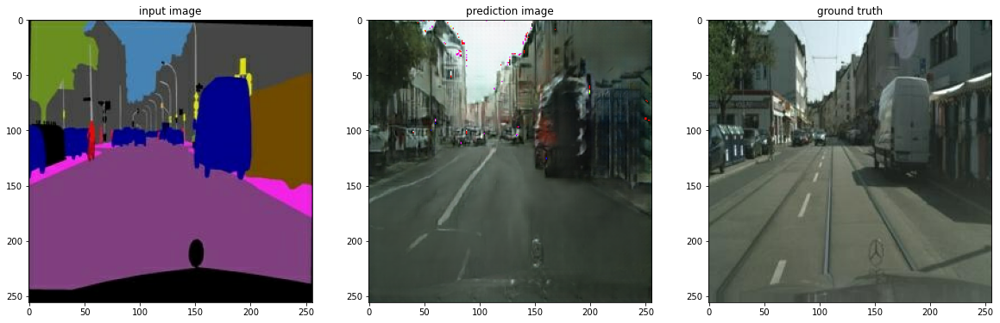

In [22]:
# 테스트 및 시각화
# ground truth와 비교하면 제법 비슷하게 나왔지만 하늘과 건물의 경계에서 아직 제대로 채색이 되지 않은 부분이 있고
# 자동차와 같은 복잡한 색을 가지고 있는 객체도 제대로 표현이 되지 않았다.
# 다만 도로와 선 같은 경우 연속적인 부분이 많아 채색이 제대로 표현되었다.


test_ind = 2

f = val_path + os.listdir(val_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1); plt.imshow(denormalize(sketch)); plt.title('input image')
plt.subplot(1,3,2); plt.imshow(pred[0]); plt.title('prediction image')
plt.subplot(1,3,3); plt.imshow(denormalize(colored)); plt.title('ground truth')

### loss 시각화
- 총 500 epochs동안 250 steps가 진행됨. (총 125,000 개의 loss 데이터 저장됨)  

generator loss, discriminator loss 모두 비슷한 양상으로 증가/감소를 반복했지만 discriminator loss의 경우 시간이 갈수록 감소하는 경향 확인  
원래대로라면 0.5로 수렴해야하지만 그렇지는 못했다.

Text(0.5, 1.0, 'discriminator loss')

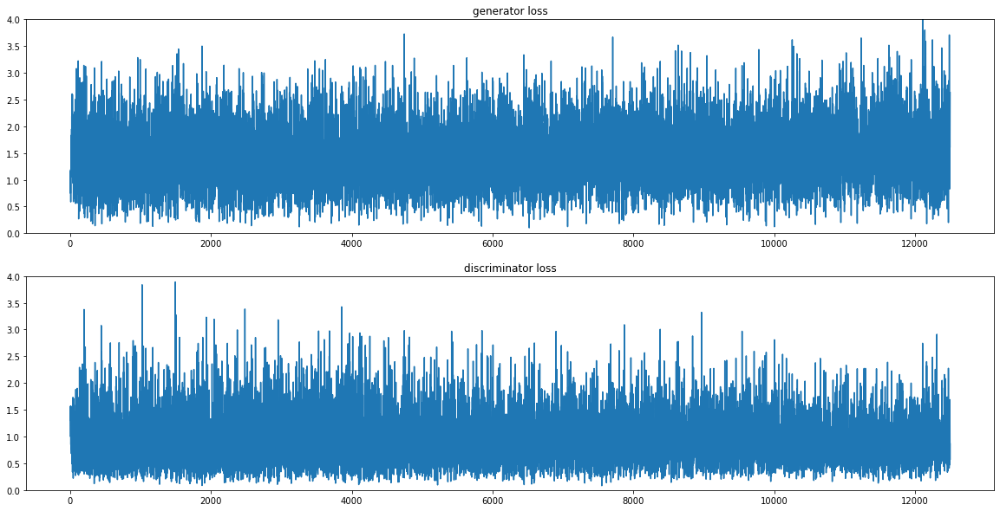

In [25]:
plt.figure(figsize=(20,10))

plt.subplot(2,1,1)
plt.plot(g_loss_list)
plt.ylim(0, 4)
plt.title('generator loss')

plt.subplot(2,1,2)
plt.plot(d_loss_list)
plt.ylim(0, 4)
plt.title('discriminator loss')

# plt.subplot(3,1,3)
# plt.plot(l1_loss_list)
# plt.ylim(0, 0.4)
# plt.title('L1 loss')

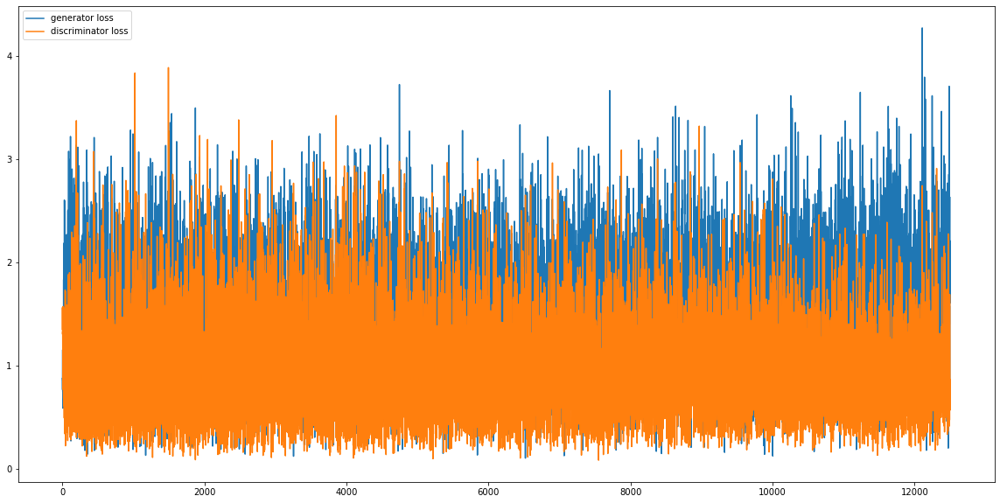

In [31]:
plt.figure(figsize=(20,10))
plt.plot(g_loss_list, label='generator loss')
plt.plot(d_loss_list, label='discriminator loss')
plt.legend()

***

# 2. 회고

## 2-1. 루브릭 평가
### 1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.  
(데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.)  

### 2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.  
(U-Net generator, discriminator 모델 구현이 완료되어 train_step이 안정적으로 진행됨을 확인하였다.)  

### 3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.  
(10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.)  


## 2-2. 회고
1. GAN을 했을 때 공부했던 pix2pix에 대해 다뤄봐서 '놓친 주제'가 되지 않아 좋았다.  
2. 그리고 앞선 설명에서 포켓몬 데이터를 활용해 시각화를 하니 친숙하고 이해도 잘 되는 느낌  
3. 하지만 역시 GAN이기에 매우 많은 시간이 걸렸다. (결과물은 놀라웠지만.)  
4. 마지막 Exploration을 진행하는데 오프라인을 진행하면서 질문을 통해 금방 이해할 수 있어 매우 좋았다!  
5. 그런데 학습 시 loss변화가 적절한 지 모르겠다. 이론 학습시에는 0.5로 수렴하는게 맞는 것 같은데 같은 구간을 계속 왔다갔다만 했다...??  
5. 고잉디퍼에서도 다시 한번 GAN이 나올 것 같은데 생성자, 판별자에 대한 정확도와 손실에 대한 고찰이 필요해 보인다.